#Time Series Analysis Project

**Objective**: The task is to analyze a time series, build forecasting models, and evaluate the results. The document requires splitting the dataset into two training/testing scenarios (80/20 and 90/10) and performing the following steps: descriptive analysis of the data, plotting graphs, estimating the autocorrelation function (ACF), and building models including Naive, AR, MA, ARMA, and ARIMA. The models need to be evaluated using the RMSE metric on the out-of-sample data, and special emphasis should be placed on the characteristics of the ACF in the discussion section.



# GROUP PROJECT
## COURSE: FORECASTING TECHNIQUES
### Lecturer: Dr. Dao Vu Truong Son

| Name                      | ID          | % Contribution |
|---------------------------|-------------|----------------|
| Nguyễn Phương Anh         | MLSIU24017  | 25%            |
| Nguyễn Thị Xuân Kiều      | MLSIU24025  | 25%            |
| Vương Khả Anh Sơn         | MLSIU24033  | 25%            |
| Nguyễn Thị Hoài Trang     | MLSIU24036  | 25%            |

Ho Chi Minh City, 06 September 2025

## README

The project involves the following key steps:
* **Descriptive Analysis**: Understanding the statistical properties of the data.
* **Data Visualization**: Plotting graphs to identify trends, seasonality, and other patterns.
* **Autocorrelation Analysis**: Estimating and analyzing the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF).
* **Model Building**: Implementing and training several forecasting models, including:
    * Naive Model
    * Autoregressive (AR)
    * Moving Average (MA)
    * ARMA (Autoregressive Moving Average)
    * ARIMA (Autoregressive Integrated Moving Average)
* **Model Evaluation**: Assessing the models' performance on out-of-sample data using the Root Mean Squared Error (RMSE) metric.

The project also explores splitting the dataset into 80/20 and 90/10 training/testing scenarios for robust evaluation.

## Environment

This notebook is designed to be run in **Google Colab**.
* All required Python libraries (`pandas`, `statsmodels`, `arch`, etc.) will be automatically installed by a setup cell within the notebook itself. You do not need to install them manually.

## Dataset

This project requires the `data giao hang update-2.xlsx` file. You will need to upload this file to your Colab session when prompted by the notebook.

## How to Run in Google Colab

1.  **Open the Notebook**: Open the `01_time_series_project_colab.ipynb` file in Google Colab.
2.  **Run the Setup Cells**: Execute the first few code cells to import libraries. The notebook will handle the installation of any missing packages.
3.  **Upload the Data**: Run the cell that contains `from google.colab import files`. You will see a button to "Choose Files". Click it and select the `data giao hang update-2.xlsx` file from your local machine.
    
    ```python
    # Look for this code block in the notebook
    from google.colab import files
    uploaded = files.upload()
    ```

4.  **Execute All Cells**: Once the data is uploaded, continue to run the remaining cells in the notebook sequentially from top to bottom to perform the analysis, train the models, and see the results.

# Python Setup: Libraries & Data

First, we import the required libraries. We will use **pandas** and **numpy** for data manipulation, **matplotlib** and **seaborn** for visualization, and **statsmodels** together with **scikit-learn** for building and evaluating time series models. In addition, the project environment check also includes **tensorflow** and **scipy**, which provide support for deep learning (e.g., LSTM models) and advanced statistical functions, ensuring that all components needed for the time series analysis project are available.


In [92]:
# @title Library Status
from importlib.util import find_spec
try:
    from importlib.metadata import version as _ver
except Exception:
    from pkg_resources import get_distribution as _gd
    _ver = lambda p: _gd(p).version

from IPython.display import HTML, display
import subprocess, sys, io, os

REQ = ["pandas","numpy","matplotlib","seaborn","statsmodels","sklearn","tensorflow","scipy"]
NAME_MAP = {"sklearn":"scikit-learn"}

def libs_status(pkgs):
    rows, miss = [], []
    for p in pkgs:
        ok = find_spec(p) is not None
        v = "-"
        if ok:
            try: v = _ver(NAME_MAP.get(p,p))
            except Exception: v = "?"
        else: miss.append(p)
        rows.append({"name":p, "installed":ok, "version":v})
    return rows, miss

def show_alert(rows, title="Library Check"):
    css = """<style>.lib-wrap{font-family:ui-sans-serif,system-ui,-apple-system,"Segoe UI",Roboto;margin:10px 0}
.lib-title{font-size:20px;font-weight:700;margin-bottom:8px}.grid{display:grid;grid-template-columns:repeat(auto-fill,minmax(220px,1fr));gap:10px}
.card{border-radius:12px;padding:12px 14px;box-shadow:0 1px 4px rgba(0,0,0,.06);border:1px solid rgba(0,0,0,.06)}
.ok{background:#f0fdf4;border-color:#86efac}.miss{background:#fef2f2;border-color:#fecaca}
.title{display:flex;align-items:center;gap:8px;font-weight:700;margin-bottom:6px}.badge{font-size:12px;padding:2px 8px;border-radius:999px;font-weight:700}
.b-ok{background:#22c55e;color:#fff}.b-miss{background:#ef4444;color:#fff}.ver{font-size:12px;color:#374151}.summary{margin:10px 0 14px;font-size:14px}
.code{font-family:ui-monospace,SFMono-Regular,Menlo,Monaco,Consolas,"Liberation Mono","Courier New",monospace;background:#0b1020;color:#e5e7eb;padding:10px 12px;border-radius:8px;overflow:auto}</style>"""
    def card(r):
        if r["installed"]:
            return f"""<div class="card ok"><div class="title">✅ <span>{r['name']}</span><span class="badge b-ok">Available</span></div><div class="ver">Version: <b>{r['version']}</b></div></div>"""
        return f"""<div class="card miss"><div class="title">❌ <span>{r['name']}</span><span class="badge b-miss">Missing</span></div><div class="ver">Version: -</div></div>"""
    ok, no = [r for r in rows if r["installed"]], [r for r in rows if not r["installed"]]
    html = [css, f'<div class="lib-wrap"><div class="lib-title">{title}</div>',
            f'<div class="summary">✅ Ready: <b>{len(ok)}</b> &nbsp;|&nbsp; ❌ Missing: <b>{len(no)}</b></div><div class="grid">']
    html += [card(r) for r in rows]; html.append("</div></div>")
    display(HTML("".join(html)))

def install_missing(miss):
    if not miss: return
    pkgs = [NAME_MAP.get(p,p) for p in miss]
    print("⚠️ Installing missing packages:", ", ".join(miss))
    subprocess.check_call([sys.executable, "-m", "pip", "install", "--quiet", *pkgs])

# ===== Run =====
auto_install = True
rows, missing = libs_status(REQ)
if auto_install and missing:
    install_missing(missing)
    rows, missing = libs_status(REQ)

show_alert(rows, title="Time Series Project • Library Status")
if missing:
    cmd = "pip install " + " ".join(NAME_MAP.get(p,p) for p in missing)
    display(HTML(f'<div class="code">$ {cmd}</div>'))

In [93]:
!pip install arch

In [141]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns, statsmodels.api as sm, tensorflow as tf
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.stattools import adfuller, kpss, acf, pacf
from statsmodels.stats.stattools import jarque_bera
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot
from statsmodels.tsa.seasonal import seasonal_decompose
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.callbacks import EarlyStopping
from scipy.stats import skew
from scipy.stats import boxcox
from scipy.special import inv_boxcox

from scipy import stats

from statsmodels.tsa.statespace.sarimax import SARIMAX

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import TimeSeriesSplit
from IPython.display import display

from itertools import product

sns.set_style('whitegrid')

import warnings

# tắt mọi FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning)

# nếu chỉ muốn tắt đúng warning từ sklearn:
warnings.filterwarnings("ignore",
    message=".*force_all_finite.*",
    category=FutureWarning
)

# Ẩn log của TensorFlow
tf.get_logger().setLevel('ERROR')

# Ẩn đúng warning của EarlyStopping
warnings.filterwarnings(
    'ignore',
    message='Early stopping conditioned on metric'
)

# Tắt ConvergenceWarning của statsmodels
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings('ignore', category=ConvergenceWarning)

# Tắt mọi UserWarning chung (ví dụ “Too few observations…”)
warnings.filterwarnings('ignore', category=UserWarning)

In [95]:
# For file upload in Colab.  If using Jupyter, just read the file directly.
try:
    from google.colab import files
    uploaded = files.upload()
    file_name = list(uploaded.keys())[0]
except Exception:
    file_name = 'data giao hang update-2.xlsx'  # make sure the file exists in the current directory

Saving data giao hang update-2.xlsx to data giao hang update-2 (1).xlsx


#Upload and Data Exploration

We need to load the time series data into a pandas DataFrame. The dataset should contain a time column (for example: Date) and a value column (for example: Value).

* Upload a CSV file from Google Drive or from your computer (using files.upload() or drive.mount() in Colab).

In [96]:
#df = pd.read_csv(file_name)
df = pd.read_excel(file_name)
# Standardise column names
if 'qty' in df.columns:
    df = df.rename(columns={'qty': 'Value'})
# Convert date column to datetime and set as index
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values('date').set_index('date')

# Xem vài dòng đầu
df.head(5)

,Value
date,
2025-02-04,2744.0
2025-02-05,3138.0
2025-02-06,3154.0
2025-02-07,3253.0
2025-02-08,3357.0


In [97]:
import pandas as pd

# mô tả tổng quan dataset
print("=== Info ===")
df.info()

# mô tả thống kê cơ bản
print("\n=== Statistical Summary ===")
print(df.describe())

# nếu bạn muốn bao gồm cả cột object/category:
print("\n=== Include All Columns ===")
print(df.describe(include='all'))

=== Info ===
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 189 entries, 2025-02-04 to 2025-08-11
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Value   189 non-null    float64
dtypes: float64(1)
memory usage: 3.0 KB

=== Statistical Summary ===
             Value
count   189.000000
mean   3353.235450
std     510.764007
min    1409.000000
25%    3102.000000
50%    3371.000000
75%    3707.000000
max    4395.000000

=== Include All Columns ===
             Value
count   189.000000
mean   3353.235450
std     510.764007
min    1409.000000
25%    3102.000000
50%    3371.000000
75%    3707.000000
max    4395.000000


<Axes: xlabel='date'>

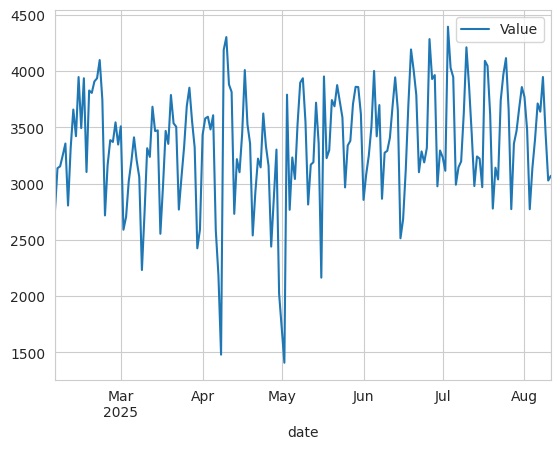

In [98]:
df.plot()

In [99]:
df['7_day_rolling'] = df['Value'].rolling(window = 7).mean()
df

,Value,7_day_rolling
date,,
2025-02-04,2744.0,NaN
2025-02-05,3138.0,NaN
2025-02-06,3154.0,NaN
2025-02-07,3253.0,NaN
2025-02-08,3357.0,NaN
...,...,...
2025-08-07,3640.0,3415.571429
2025-08-08,3948.0,3440.714286
2025-08-09,3450.0,3436.428571


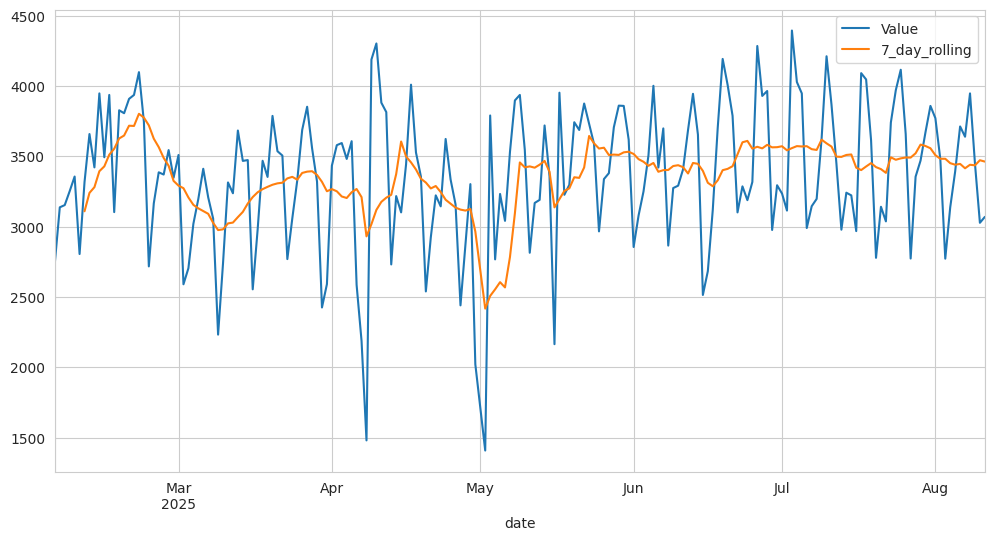

In [100]:
df[['Value','7_day_rolling']].plot(figsize=(12,6))
plt.show()

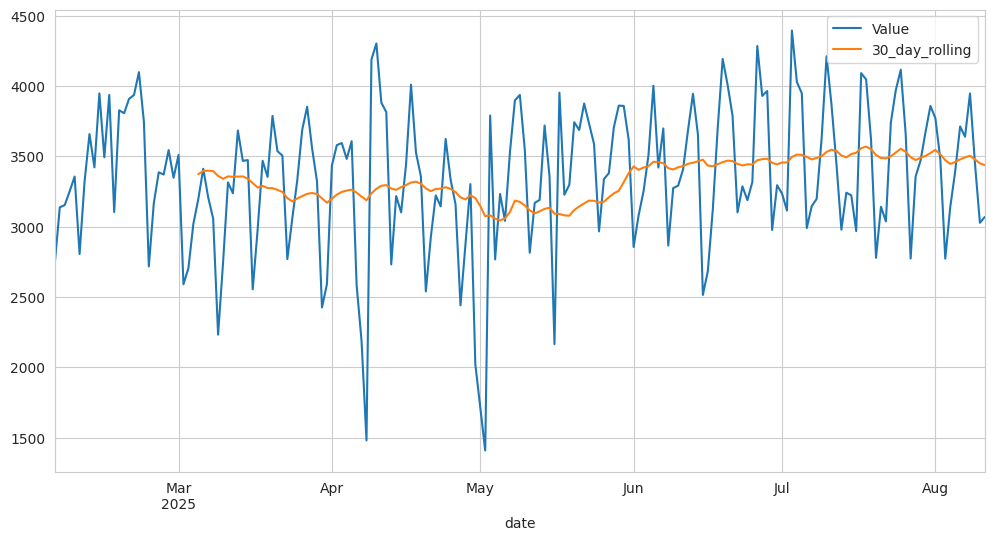

In [101]:
df['30_day_rolling'] = df['Value'].rolling(window = 30).mean()
df
df[['Value','30_day_rolling']].plot(figsize=(12,6))
plt.show()

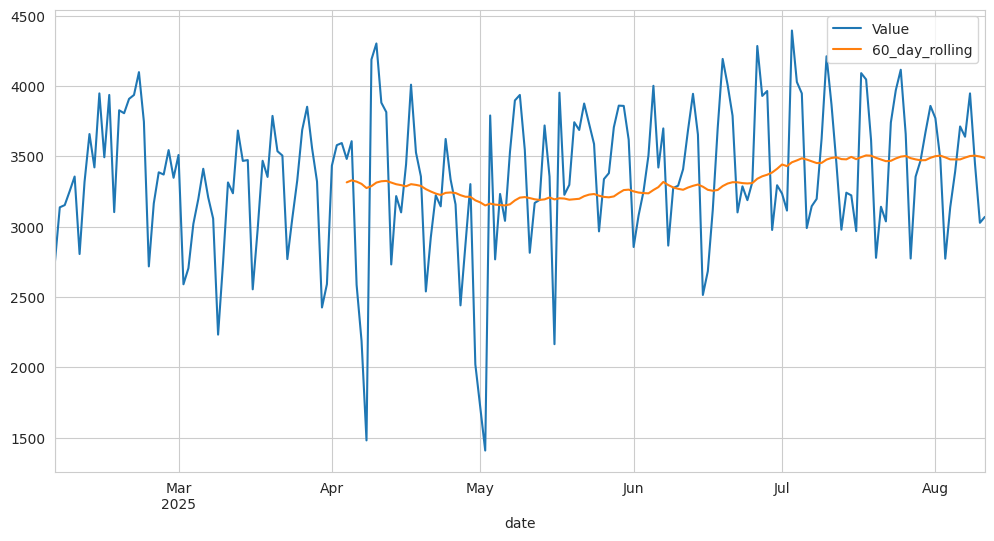

In [102]:
df['60_day_rolling'] = df['Value'].rolling(window = 60).mean()
df
df[['Value','60_day_rolling']].plot(figsize=(12,6))
plt.show()

In [103]:
df[['Value','7_day_rolling']].corr()

,Value,7_day_rolling
Value,1.00000,0.39682
7_day_rolling,0.39682,1.00000


In [104]:
df[['Value','30_day_rolling']].corr()

,Value,30_day_rolling
Value,1.000000,0.277627
30_day_rolling,0.277627,1.000000


#Data Manipulation for Forecasting

In [105]:
# Identify missing values
df.isnull().sum()

,0
Value,0
7_day_rolling,6
30_day_rolling,29
60_day_rolling,59


In [106]:
#Fill Missing Values
df['7_day_rolling'].fillna(method='ffill', inplace=True)
df.isnull().sum()

,0
Value,0
7_day_rolling,6
30_day_rolling,29
60_day_rolling,59


In [107]:
# Extract Time Variables
df[ 'year'] = df.index.year
df[ 'month'] =df.index.month
df['day'] = df.index.day
df['weekday'] = df.index.dayofweek
df['day_name'] = df.index.day_name()
df['quarter'] = df.index.quarter

df. head(30)

,Value,7_day_rolling,30_day_rolling,60_day_rolling,year,month,day,weekday,day_name,quarter
date,,,,,,,,,,
2025-02-04,2744.0,NaN,NaN,NaN,2025,2,4,1,Tuesday,1
2025-02-05,3138.0,NaN,NaN,NaN,2025,2,5,2,Wednesday,1
2025-02-06,3154.0,NaN,NaN,NaN,2025,2,6,3,Thursday,1
2025-02-07,3253.0,NaN,NaN,NaN,2025,2,7,4,Friday,1
2025-02-08,3357.0,NaN,NaN,NaN,2025,2,8,5,Saturday,1
2025-02-09,2806.0,NaN,NaN,NaN,2025,2,9,6,Sunday,1
2025-02-10,3318.0,3110.000000,NaN,NaN,2025,2,10,0,Monday,1
2025-02-11,3659.0,3240.714286,NaN,NaN,2025,2,11,1,Tuesday,1
2025-02-12,3422.0,3281.285714,NaN,NaN,2025,2,12,2,Wednesday,1


In [108]:
# Feature Engineering - Lagged values
df['Value_lag1'] = df['Value'].shift(1)
df['Value_lag2'] = df['Value'].shift(2)

#Visualizing Seasonal Patterns

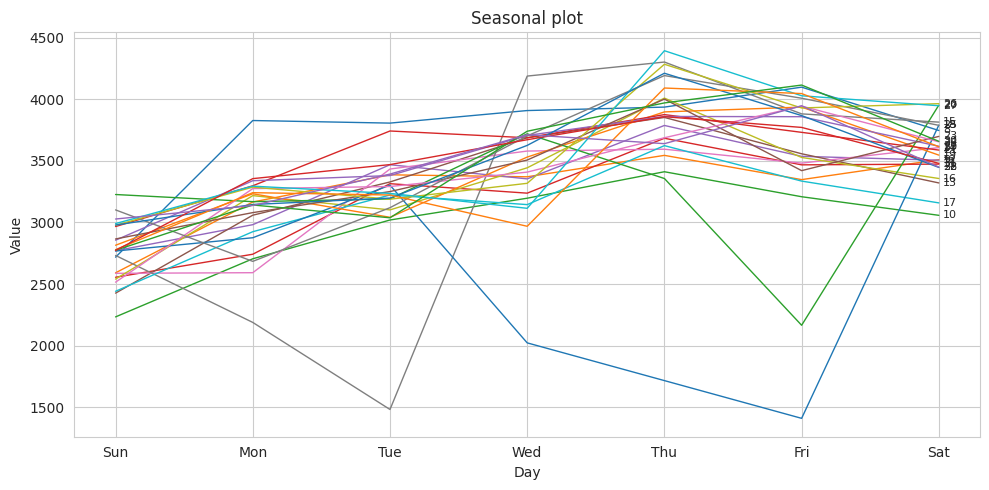

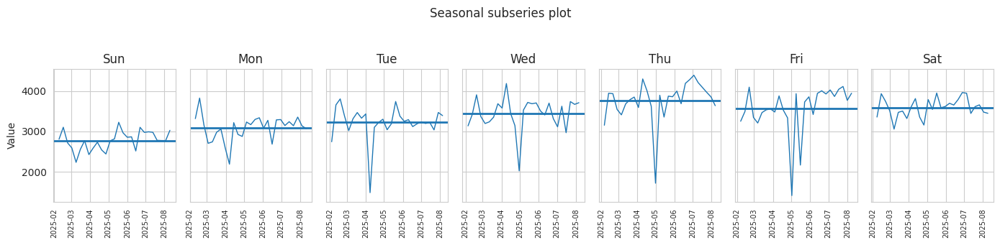

In [109]:
# --- prep ---
val_col = next(c for c in ('qty','Value') if c in df.columns)
s = (pd.to_numeric(df[val_col], errors='coerce')
       .dropna()
       .asfreq('D')
       .interpolate('time'))

DOW = ['Sun','Mon','Tue','Wed','Thu','Fri','Sat']
dfw = pd.DataFrame({
    'v': s.values,
    'd': (s.index.dayofweek + 1) % 7,          # 0=Sun ... 6=Sat
    'w': s.index.to_period('W-Sun')            # weeks end on Sat
}, index=s.index)

# --- seasonal plot (weekly, like ggseasonplot) ---
def season_plot_weekly(dfw, max_weeks=None, annotate=True, title='Seasonal plot'):
    piv = dfw.pivot_table(index='d', columns='w', values='v')
    if max_weeks: piv = piv.iloc[:, -max_weeks:]
    plt.figure(figsize=(10,5))
    for w in piv: plt.plot(range(7), piv[w].values, lw=1)
    plt.xticks(range(7), DOW); plt.xlabel('Day'); plt.ylabel('Value'); plt.title(title)
    if annotate:
        for w, y in piv.iloc[-1].items():
            plt.text(6.03, y, f"{w.start_time.isocalendar().week}", fontsize=8, va='center')
    plt.tight_layout(); plt.show()

# --- seasonal subseries plot (weekly, like ggsubseriesplot) ---
def seasonal_subseries_plot_weekly(dfw, title='Seasonal subseries plot'):
    fig, axs = plt.subplots(1, 7, figsize=(14,3.2), sharey=True)
    for d, ax in enumerate(axs):
        sub = dfw.loc[dfw['d']==d, 'v']
        ax.plot(sub.index, sub.values, lw=1); ax.axhline(sub.mean(), lw=2)
        ax.set_title(DOW[d]); ax.tick_params(axis='x', rotation=90, labelsize=7)
        if d==0: ax.set_ylabel('Value')
    fig.suptitle(title, y=1.05); plt.tight_layout(); plt.show()

# usage
season_plot_weekly(dfw, max_weeks=26, annotate=True, title='Seasonal plot')
seasonal_subseries_plot_weekly(dfw, title='Seasonal subseries plot')


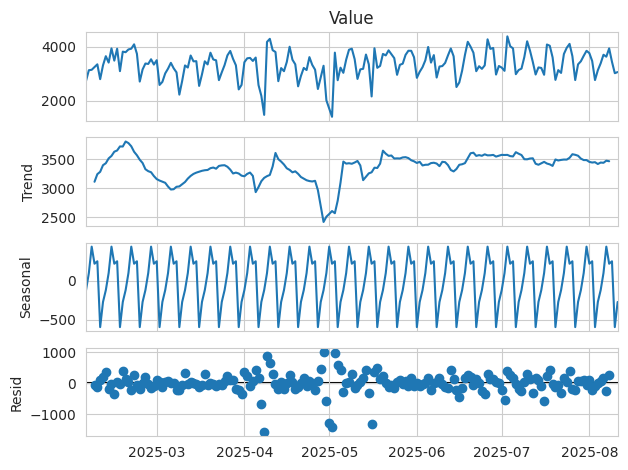

In [110]:
seasonal_decompose(df['Value'], model='additive', period=7).plot()
plt.show()

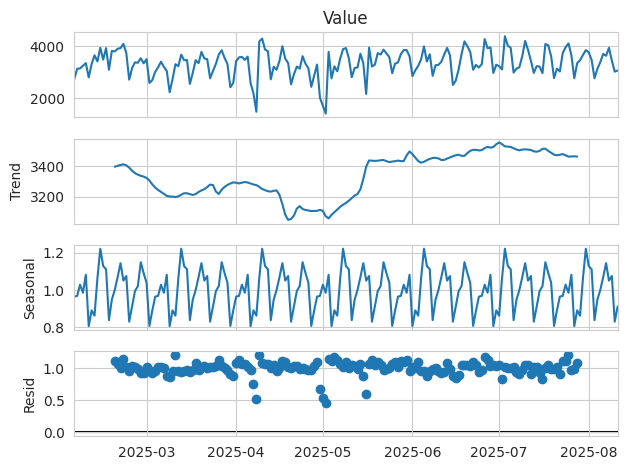

In [111]:
seasonal_decompose(df['Value'], model='multiplicative', period=28).plot()
plt.show()

Seasonality:
* 24 for hourly
* 7 or 365 for daily, but 7 is preferred for modeling
* 52 for weekly
* 12 for monthly
* 4 for quarterly
* 5 for weekdays

3. Data Preprocessing

Data preprocessing is the most important step to ensure that the forecasting model performs well. You need to check and handle:

* Data type and time index: make sure the time column is converted to datetime and set as the index.

* Missing data: identify missing values and choose a method to handle them (removal, interpolation, filling with the mean).

* Outliers: detect abnormal points using boxplots or statistical methods; decide whether to remove or replace them.

* Formatting and sorting: ensure the data is sorted in ascending time order; remove duplicate rows.

* Transformations: if the series is not stationary, you may need log-transformation, differencing, or Box-Cox transformation to achieve stationarity.

Value             float64
7_day_rolling     float64
30_day_rolling    float64
60_day_rolling    float64
year                int32
month               int32
day                 int32
weekday             int32
day_name           object
quarter             int32
Value_lag1        float64
Value_lag2        float64
dtype: object
Số lượng giá trị thiếu mỗi cột: Value              0
7_day_rolling      6
30_day_rolling    29
60_day_rolling    59
year               0
month              0
day                0
weekday            0
day_name           0
quarter            0
Value_lag1         1
Value_lag2         2
dtype: int64
Số lượng chỉ mục thời gian trùng lặp: 0


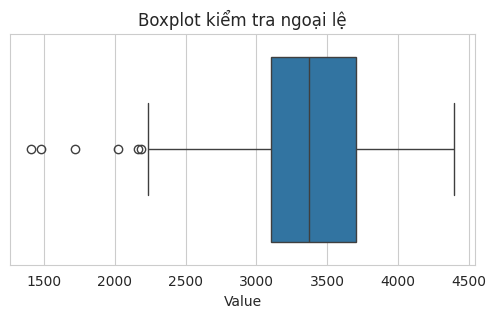

In [112]:
# Kiểm tra kiểu dữ liệu
print(df.dtypes)

# Kiểm tra dữ liệu bị thiếu
missing_counts = df.isna().sum()
print('Số lượng giá trị thiếu mỗi cột:', missing_counts)

# Nếu có giá trị thiếu, ví dụ điền bằng nội suy tuyến tính
#df['Value'] = df['Value'].interpolate(method='linear')

# Kiểm tra dữ liệu trùng lặp
duplicate_count = df.index.duplicated().sum()
print(f'Số lượng chỉ mục thời gian trùng lặp: {duplicate_count}')

# Phát hiện ngoại lệ bằng biểu đồ hộp
plt.figure(figsize=(6,3))
sns.boxplot(x=df['Value'])
plt.title('Boxplot kiểm tra ngoại lệ')
plt.show()

=== Info Before ===
Dtypes:
 Value             float64
7_day_rolling     float64
30_day_rolling    float64
60_day_rolling    float64
year                int32
month               int32
day                 int32
weekday             int32
day_name           object
quarter             int32
Value_lag1        float64
Value_lag2        float64
dtype: object
Missing per column:
 Value              0
7_day_rolling      6
30_day_rolling    29
60_day_rolling    59
year               0
month              0
day                0
weekday            0
day_name           0
quarter            0
Value_lag1         1
Value_lag2         2
dtype: int64
Duplicate time indices: 0

--- Describe Before ---
count     189.000000
mean     3353.235450
std       510.764007
min      1409.000000
25%      3102.000000
50%      3371.000000
75%      3707.000000
max      4395.000000
Name: Value, dtype: float64

Outliers detected: 6

--- Describe After ---
count     189.000000
mean     3406.629630
std       427.608939
min

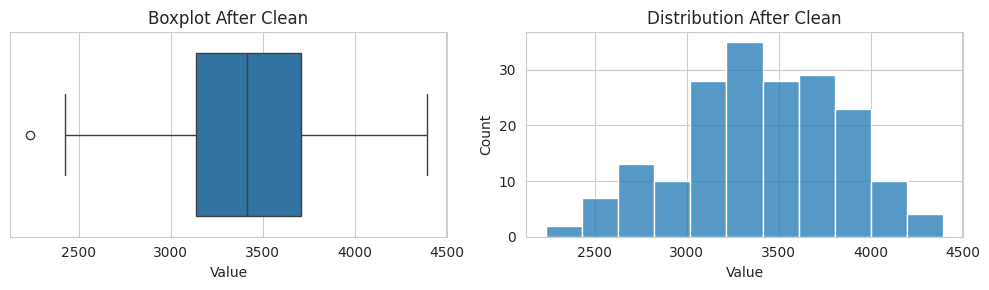

In [113]:
# --- Data check & preprocessing ---

print("=== Info Before ===")
print("Dtypes:\n", df.dtypes)
print("Missing per column:\n", df.isna().sum())
print("Duplicate time indices:", df.index.duplicated().sum())
print("\n--- Describe Before ---")
print(df['Value'].describe())

# Fill missing with linear interpolation
df['Value'] = df['Value'].interpolate('linear')

# Detect outliers (IQR)
Q1, Q3 = df['Value'].quantile([.25,.75])
IQR = Q3 - Q1
low, up = Q1 - 1.5*IQR, Q3 + 1.5*IQR
outliers = (df['Value'] < low) | (df['Value'] > up)
print("\nOutliers detected:", outliers.sum())

# Replace outliers with NaN → interpolate
df.loc[outliers,'Value'] = np.nan
df['Value'] = df['Value'].interpolate()

print("\n--- Describe After ---")
print(df['Value'].describe())

# Boxplots + histogram after cleaning
fig, ax = plt.subplots(1,2,figsize=(10,3))
sns.boxplot(x=df['Value'], ax=ax[0]); ax[0].set_title("Boxplot After Clean")
sns.histplot(df['Value'], ax=ax[1]); ax[1].set_title("Distribution After Clean")
plt.tight_layout(); plt.show()

In [114]:
# Giữ dữ liệu trong khoảng [P5, P90] hoặc [P5, P95]
lower = df['Value'].quantile(0.05)   # ngưỡng dưới
upper = df['Value'].quantile(0.90)   # ngưỡng trên (P90)
df['Value_winsor'] = np.clip(df['Value'], lower, upper)

print("Ngưỡng dưới:", lower, "Ngưỡng trên:", upper)

Ngưỡng dưới: 2692.4 Ngưỡng trên: 3948.0


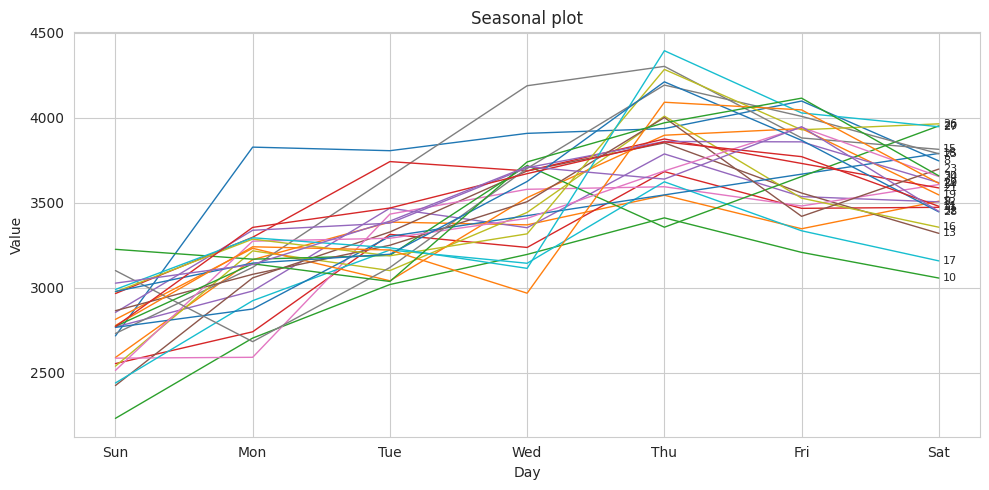

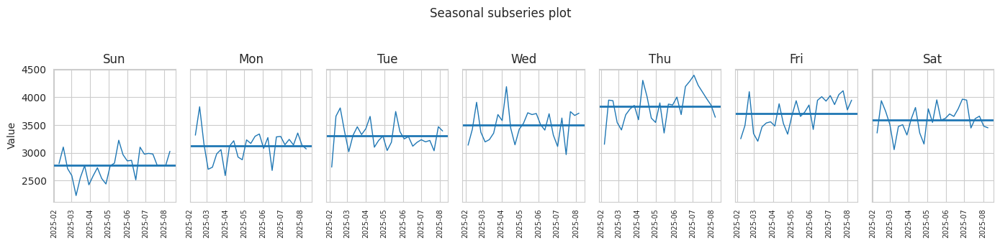

In [115]:
# --- prep ---
val_col = next(c for c in ('qty','Value') if c in df.columns)
s = (pd.to_numeric(df[val_col], errors='coerce')
       .dropna()
       .asfreq('D')
       .interpolate('time'))

DOW = ['Sun','Mon','Tue','Wed','Thu','Fri','Sat']
dfw = pd.DataFrame({
    'v': s.values,
    'd': (s.index.dayofweek + 1) % 7,          # 0=Sun ... 6=Sat
    'w': s.index.to_period('W-Sun')            # weeks end on Sat
}, index=s.index)

# --- seasonal plot (weekly, like ggseasonplot) ---
def season_plot_weekly(dfw, max_weeks=None, annotate=True, title='Seasonal plot'):
    piv = dfw.pivot_table(index='d', columns='w', values='v')
    if max_weeks: piv = piv.iloc[:, -max_weeks:]
    plt.figure(figsize=(10,5))
    for w in piv: plt.plot(range(7), piv[w].values, lw=1)
    plt.xticks(range(7), DOW); plt.xlabel('Day'); plt.ylabel('Value'); plt.title(title)
    if annotate:
        for w, y in piv.iloc[-1].items():
            plt.text(6.03, y, f"{w.start_time.isocalendar().week}", fontsize=8, va='center')
    plt.tight_layout(); plt.show()

# --- seasonal subseries plot (weekly, like ggsubseriesplot) ---
def seasonal_subseries_plot_weekly(dfw, title='Seasonal subseries plot'):
    fig, axs = plt.subplots(1, 7, figsize=(14,3.2), sharey=True)
    for d, ax in enumerate(axs):
        sub = dfw.loc[dfw['d']==d, 'v']
        ax.plot(sub.index, sub.values, lw=1); ax.axhline(sub.mean(), lw=2)
        ax.set_title(DOW[d]); ax.tick_params(axis='x', rotation=90, labelsize=7)
        if d==0: ax.set_ylabel('Value')
    fig.suptitle(title, y=1.05); plt.tight_layout(); plt.show()

# usage
season_plot_weekly(dfw, max_weeks=26, annotate=True, title='Seasonal plot')
seasonal_subseries_plot_weekly(dfw, title='Seasonal subseries plot')

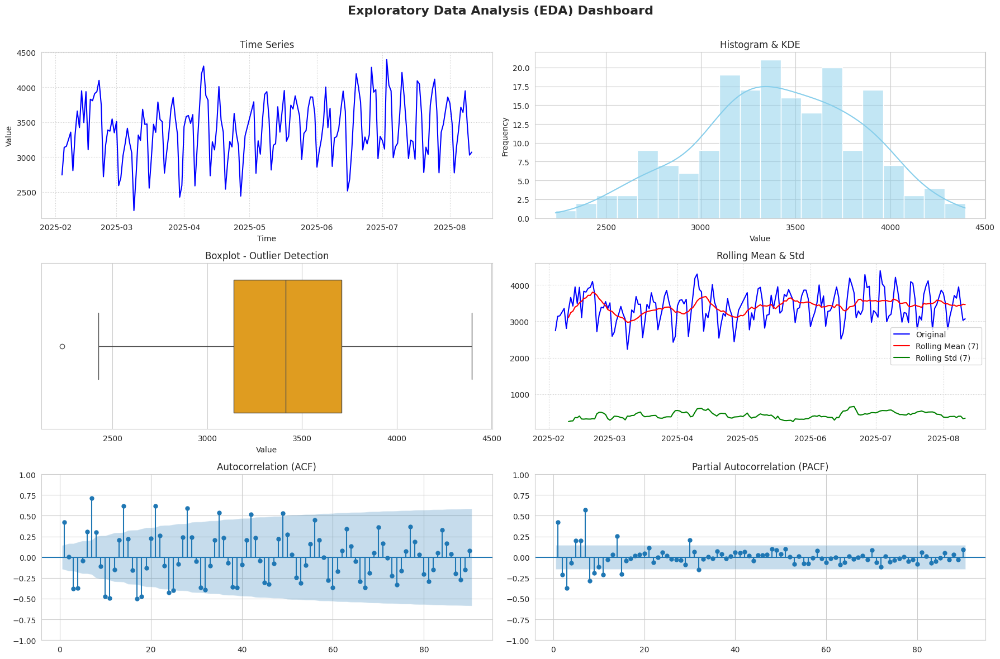

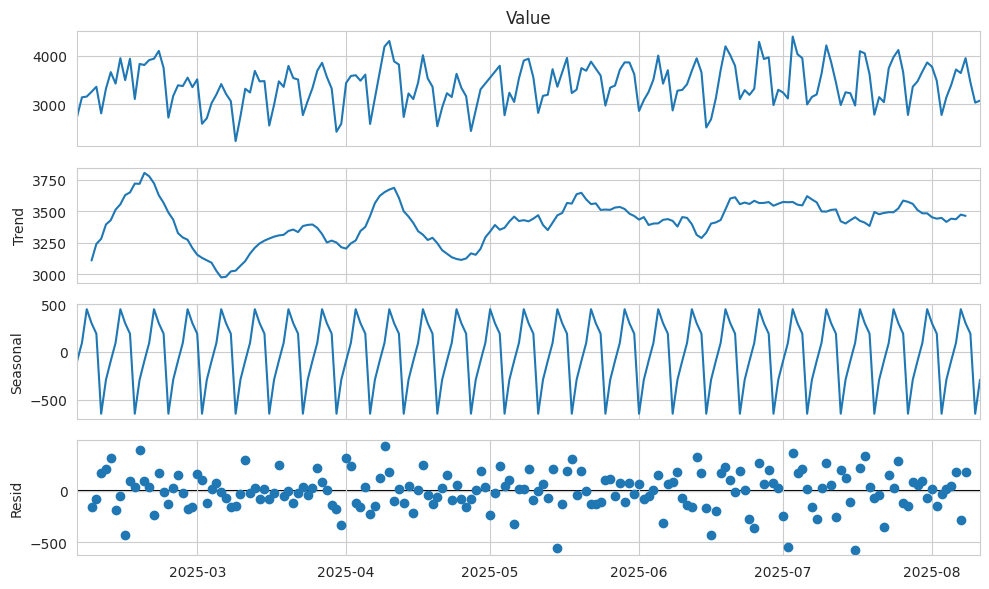

In [116]:
# --- Tính Rolling Mean & Std ---
rolling_mean = df['Value'].rolling(window=7).mean()
rolling_std = df['Value'].rolling(window=7).std()

# --- Tạo figure nhiều subplot ---
fig, axes = plt.subplots(3, 2, figsize=(18, 12))
fig.suptitle('Exploratory Data Analysis (EDA) Dashboard', fontsize=16, fontweight='bold')

# 1. Time Series Plot
axes[0,0].plot(df.index, df['Value'], color='blue')
axes[0,0].set_title('Time Series')
axes[0,0].set_xlabel('Time')
axes[0,0].set_ylabel('Value')
axes[0,0].grid(True, linestyle=':')

# 2. Histogram & KDE
sns.histplot(df['Value'], kde=True, bins=20, color='skyblue', ax=axes[0,1])
axes[0,1].set_title('Histogram & KDE')
axes[0,1].set_xlabel('Value')
axes[0,1].set_ylabel('Frequency')

# 3. Boxplot
sns.boxplot(x=df['Value'], color='orange', ax=axes[1,0])
axes[1,0].set_title('Boxplot - Outlier Detection')
axes[1,0].set_xlabel('Value')

# 4. Rolling Mean & Std
axes[1,1].plot(df['Value'], label='Original', color='blue')
axes[1,1].plot(rolling_mean, label='Rolling Mean (7)', color='red')
axes[1,1].plot(rolling_std, label='Rolling Std (7)', color='green')
axes[1,1].set_title('Rolling Mean & Std')
axes[1,1].legend()
axes[1,1].grid(True, linestyle=':')

# 5. ACF
plot_acf(df['Value'], lags=90, alpha=0.05, ax=axes[2,0], zero=False) # Exclude lag 0
axes[2,0].set_title('Autocorrelation (ACF)')

# 6. PACF
plot_pacf(df['Value'], lags=90, alpha=0.05, ax=axes[2,1], zero=False) # Exclude lag 0, removed method='ywm'
axes[2,1].set_title('Partial Autocorrelation (PACF)')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# --- Seasonal Decomposition riêng (vì chiếm nhiều chỗ) ---
decomposition = seasonal_decompose(df['Value'], model='additive', period=7)
fig2 = decomposition.plot()
fig2.set_size_inches(10, 6)
fig2.tight_layout()
plt.show()

In [119]:
'''# ==========================
# NUMERICAL DESCRIPTION BLOCK
# ==========================
y = df['Value'].astype(float)  # đảm bảo numeric
y_clean = y.dropna()

# Tham số tuỳ chỉnh
MAX_LAG = 11
SEASONAL_PERIOD = 12  # đổi nếu chu kỳ khác (ví dụ tuần=7, quý=4, v.v.)

# Thống kê cơ bản
basic_stats = {
    'count': y_clean.size,
    'missing': y.isna().sum(),
    'start': y_clean.index.min(),
    'end': y_clean.index.max(),
    'mean': y_clean.mean(),
    'median': y_clean.median(),
    'std (ddof=1)': y_clean.std(ddof=1),
    'var (ddof=1)': y_clean.var(ddof=1),
    'CV = std/mean': (y_clean.std(ddof=1) / y_clean.mean()) if y_clean.mean() != 0 else np.nan,
    'min': y_clean.min(),
    'Q1 (25%)': y_clean.quantile(0.25),
    'Q3 (75%)': y_clean.quantile(0.75),
    'IQR': y_clean.quantile(0.75) - y_clean.quantile(0.25),
    'max': y_clean.max(),
    'skewness': y_clean.skew(),
    'kurtosis': y_clean.kurt()
}
basic_df = pd.DataFrame.from_dict(basic_stats, orient='index', columns=['Value'])

# Kiểm định tính dừng & chuẩn hoá
# ADF (H0: có đơn vị gốc -> không dừng)
adf_stat, adf_p, _, _, adf_crit, _ = adfuller(y_clean)
# KPSS (H0: dừng theo mức) → p nhỏ bác bỏ dừng
kpss_stat, kpss_p, _, _ = kpss(y_clean, nlags='auto')
# Jarque–Bera (H0: phân phối chuẩn)
from statsmodels.stats.stattools import jarque_bera
jb_stat, jb_pvalue, jb_skew, jb_kurt = jarque_bera(y_clean)

tests_df = pd.DataFrame({
    'stat': [adf_stat, kpss_stat, jb_stat],
    'p_value': [adf_p, kpss_p, jb_pvalue]
}, index=['ADF', 'KPSS', 'Jarque-Bera'])

# Bảng Covariance & Correlation theo độ trễ (y_t với y_{t-lag})
lag_rows = []
for L in range(1, MAX_LAG + 1):
    pairs = pd.DataFrame({'y': y_clean, f'y_lag{L}': y_clean.shift(L)}).dropna()
    cov = pairs['y'].cov(pairs[f'y_lag{L}'])
    corr = pairs['y'].corr(pairs[f'y_lag{L}'])
    lag_rows.append({'lag': L, 'covariance': cov, 'correlation': corr})
lag_corr_df = pd.DataFrame(lag_rows)

# Ma trận tương quan giữa y, diff(1), diff(SEASONAL_PERIOD)
feats = pd.DataFrame({'y': y_clean})
feats['diff1'] = y_clean.diff(1)
feats[f'diff{SEASONAL_PERIOD}'] = y_clean.diff(SEASONAL_PERIOD)
corr_matrix = feats.corr()

# Ljung–Box cho đến MAX_LAG (kiểm tra tự tương quan tổng quát)
from statsmodels.stats.diagnostic import acorr_ljungbox
lb = acorr_ljungbox(y_clean, lags=MAX_LAG, return_df=True)
# cột 'lb_pvalue' là p-value theo từng lag
ljung_box_df = lb.rename(columns={'lb_stat':'LB stat','lb_pvalue':'LB p-value'})

# ==========================
# HIỂN THỊ / LƯU KẾT QUẢ
# ==========================
print("\n=== Basic Descriptive Statistics ===")
print(basic_df.round(4))

print("\n=== Stationarity & Normality Tests ===")
print(tests_df.round(4))
print("ADF critical values:", {k: round(v,4) for k,v in adf_crit.items()})

print(f"\n=== Lag Covariance & Correlation (1..{MAX_LAG}) ===")
print(lag_corr_df.round(4).head(10))  # xem trước 10 dòng đầu

print("\n=== Correlation Matrix: y, diff(1), diff(seasonal) ===")
print(corr_matrix.round(4))

print(f"\n=== Ljung–Box up to lag {MAX_LAG} ===")
print(ljung_box_df.round(4).head(10))'''

'# ==========================\n# NUMERICAL DESCRIPTION BLOCK\n# ==========================\ny = df[\'Value\'].astype(float)  # đảm bảo numeric\ny_clean = y.dropna()\n\n# Tham số tuỳ chỉnh\nMAX_LAG = 11\nSEASONAL_PERIOD = 12  # đổi nếu chu kỳ khác (ví dụ tuần=7, quý=4, v.v.)\n\n# Thống kê cơ bản\nbasic_stats = {\n    \'count\': y_clean.size,\n    \'missing\': y.isna().sum(),\n    \'start\': y_clean.index.min(),\n    \'end\': y_clean.index.max(),\n    \'mean\': y_clean.mean(),\n    \'median\': y_clean.median(),\n    \'std (ddof=1)\': y_clean.std(ddof=1),\n    \'var (ddof=1)\': y_clean.var(ddof=1),\n    \'CV = std/mean\': (y_clean.std(ddof=1) / y_clean.mean()) if y_clean.mean() != 0 else np.nan,\n    \'min\': y_clean.min(),\n    \'Q1 (25%)\': y_clean.quantile(0.25),\n    \'Q3 (75%)\': y_clean.quantile(0.75),\n    \'IQR\': y_clean.quantile(0.75) - y_clean.quantile(0.25),\n    \'max\': y_clean.max(),\n    \'skewness\': y_clean.skew(),\n    \'kurtosis\': y_clean.kurt()\n}\nbasic_df = pd.Data

In [120]:
def style_block_header(title):
    display(HTML(f"""
    <div style="font-size:18px;font-weight:700;margin:12px 0 6px 0;">
        {title}
    </div>"""))

# số → format có dấu phẩy, 3 chữ số thập phân
fmt_num = lambda x: f"{x:,.3f}" if isinstance(x,(int,float,np.floating)) else x

def stylize(df, caption=None, highlight_cols=None, precision=3):
    sty = (df.copy()
             .style
             .format(fmt_num)
             .set_table_styles([
                 {'selector':'th','props':[('text-align','center'),('font-weight','700')]},
                 {'selector':'td','props':[('text-align','right')]},
                 {'selector':'caption','props':[('caption-side','top'),
                                                ('font-size','14px'),
                                                ('font-weight','700'),
                                                ('text-align','left'),
                                                ('margin','4px 0 8px 0')]}
             ])
             .set_properties(**{'border':'1px solid #ddd','padding':'6px'})
          )
    if caption:
        sty = sty.set_caption(caption)
    if highlight_cols:
        for col in highlight_cols:
            if col in df.columns:
                sty = sty.bar(subset=[col], align='mid')  # thanh bar trực quan
    return sty

def highlight_pvalues(styler, col='p_value', alpha=0.05):
    # bôi đậm p < alpha
    def _hl(s):
        return ['font-weight:700;color:#d62728' if (isinstance(v,(int,float,np.floating)) and v<alpha) else '' for v in s]
    if col in styler.data.columns:
        styler = styler.apply(_hl, subset=[col], axis=0)
    return styler

# ================
# 1) Basic stats
# ================
style_block_header("Basic Descriptive Statistics")
basic_pretty = stylize(basic_df, caption="Basic statistics of the time series")
display(basic_pretty)

# ===================================
# 2) Stationarity & Normality Tests
# ===================================
style_block_header("Stationarity & Normality Tests")
tests_pretty = stylize(tests_df, caption="ADF, KPSS, Jarque–Bera")
tests_pretty = highlight_pvalues(tests_pretty, col='p_value', alpha=0.05)
display(tests_pretty)

# ADF critical values (đưa ra bảng gọn)
adf_cv_tbl = pd.DataFrame.from_dict({k: [v] for k,v in adf_crit.items()})
display(stylize(adf_cv_tbl, caption="ADF Critical Values"))

# ===========================================
# 3) Lag Covariance & Correlation (Top 12)
# ===========================================
style_block_header("Lag Covariance & Correlation")
lag_corr_top = lag_corr_df.head(12).set_index('lag')
lag_pretty = stylize(lag_corr_top, caption="Lag-1 … Lag-12", highlight_cols=['correlation'])
display(lag_pretty)

# ===========================================
# 4) Correlation Matrix: y, diff(1), diff(S)
# ===========================================
style_block_header("🔗 Correlation Matrix")
corr_pretty = (corr_matrix.copy()
               .style
               .format(fmt_num)
               .background_gradient(axis=None)) \
               .set_table_styles([{'selector':'caption','props':[('caption-side','top'),
                                                                ('font-size','14px'),
                                                                ('font-weight','700'),
                                                                ('text-align','left')]}]) \
               .set_caption("Correlation of y, diff(1), and seasonal diff")
display(corr_pretty)

# ===========================================
# 5) Ljung–Box up to lag MAX_LAG (top 12)
# ===========================================
style_block_header("📏 Ljung–Box Portmanteau Test")
lb_top = ljung_box_df.head(12)
lb_pretty = stylize(lb_top, caption=f"Ljung–Box (1..12 of {MAX_LAG})", highlight_cols=['LB stat'])
# highlight p-values < 0.05
def _hl_lb(s):
    return ['font-weight:700;color:#d62728' if (isinstance(v,(int,float,np.floating)) and v<0.05) else '' for v in s]
lb_pretty = lb_pretty.apply(_hl_lb, subset=['LB p-value'])
display(lb_pretty)

,Value
count,189.000
missing,0
start,2025-02-04 00:00:00
end,2025-08-11 00:00:00
mean,"3,406.630"
median,"3,412.000"
std (ddof=1),427.609
var (ddof=1),"182,849.405"
CV = std/mean,0.126
min,"2,233.000"


,stat,p_value
ADF,-3.340,0.013
KPSS,0.444,0.058
Jarque-Bera,2.335,0.311


,1%,5%,10%
0,-3.469,-2.878,-2.576


,covariance,correlation
lag,,
1,"77,842.389",0.427
2,935.474,0.005
3,"-70,816.469",-0.386
4,"-69,334.415",-0.377
5,"-7,831.455",-0.042
6,"58,202.009",0.316
7,"135,487.623",0.731
8,"57,212.434",0.308
9,"-20,616.616",-0.111


,y,diff1,diff12
y,1.000,0.532,0.761
diff1,0.532,1.000,0.135
diff12,0.761,0.135,1.000


,LB stat,LB p-value
1,34.437,0.000
2,34.442,0.000
3,62.613,0.000
4,89.485,0.000
5,89.826,0.000
6,108.541,0.000
7,209.447,0.000
8,227.342,0.000
9,229.647,0.000
10,274.910,0.000


In [121]:
# === ONE-PAGE INTERACTIVE EDA DASHBOARD (Plotly) ===
y = df['Value'].astype(float).dropna()

# ----- Prepare rolling stats -----
rolling_mean = y.rolling(12).mean()
rolling_std  = y.rolling(12).std()

# ----- ACF & PACF (và CI xấp xỉ) -----
NLAGS = 19
acf_vals = acf(y, nlags=NLAGS)
pacf_vals = pacf(y, nlags=NLAGS, method='ywm')
lags = np.arange(len(acf_vals))
ci95 = 1.96/np.sqrt(len(y))  # bound xấp xỉ cho ACF/PACF

# ----- Nếu chưa có basic_df / tests_df / corr_matrix thì tính nhanh -----
def _make_basic_df(s):
    out = {
        'count': s.size, 'missing': df['Value'].isna().sum(),
        'start': s.index.min(), 'end': s.index.max(),
        'mean': s.mean(), 'median': s.median(),
        'std': s.std(ddof=1), 'var': s.var(ddof=1),
        'CV = std/mean': s.std(ddof=1)/s.mean() if s.mean()!=0 else np.nan,
        'min': s.min(), 'Q1 (25%)': s.quantile(0.25),
        'Q3 (75%)': s.quantile(0.75), 'IQR': s.quantile(0.75)-s.quantile(0.25),
        'max': s.max(), 'skewness': s.skew(), 'kurtosis': s.kurt()
    }
    return pd.DataFrame.from_dict(out, orient='index', columns=['Value'])

def _make_tests_df(s):
    adf_stat, adf_p = adfuller(s)[0], adfuller(s)[1]
    kpss_stat, kpss_p = kpss(s, nlags='auto')
    from statsmodels.stats.stattools import jarque_bera
    jb_stat, jb_p, _, _ = jarque_bera(s)
    return pd.DataFrame({'Test': ['ADF','KPSS','Jarque–Bera'],
                         'stat': [adf_stat, kpss_stat, jb_stat],
                         'p_value': [adf_p, kpss_p, jb_p]})

try:
    basic_df
except NameError:
    basic_df = _make_basic_df(y)

try:
    tests_df
except NameError:
    tests_df = _make_tests_df(y)

try:
    corr_matrix
except NameError:
    feats = pd.DataFrame({'y': y, 'diff1': y.diff(1), 'diff12': y.diff(12)})
    corr_matrix = feats.corr()

# ----- Định dạng bảng (đưa về hai cột: Metric/Value) -----
basic_tbl = basic_df.copy()
basic_tbl.index.name = 'Metric'
basic_tbl = basic_tbl.reset_index()
basic_tbl['Value'] = basic_tbl['Value'].map(lambda v: f"{v:,.3f}" if isinstance(v,(int,float,np.floating)) else str(v))

tests_tbl = tests_df.copy()
tests_tbl['stat'] = tests_tbl['stat'].map(lambda v: f"{v:,.3f}")
tests_tbl['p_value'] = tests_tbl['p_value'].map(lambda v: f"{v:,.4f}")

# ----- Correlation heatmap data -----
heat_z = corr_matrix.values
heat_x = list(corr_matrix.columns)
heat_y = list(corr_matrix.index)

# ----- Make subplots layout -----
fig = make_subplots(
    rows=3, cols=3,
    specs=[
        [{"type":"xy","colspan":3}, None, None],      # Row1: time series spans 3 cols
        [{"type":"xy"}, {"type":"xy"}, {"type":"xy"}],# Row2: ACF | PACF | Histogram
        [{"type":"heatmap"}, {"type":"table"}, {"type":"table"}] # Row3: Corr heatmap | Basic | Tests
    ],
    subplot_titles=(
        "Time Series with Rolling Mean/Std",
        "ACF", "PACF", "Histogram",
        "Correlation Heatmap (y, diff1, diff12)",
        "Basic Descriptive Statistics", "Stationarity & Normality Tests"
    ),
    horizontal_spacing=0.08, vertical_spacing=0.12
)

# ---- Row1: time series + rolling lines ----
fig.add_trace(go.Scatter(x=y.index, y=y, name="Value", mode='lines'), row=1, col=1)
fig.add_trace(go.Scatter(x=rolling_mean.index, y=rolling_mean, name="Rolling Mean (12)", mode='lines'), row=1, col=1)
fig.add_trace(go.Scatter(x=rolling_std.index, y=rolling_std, name="Rolling Std (12)", mode='lines'), row=1, col=1)

# ---- Row2: ACF ----
fig.add_trace(go.Bar(x=lags[1:], y=acf_vals[1:], name="ACF"), row=2, col=1)
fig.add_hline(y= ci95, line_dash='dot', line_color='gray', row=2, col=1)
fig.add_hline(y=-ci95, line_dash='dot', line_color='gray', row=2, col=1)

# ---- Row2: PACF ----
fig.add_trace(go.Bar(x=lags[1:], y=pacf_vals[1:], name="PACF", marker_color='#9467bd'), row=2, col=2)
fig.add_hline(y= ci95, line_dash='dot', line_color='gray', row=2, col=2)
fig.add_hline(y=-ci95, line_dash='dot', line_color='gray', row=2, col=2)

# ---- Row2: Histogram ----
fig.add_trace(go.Histogram(x=y, nbinsx=20, name="Histogram", marker_color='#1f77b4'), row=2, col=3)

# ---- Row3: Correlation heatmap ----
fig.add_trace(
    go.Heatmap(
        z=heat_z, x=heat_x, y=heat_y,
        zmin=-1, zmax=1,
        colorscale='RdBu',
        colorbar_title='corr',
        # đặt colorbar gọn trong subplot, tránh lấn sang phải
        colorbar=dict(thickness=14, len=0.6, y=0.18, yanchor='bottom')
    ),
    row=3, col=1
)

# ---- Row3: Basic stats table ----
fig.add_trace(go.Table(
    header=dict(values=list(basic_tbl.columns), fill_color='#f0f0f0', align='left'),
    cells=dict(values=[basic_tbl[c] for c in basic_tbl.columns], align='left')
), row=3, col=2)

# ---- Row3: Tests table (highlight p-value nhỏ bằng màu) ----
p_colors = [['#ffd6d6' if (c=='p_value' and float(v) < 0.05) else '#ffffff'
             for v,c in zip(row, tests_tbl.columns)] for row in tests_tbl.values]
# Chuyển list-of-rows -> list-of-columns cho go.Table
cell_values = [tests_tbl[c] for c in tests_tbl.columns]
cell_fills  = []
for c in range(len(tests_tbl.columns)):
    col_colors = []
    for r in range(len(tests_tbl)):
        col_colors.append('#ffd6d6' if (tests_tbl.columns[c]=='p_value' and float(tests_tbl.iloc[r,c]) < 0.05) else '#ffffff')
    cell_fills.append(col_colors)

fig.add_trace(go.Table(
    header=dict(values=list(tests_tbl.columns), fill_color='#f0f0f0', align='left'),
    cells=dict(values=cell_values, fill_color=cell_fills, align='left')
), row=3, col=3)

fig.update_layout(
    title="Time Series EDA Dashboard",
    template="plotly_white",
    height=950, width=1280,
    showlegend=True,
    legend=dict(
        orientation='h',
        yanchor='bottom', y=1.06,
        xanchor='left',   x=0,
        bgcolor='rgba(255,255,255,0.8)',
        bordercolor='rgba(0,0,0,0.2)', borderwidth=1
    ),
    margin=dict(l=60, r=120, t=70, b=50)
)

fig.update_xaxes(matches=None)  # tránh đồng bộ trục
fig.show()

# Stationarity Check

Stationarity test: use the Dickey–Fuller test to check whether the series is stationary. If not, try first-order differencing or log transformation.




In [125]:
# ADF test
series = df['Value'].dropna()
result = adfuller(series)

# Gói kết quả vào DataFrame cho đẹp
output = pd.DataFrame({
    "Test Statistic": [result[0]],
    "p-value": [result[1]],
    "Lags Used": [result[2]],
    "Observations": [result[3]],
    "IC Best": [result[5]],
    "Critical Value (1%)": [result[4]['1%']],
    "Critical Value (5%)": [result[4]['5%']],
    "Critical Value (10%)": [result[4]['10%']]
}).T.rename(columns={0: "Value"})

print("=== Augmented Dickey-Fuller Test Results ===")
print(output)

conclusion = "Series is stationary at 5% level." if result[1] <= 0.05 else "Series is NON-stationary; differencing/transform needed."
print("\nConclusion:", conclusion)

=== Augmented Dickey-Fuller Test Results ===
                            Value
Test Statistic          -3.339946
p-value                  0.013185
Lags Used               14.000000
Observations           174.000000
IC Best               2386.688428
Critical Value (1%)     -3.468502
Critical Value (5%)     -2.878298
Critical Value (10%)    -2.575704

Conclusion: Series is stationary at 5% level.


In [127]:
def kpss_test(series, regression='c'):
    statistic, p_value, lags, crit = kpss(series, regression=regression)
    print("=== KPSS Test ===")
    print(f"Statistic : {statistic:.4f}")
    print(f"p-value   : {p_value:.4f}")
    print(f"Lags Used : {lags}")
    print("Critical Values:", crit)
    print("Conclusion:",
          "Reject H0 → Series is NON-stationary." if p_value < 0.05
          else "Fail to reject H0 → Series is STATIONARY.")

# run on original data
kpss_test(series)

=== KPSS Test ===
Statistic : 0.4437
p-value   : 0.0583
Lags Used : 7
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Conclusion: Fail to reject H0 → Series is STATIONARY.



=== ADF Test after Seasonal Differencing (m=7) ===
ADF Statistic: -5.8487295326567
p-value: 3.631480944212243e-07
Lags Used: 13
Observations: 168
Critical Values: {'1%': np.float64(-3.4698858990744115), '5%': np.float64(-2.8789026251889647), '10%': np.float64(-2.5760266680839004)}
Kết luận: Chuỗi dừng sau sai phân mùa vụ (m=7).


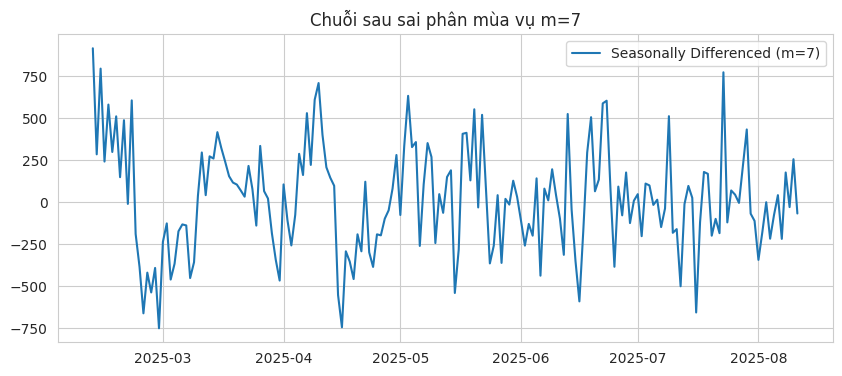

In [128]:
# Seasonal difference với chu kỳ 7
seasonal_diff = series.diff(7).dropna()

# ADF test lại
from statsmodels.tsa.stattools import adfuller

result_seasonal = adfuller(seasonal_diff)

print("\n=== ADF Test after Seasonal Differencing (m=7) ===")
print("ADF Statistic:", result_seasonal[0])
print("p-value:", result_seasonal[1])
print("Lags Used:", result_seasonal[2])
print("Observations:", result_seasonal[3])
print("Critical Values:", result_seasonal[4])

if result_seasonal[1] <= 0.05:
    print("Kết luận: Chuỗi dừng sau sai phân mùa vụ (m=7).")
else:
    print("Kết luận: Chuỗi vẫn không dừng sau sai phân mùa vụ.")

import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.plot(seasonal_diff, label="Seasonally Differenced (m=7)")
plt.title("Chuỗi sau sai phân mùa vụ m=7")
plt.legend()
plt.show()

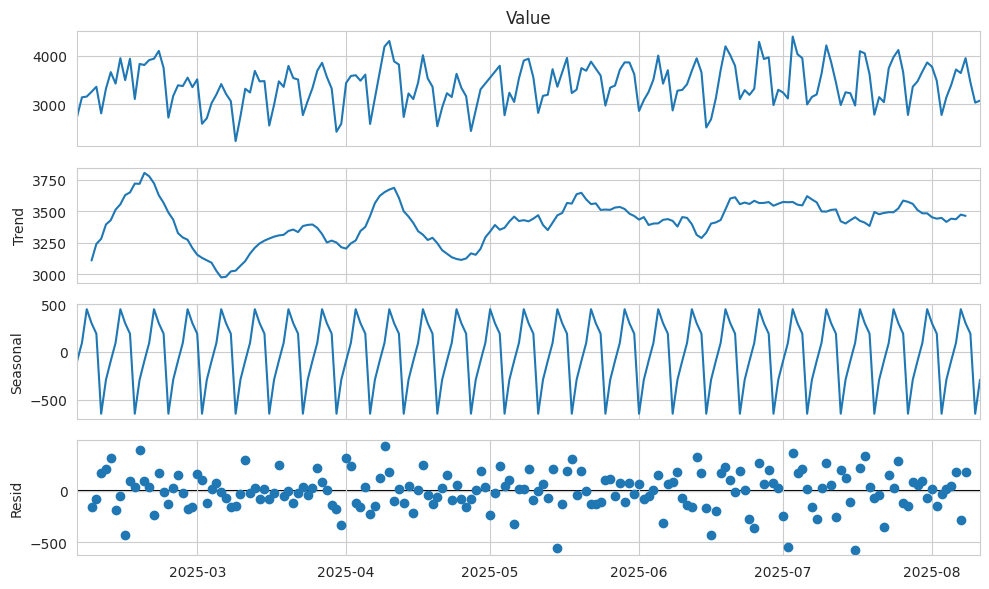

ADF Statistic: -3.339946
p-value: 0.013185
Critical Value (1%): -3.469
Critical Value (5%): -2.878
Critical Value (10%): -2.576


In [129]:
# Phân rã chuỗi (additive)
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df['Value'], model='additive', period=7)
fig = decomposition.plot()
fig.set_size_inches(10,6)
fig.tight_layout()
plt.show()

# Kiểm tra tính dừng bằng kiểm định Augmented Dickey-Fuller
result = adfuller(df['Value'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[4].items():
    print('Critical Value (%s): %.3f' % (key, value))

# Nếu p-value > 0.05 => không dừng, thử lấy sai phân bậc 1
if result[1] > 0.05:
    df['Value_diff'] = df['Value'].diff().dropna()
    adf_diff = adfuller(df['Value_diff'].dropna())
    print('Sau khi lấy sai phân bậc 1:')
    print('ADF Statistic: %f' % adf_diff[0])
    print('p-value: %f' % adf_diff[1])

   lag       acf  ci_lower  ci_upper
0    0  1.000000  1.000000  1.000000
1    1  0.423489  0.280922  0.566055
2    2  0.005165 -0.161014  0.171344
3    3 -0.380989 -0.547172 -0.214807
4    4 -0.371093 -0.554170 -0.188017
5    5 -0.041714 -0.239489  0.156062
6    6  0.308018  0.110064  0.505972
7    7  0.713258  0.505791  0.920725
8    8  0.299542  0.047108  0.551976
9    9 -0.107206 -0.366764  0.152352


<Figure size 800x400 with 0 Axes>

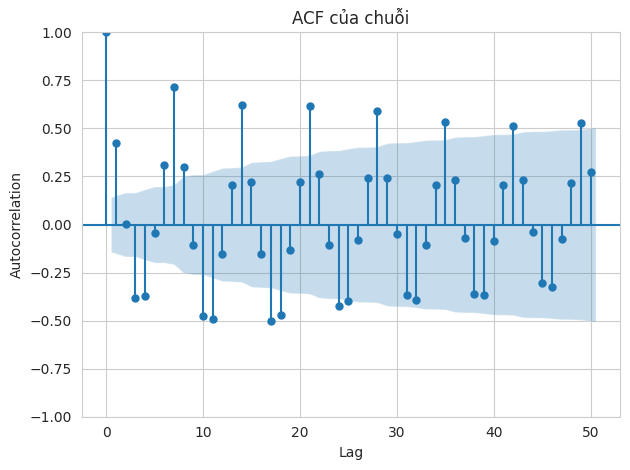

In [133]:
# ==== THIẾT LẬP ====
series = df['Value']                  # chuỗi cần phân tích
nlags  = 50                           # số lag muốn xem
alpha  = 0.05                         # mức ý nghĩa cho CI 95%

# ==== TÍNH ACF + KHOẢNG TIN CẬY ====
# acf(...) trả về mảng ACF; nếu alpha!=None sẽ trả thêm confint (lower, upper)
acf_vals, confint = acf(series, nlags=nlags, fft=True, alpha=alpha)

# Tạo bảng dữ liệu ACF
lags = np.arange(len(acf_vals))
acf_df = pd.DataFrame({
    'lag': lags,
    'acf': acf_vals,
    'ci_lower': confint[:, 0],
    'ci_upper': confint[:, 1],
})

# Hiển thị vài dòng đầu
print(acf_df.head(10))

# (Tuỳ chọn) Lưu bảng ra Excel/CSV để dùng trong báo cáo
# acf_df.to_excel('acf_values.xlsx', index=False)
# acf_df.to_csv('acf_values.csv', index=False)

# ==== VẼ ACF PLOT (kèm CI) ====
plt.figure(figsize=(8,4))
plot_acf(series, lags=nlags, alpha=alpha)
plt.title('ACF của chuỗi')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.tight_layout()
plt.show()

ADF Statistic: -3.339946
p-value: 0.013185
Critical Value (1%): -3.469
Critical Value (5%): -2.878
Critical Value (10%): -2.576


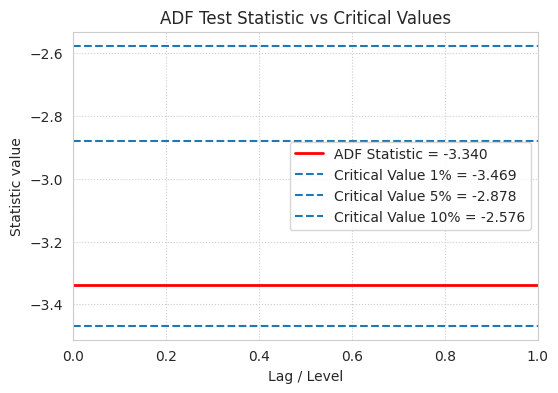

Kết luận: Chuỗi có thể được coi là stationary (p-value <= 0.05).


In [134]:
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# --- ADF Test ---
result = adfuller(df['Value'])
adf_stat = result[0]
p_value = result[1]
crit_values = result[4]

print('ADF Statistic: %f' % adf_stat)
print('p-value: %f' % p_value)
for key, value in crit_values.items():
    print('Critical Value (%s): %.3f' % (key, value))

# --- Plot ---
plt.figure(figsize=(6,4))
plt.axhline(y=adf_stat, color='red', linestyle='-', linewidth=2, label=f'ADF Statistic = {adf_stat:.3f}')
for key, value in crit_values.items():
    plt.axhline(y=value, linestyle='--', label=f'Critical Value {key} = {value:.3f}')

plt.title('ADF Test Statistic vs Critical Values')
plt.xlabel('Lag / Level')
plt.ylabel('Statistic value')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

# --- Ghi chú ---
if p_value <= 0.05:
    print("Kết luận: Chuỗi có thể được coi là stationary (p-value <= 0.05).")
else:
    print("Kết luận: Chuỗi KHÔNG stationary (p-value > 0.05).")

In [137]:
'''# ==== PACF ====
# pacf(...) trả về mảng PACF; nếu alpha!=None sẽ trả thêm confint (lower, upper)
pacf_vals, pacf_conf = pacf(series, nlags=nlags, method="ywmle", alpha=alpha)

# Tạo bảng dữ liệu PACF
lags_pacf = np.arange(len(pacf_vals))
pacf_df = pd.DataFrame({
    'lag': lags_pacf,
    'pacf': pacf_vals,
    'ci_lower': pacf_conf[:, 0],
    'ci_upper': pacf_conf[:, 1],
})
print("PACF (head):")
print(pacf_df.head(10))

# ==== VẼ PACF PLOT (kèm CI) ====
plt.figure(figsize=(8,4))
plot_pacf(series, lags=nlags, alpha=alpha, method="ywmle")
plt.title('PACF của chuỗi')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.tight_layout()
plt.show()

# =========================
# HÀM TRỢ GIÚP: XÁC ĐỊNH LAG CÓ Ý NGHĨA
# =========================
def significant_lags(vals, conf, ignore_zero=True, max_lag=None):
    """
    Trả về danh sách các lag mà hệ số vượt ra ngoài CI.
    - vals: ACF/PACF array
    - conf: CI array (shape [n, 2])
    """
    idxs = []
    start = 1 if ignore_zero else 0
    end = len(vals) if max_lag is None else min(len(vals), max_lag+1)
    for k in range(start, end):
        if vals[k] < conf[k,0] or vals[k] > conf[k,1]:
            idxs.append(k)
    return idxs

# Tìm lag có ý nghĩa
acf_sig = significant_lags(acf_vals, confint, ignore_zero=True, max_lag=nlags)
pacf_sig = significant_lags(pacf_vals, pacf_conf, ignore_zero=True, max_lag=nlags)

print(f"\nLags ACF có ý nghĩa (|ACF| vượt CI): {acf_sig}")
print(f"Lags PACF có ý nghĩa (|PACF| vượt CI): {pacf_sig}")

# =========================
# GỢI Ý p, q KHẢ THI (HEURISTICS CỔ ĐIỂN)
# =========================
# Quy tắc kinh điển:
# - AR(p): PACF cắt ngắn (chỉ vài lag đầu có ý nghĩa), ACF suy tàn từ từ -> chọn p theo PACF
# - MA(q): ACF cắt ngắn, PACF suy tàn -> chọn q theo ACF
# - ARMA(p,q): cả ACF & PACF suy tàn -> chọn p từ PACF sig, q từ ACF sig (giới hạn nhỏ)
#
# Ta sẽ lấy tối đa 3 bậc nhỏ nhất từ mỗi danh sách làm ứng viên.
def head_k(int_list, k=3):
    return sorted(int_list)[:k]

p_candidates = head_k(pacf_sig, k=3) if pacf_sig else [0,1]           # fallback nhẹ
q_candidates = head_k(acf_sig,  k=3) if acf_sig  else [0,1]

# Loại trùng và không hợp lý
p_candidates = [p for p in p_candidates if p >= 0]
q_candidates = [q for q in q_candidates if q >= 0]

# Nếu trống rỗng (hiếm), đặt fallback
if len(p_candidates) == 0: p_candidates = [0,1]
if len(q_candidates) == 0: q_candidates = [0,1]

print("\nỨng viên p (AR) từ PACF:", p_candidates)
print("Ứng viên q (MA) từ ACF:", q_candidates)

# Đề xuất mô hình:
# - AR(p): (p,0)
# - MA(q): (0,q)
# - ARMA(p,q): kết hợp p x q (loại trường hợp p=q=0)
arma_candidates = [(p,q) for p,q in product(p_candidates, q_candidates) if not (p==0 and q==0)]
ar_candidates   = [(p,0) for p in p_candidates if p>0]
ma_candidates   = [(0,q) for q in q_candidates if q>0]

print("\nGợi ý AR(p):", ar_candidates)
print("Gợi ý MA(q):", ma_candidates)
print("Gợi ý ARMA(p,q):", arma_candidates)

# =========================
# (TÙY CHỌN) THỬ NHANH & XẾP HẠNG THEO AIC
# =========================
def try_fit_rank(series, pq_list, d=0, top=10):
    out = []
    for (p,q) in pq_list:
        try:
            mod = ARIMA(series, order=(p,d,q))
            res = mod.fit(method_kwargs={'warn_convergence':False})
            out.append({
                'p': p, 'd': d, 'q': q,
                'aic': res.aic,
                'bic': res.bic,
                'params': res.params.shape[0]
            })
        except Exception as e:
            # bỏ qua mô hình không hội tụ/hỏng
            pass
    if not out:
        return pd.DataFrame(columns=['p','d','q','aic','bic','params'])
    df_rank = pd.DataFrame(out).sort_values('aic').reset_index(drop=True)
    return df_rank.head(top)

print("\n=== Xếp hạng nhanh (AIC) cho các mô hình gợi ý ===")
rank_ar   = try_fit_rank(series, ar_candidates, d=0)
rank_ma   = try_fit_rank(series, ma_candidates, d=0)
rank_arma = try_fit_rank(series, arma_candidates, d=0)

print("\nAR(p):")
print(rank_ar if not rank_ar.empty else "Không fit được mô hình AR nào.")
print("\nMA(q):")
print(rank_ma if not rank_ma.empty else "Không fit được mô hình MA nào.")
print("\nARMA(p,q) theo AIC:")
print(rank_arma if not rank_arma.empty else "Không fit được mô hình ARMA nào.")'''

'# ==== PACF ====\n# pacf(...) trả về mảng PACF; nếu alpha!=None sẽ trả thêm confint (lower, upper)\npacf_vals, pacf_conf = pacf(series, nlags=nlags, method="ywmle", alpha=alpha)\n\n# Tạo bảng dữ liệu PACF\nlags_pacf = np.arange(len(pacf_vals))\npacf_df = pd.DataFrame({\n    \'lag\': lags_pacf,\n    \'pacf\': pacf_vals,\n    \'ci_lower\': pacf_conf[:, 0],\n    \'ci_upper\': pacf_conf[:, 1],\n})\nprint("PACF (head):")\nprint(pacf_df.head(10))\n\n# ==== VẼ PACF PLOT (kèm CI) ====\nplt.figure(figsize=(8,4))\nplot_pacf(series, lags=nlags, alpha=alpha, method="ywmle")\nplt.title(\'PACF của chuỗi\')\nplt.xlabel(\'Lag\')\nplt.ylabel(\'Partial Autocorrelation\')\nplt.tight_layout()\nplt.show()\n\n# =========================\n# HÀM TRỢ GIÚP: XÁC ĐỊNH LAG CÓ Ý NGHĨA\n# =========================\ndef significant_lags(vals, conf, ignore_zero=True, max_lag=None):\n    """\n    Trả về danh sách các lag mà hệ số vượt ra ngoài CI.\n    - vals: ACF/PACF array\n    - conf: CI array (shape [n, 2])\n    "

ACF (head):
    lag       acf  ci_lower  ci_upper
0    0  1.000000  1.000000  1.000000
1    1  0.423489  0.280922  0.566055
2    2  0.005165 -0.161014  0.171344
3    3 -0.380989 -0.547172 -0.214807
4    4 -0.371093 -0.554170 -0.188017
5    5 -0.041714 -0.239489  0.156062
6    6  0.308018  0.110064  0.505972
7    7  0.713258  0.505791  0.920725
8    8  0.299542  0.047108  0.551976
9    9 -0.107206 -0.366764  0.152352 

PACF (head):
    lag      pacf  ci_lower  ci_upper
0    0  1.000000  1.000000  1.000000
1    1  0.423489  0.280922  0.566055
2    2 -0.212241 -0.354808 -0.069675
3    3 -0.374841 -0.517408 -0.232275
4    4 -0.069735 -0.212301  0.072832
5    5  0.198135  0.055569  0.340701
6    6  0.202266  0.059700  0.344833
7    7  0.568343  0.425776  0.710909
8    8 -0.283816 -0.426382 -0.141249
9    9 -0.190749 -0.333316 -0.048183 



<Figure size 800x400 with 0 Axes>

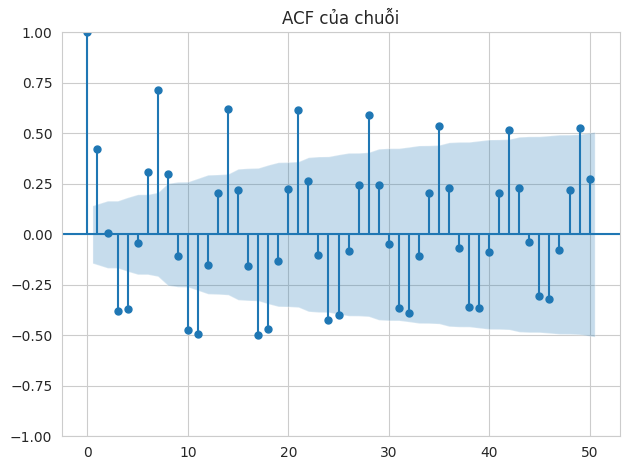

<Figure size 800x400 with 0 Axes>

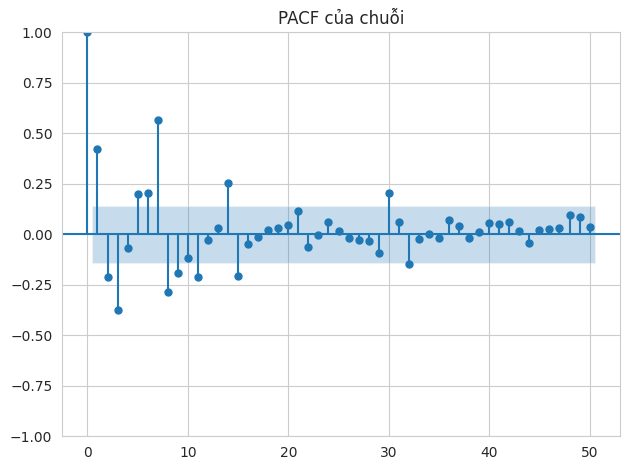

Lags ACF có ý nghĩa:  [1, 3, 4, 6, 7, 8, 10, 11, 14, 17, 18, 21, 24, 25, 28, 35, 42, 49]
Lags PACF có ý nghĩa: [1, 2, 3, 5, 6, 7, 8, 9, 11, 14, 15, 30, 32]

ACF phi-mùa vụ: [1, 3, 4, 6, 8, 10, 11, 17, 18, 24, 25]
ACF mùa vụ (bội số 7): [7, 14, 21, 28, 35, 42, 49]
PACF phi-mùa vụ: [1, 2, 3, 5, 6, 8, 9, 11, 15, 30, 32]
PACF mùa vụ (bội số 7): [7, 14]

Ứng viên p (AR) phi-mùa vụ: [1, 2, 3]
Ứng viên q (MA) phi-mùa vụ: [1, 3, 4]
Gợi ý AR(p): [(1, 0), (2, 0), (3, 0)]
Gợi ý MA(q): [(0, 1), (0, 3), (0, 4)]
Gợi ý ARMA(p,q): [(1, 1), (1, 3), (1, 4), (2, 1), (2, 3), (2, 4), (3, 1), (3, 3), (3, 4)]

Ứng viên P (mùa vụ): [0, 1, 2]
Ứng viên Q (mùa vụ): [0, 1, 2]

=== Xếp hạng AR/MA/ARMA (phi-mùa vụ) theo AIC ===

AR(p):
   p  d  q          AIC          BIC  k
0  3  0  0  2760.008933  2776.217668  5
1  2  0  0  2786.777946  2799.744934  4
2  1  0  0  2793.536658  2803.261899  3

MA(q):
   p  d  q          AIC          BIC  k
0  0  0  3  2768.042319  2784.251055  5
1  0  0  4  2769.133363  2788.583845

In [138]:
# INPUT & PARAMS
# ------------------
# Tự lấy cột dữ liệu
if 'qty' in df.columns:
    series = pd.to_numeric(df['qty'], errors='coerce').dropna()
elif 'Value' in df.columns:
    series = pd.to_numeric(df['Value'], errors='coerce').dropna()
else:
    raise ValueError("Không tìm thấy cột 'qty' hay 'Value' trong df.")

series = series.astype(float)
nlags  = 50
alpha  = 0.05

# Mùa vụ giả định (weekly). Đổi nếu cần.
m = 7

# -----------------------------
# 1) ACF/PACF + CI & Visualization
# -----------------------------
acf_vals, acf_ci   = acf(series, nlags=nlags, fft=True, alpha=alpha)
pacf_vals, pacf_ci = pacf(series, nlags=nlags, method="ywmle", alpha=alpha)

acf_df = pd.DataFrame({
    "lag": np.arange(len(acf_vals)),
    "acf": acf_vals,
    "ci_lower": acf_ci[:,0],
    "ci_upper": acf_ci[:,1],
})

pacf_df = pd.DataFrame({
    "lag": np.arange(len(pacf_vals)),
    "pacf": pacf_vals,
    "ci_lower": pacf_ci[:,0],
    "ci_upper": pacf_ci[:,1],
})

print("ACF (head):\n", acf_df.head(10), "\n")
print("PACF (head):\n", pacf_df.head(10), "\n")

plt.figure(figsize=(8,4))
plot_acf(series, lags=nlags, alpha=alpha)
plt.title("ACF của chuỗi")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8,4))
plot_pacf(series, lags=nlags, alpha=alpha, method="ywmle")
plt.title("PACF của chuỗi")
plt.tight_layout()
plt.show()

# -------------------------------------
# 2) HÀM CHỌN LAG CÓ Ý NGHĨA (đã SỬA)
#    Ý nghĩa khi CI KHÔNG chứa 0
# -------------------------------------
def significant_lags_from_ci(vals, ci, ignore_zero=True, max_lag=None):
    idxs = []
    start = 1 if ignore_zero else 0
    end = len(vals) if max_lag is None else min(len(vals), max_lag+1)
    for k in range(start, end):
        low, high = ci[k]
        # CI không chứa 0  -> ý nghĩa
        if (low > 0) or (high < 0):
            idxs.append(k)
    return idxs

acf_sig_all  = significant_lags_from_ci(acf_vals, acf_ci,  True, nlags)
pacf_sig_all = significant_lags_from_ci(pacf_vals, pacf_ci, True, nlags)

print(f"Lags ACF có ý nghĩa:  {acf_sig_all}")
print(f"Lags PACF có ý nghĩa: {pacf_sig_all}")

# -----------------------------------------------------
# 3) TÁCH LAG MÙA VỤ và PHI-MÙA VỤ để gợi ý đúng hơn
# -----------------------------------------------------
def split_seasonal(lags, m):
    seasonal = [k for k in lags if (k % m) == 0]
    non_seasonal = [k for k in lags if (k % m) != 0]
    return sorted(non_seasonal), sorted(seasonal)

acf_sig,  acf_sig_seasonal  = split_seasonal(acf_sig_all,  m)
pacf_sig, pacf_sig_seasonal = split_seasonal(pacf_sig_all, m)

print(f"\nACF phi-mùa vụ: {acf_sig}")
print(f"ACF mùa vụ (bội số {m}): {acf_sig_seasonal}")
print(f"PACF phi-mùa vụ: {pacf_sig}")
print(f"PACF mùa vụ (bội số {m}): {pacf_sig_seasonal}")

# -----------------------------------------
# 4) Ứng viên p, q (phi-mùa vụ) cho AR/MA/ARMA
# -----------------------------------------
def head_k(int_list, k=3):
    return sorted(set(int_list))[:k] if int_list else []

p_candidates = head_k(pacf_sig,  k=3) or [0,1]   # fallback
q_candidates = head_k(acf_sig,   k=3) or [0,1]

# Loại p=q=0 cho ARMA list
arma_candidates = [(p,q) for p,q in product(p_candidates, q_candidates) if not (p==0 and q==0)]
ar_candidates   = [(p,0) for p in p_candidates if p>0]
ma_candidates   = [(0,q) for q in q_candidates if q>0]

print("\nỨng viên p (AR) phi-mùa vụ:", p_candidates)
print("Ứng viên q (MA) phi-mùa vụ:", q_candidates)
print("Gợi ý AR(p):", ar_candidates)
print("Gợi ý MA(q):", ma_candidates)
print("Gợi ý ARMA(p,q):", arma_candidates)

# -----------------------------------------
# 5) Ứng viên P, Q (mùa vụ) cho SARIMA
#     Heuristics: nếu lag m có ý nghĩa -> P/Q chứa 1;
#                 nếu 2m có ý nghĩa -> cân nhắc 2
# -----------------------------------------
P_candidates = [0]
Q_candidates = [0]
if (m in pacf_sig_seasonal): P_candidates.append(1)
if (2*m in pacf_sig_seasonal): P_candidates.append(2)
if (m in acf_sig_seasonal):  Q_candidates.append(1)
if (2*m in acf_sig_seasonal): Q_candidates.append(2)

P_candidates = sorted(set(P_candidates))
Q_candidates = sorted(set(Q_candidates))

# Khởi đầu hợp lý
p_grid = [0,1,2] if p_candidates==[0,1] else head_k(p_candidates + [0,1,2], k=3)
q_grid = [0,1,2] if q_candidates==[0,1] else head_k(q_candidates + [0,1,2], k=3)

print("\nỨng viên P (mùa vụ):", P_candidates)
print("Ứng viên Q (mùa vụ):", Q_candidates)

# ---------------------------------------------------
# 6) FIT & RANK nhanh theo AIC/BIC cho AR/MA/ARMA
# ---------------------------------------------------
def try_fit_rank_arima(series, pq_list, d=0, top=10):
    out = []
    for (p,q) in pq_list:
        try:
            res = ARIMA(series, order=(p,d,q)).fit(method_kwargs={'warn_convergence': False})
            out.append({'p':p,'d':d,'q':q,'AIC':res.aic,'BIC':res.bic,'k':res.params.shape[0]})
        except Exception as e:
            # Bỏ mô hình không hội tụ
            pass
    df_rank = pd.DataFrame(out).sort_by("AIC") if out else pd.DataFrame()
    return df_rank.head(top) if not df_rank.empty else df_rank

# pandas phiên bản mới: dùng sort_values
def try_fit_rank_arima(series, pq_list, d=0, top=10):
    out = []
    for (p,q) in pq_list:
        try:
            res = ARIMA(series, order=(p,d,q)).fit(method_kwargs={'warn_convergence': False})
            out.append({'p':p,'d':d,'q':q,'AIC':res.aic,'BIC':res.bic,'k':res.params.shape[0]})
        except Exception:
            pass
    df_rank = pd.DataFrame(out)
    if df_rank.empty: return df_rank
    return df_rank.sort_values('AIC').reset_index(drop=True).head(top)

print("\n=== Xếp hạng AR/MA/ARMA (phi-mùa vụ) theo AIC ===")
rank_ar   = try_fit_rank_arima(series, ar_candidates,   d=0)
rank_ma   = try_fit_rank_arima(series, ma_candidates,   d=0)
rank_arma = try_fit_rank_arima(series, arma_candidates, d=0)

print("\nAR(p):")
print(rank_ar if not rank_ar.empty else "Không fit được AR nào.")
print("\nMA(q):")
print(rank_ma if not rank_ma.empty else "Không fit được MA nào.")
print("\nARMA(p,q):")
print(rank_arma if not rank_arma.empty else "Không fit được ARMA nào.")

# ---------------------------------------------------
# 7) FIT & RANK nhanh cho SARIMA với m = 7
#     D=1 nếu bạn muốn chắc chắn loại mùa vụ (theo ADF sau differencing)
# ---------------------------------------------------
def try_fit_rank_sarima(series, p_grid, q_grid, P_cands, Q_cands, D=1, m=7, d=0, top=15):
    rows = []
    for p,q,P,Q in product(p_grid, q_grid, P_cands, Q_cands):
        if (p,q,P,Q)==(0,0,0,0):  # bỏ mô hình tầm thường
            continue
        try:
            mod = SARIMAX(series,
                          order=(p,d,q),
                          seasonal_order=(P,D,Q,m),
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            res = mod.fit(disp=False)
            rows.append({'p':p,'d':d,'q':q,'P':P,'D':D,'Q':Q,'m':m,
                         'AIC':res.aic,'BIC':res.bic})
        except Exception:
            pass
    df_rank = pd.DataFrame(rows)
    if df_rank.empty: return df_rank
    return df_rank.sort_values('AIC').reset_index(drop=True).head(top)

print("\n=== Xếp hạng SARIMA (m=7) theo AIC ===")
rank_sarima = try_fit_rank_sarima(series,
                                  p_grid=p_grid, q_grid=q_grid,
                                  P_cands=P_candidates, Q_cands=Q_candidates,
                                  D=1, m=m, d=0, top=15)
print(rank_sarima if not rank_sarima.empty else "Không fit được SARIMA nào.")

In [142]:
def diagnostic_tests(model_res, lags=20):
    resid = model_res.resid

    # Ljung–Box test cho autocorrelation
    lb = acorr_ljungbox(resid, lags=[lags], return_df=True)

    # Jarque–Bera test cho normality
    jb_stat, jb_p, skew, kurt = jarque_bera(resid)

    # Shapiro–Wilk test cho normality (optional, với chuỗi nhỏ)
    sw_stat, sw_p = stats.shapiro(resid) if len(resid) <= 5000 else (np.nan, np.nan)

    return {
        "LjungBox_stat": float(lb['lb_stat'].iloc[0]),
        "LjungBox_p": float(lb['lb_pvalue'].iloc[0]),
        "JarqueBera_stat": jb_stat,
        "JarqueBera_p": jb_p,
        "Skew": skew,
        "Kurtosis": kurt,
        "ShapiroW_stat": sw_stat,
        "ShapiroW_p": sw_p
    }

# === 1) Lấy top 3 AR/MA/ARMA theo AIC ===
top_ar    = rank_ar.head(3).to_dict('records')
top_ma    = rank_ma.head(3).to_dict('records')
top_arma  = rank_arma.head(3).to_dict('records')
top_sarima = rank_sarima.head(3).to_dict('records')

print("\nTop 3 AR:", top_ar)
print("\nTop 3 MA:", top_ma)
print("\nTop 3 ARMA:", top_arma)
print("\nTop 3 SARIMA:", top_sarima)

# === 2) Fit lại và kiểm định ===
results_summary = []

def fit_and_test_arima(p,d,q, label):
    try:
        mod = ARIMA(series, order=(p,d,q))
        res = mod.fit()
        diag = diagnostic_tests(res, lags=20)
        results_summary.append({
            "Model": label,
            "Order": (p,d,q),
            "AIC": res.aic,
            "BIC": res.bic,
            **diag
        })
    except Exception as e:
        print(f"Lỗi khi fit {label}: {e}")

def fit_and_test_sarima(p,d,q,P,D,Q,m, label):
    try:
        mod = SARIMAX(series,
                      order=(p,d,q),
                      seasonal_order=(P,D,Q,m),
                      enforce_stationarity=False,
                      enforce_invertibility=False)
        res = mod.fit(disp=False)
        diag = diagnostic_tests(res, lags=20)
        results_summary.append({
            "Model": label,
            "Order": (p,d,q),
            "Seasonal": (P,D,Q,m),
            "AIC": res.aic,
            "BIC": res.bic,
            **diag
        })
    except Exception as e:
        print(f"Lỗi khi fit {label}: {e}")

# Fit AR
for i, row in enumerate(top_ar):
    fit_and_test_arima(row['p'], row['d'], row['q'], f"AR{i+1}")

# Fit MA
for i, row in enumerate(top_ma):
    fit_and_test_arima(row['p'], row['d'], row['q'], f"MA{i+1}")

# Fit ARMA
for i, row in enumerate(top_arma):
    fit_and_test_arima(row['p'], row['d'], row['q'], f"ARMA{i+1}")

# Fit SARIMA
for i, row in enumerate(top_sarima):
    fit_and_test_sarima(row['p'], row['d'], row['q'],
                        row['P'], row['D'], row['Q'], row['m'],
                        f"SARIMA{i+1}")

# === 3) Tổng hợp kết quả ===
df_results = pd.DataFrame(results_summary)
pd.set_option("display.max_columns", None)
print("\n=== Diagnostics cho Top 3 mỗi loại ===")
print(df_results)


Top 3 AR: [{'p': 3, 'd': 0, 'q': 0, 'AIC': 2760.0089330036612, 'BIC': 2776.2176680789594, 'k': 5}, {'p': 2, 'd': 0, 'q': 0, 'AIC': 2786.77794623763, 'BIC': 2799.744934297869, 'k': 4}, {'p': 1, 'd': 0, 'q': 0, 'AIC': 2793.5366578532003, 'BIC': 2803.261898898379, 'k': 3}]

Top 3 MA: [{'p': 0, 'd': 0, 'q': 3, 'AIC': 2768.0423194799782, 'BIC': 2784.2510545552764, 'k': 5}, {'p': 0, 'd': 0, 'q': 4, 'AIC': 2769.1333629008723, 'BIC': 2788.5838449912303, 'k': 6}, {'p': 0, 'd': 0, 'q': 1, 'AIC': 2794.9726574184306, 'BIC': 2804.6978984636094, 'k': 3}]

Top 3 ARMA: [{'p': 2, 'd': 0, 'q': 4, 'AIC': 2694.271760544666, 'BIC': 2720.205736665143, 'k': 8}, {'p': 2, 'd': 0, 'q': 3, 'AIC': 2696.1000126522304, 'BIC': 2718.792241757648, 'k': 7}, {'p': 3, 'd': 0, 'q': 4, 'AIC': 2700.6794962660597, 'BIC': 2729.8552194015965, 'k': 9}]

Top 3 SARIMA: [{'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 2, 'm': 7, 'AIC': 2254.9386912915415, 'BIC': 2273.574364134945}, {'p': 1, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 2, '

=== Best per Family (theo Score = AIC_rank + Penalty) ===
   Family    Model      Order      Seasonal          AIC          BIC  \
0      AR      AR1  (3, 0, 0)          None  2760.008933  2776.217668   
1    ARMA    ARMA1  (2, 0, 4)          None  2694.271761  2720.205737   
2      MA      MA1  (0, 0, 3)          None  2768.042319  2784.251055   
3  SARIMA  SARIMA1  (1, 0, 2)  (0, 1, 2, 7)  2254.938691  2273.574364   

     LjungBox_p  JarqueBera_p    ShapiroW_p  Score  
0  8.979730e-22      0.138082  3.523975e-02   14.0  
1  1.309580e-13      0.131905  7.622925e-02    9.0  
2  2.343624e-28      0.448735  5.518353e-01   13.0  
3  2.713792e-05      0.000000  2.641188e-15   11.0  

=== Best Overall ===
  Family  Model      Order Seasonal          AIC          BIC    LjungBox_p  \
6   ARMA  ARMA1  (2, 0, 4)      NaN  2694.271761  2720.205737  1.309580e-13   

   JarqueBera_p  ShapiroW_p  Score  
6      0.131905    0.076229    9.0  

=== Summary of Best Model: ARIMA(2, 0, 4) ===
         

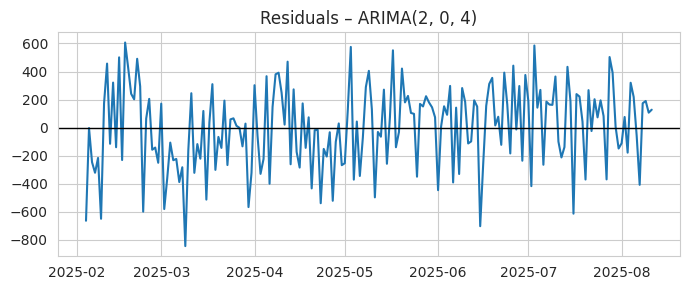

<Figure size 700x300 with 0 Axes>

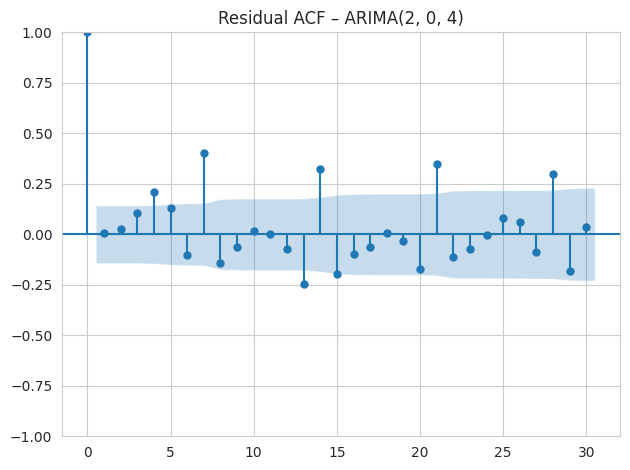

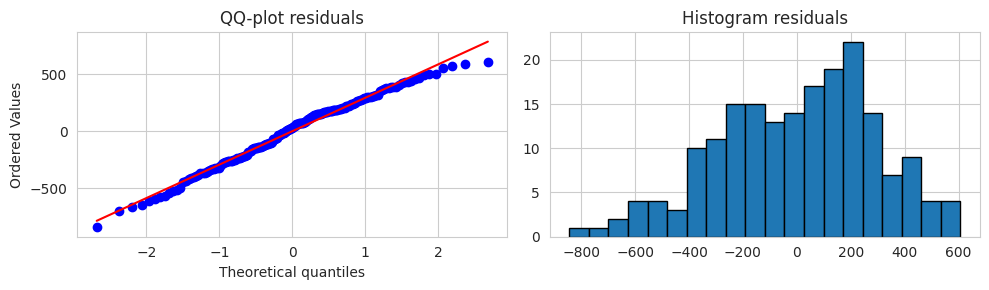

In [144]:
# AUTO SELECT BEST MODEL (score by AIC + diagnostics)

assert 'df_results' in globals(), "Chưa có df_results. Hãy chạy cell fit & diagnostics trước."

df_sel = df_results.copy()

# ---- 1) Thêm cột loại mô hình
def infer_family(name: str) -> str:
    name = str(name).upper()
    if name.startswith("SARIMA"): return "SARIMA"
    if name.startswith("ARMA"):   return "ARMA"
    if name.startswith("AR(") or name.startswith("AR "): return "AR"
    if name.startswith("MA(") or name.startswith("MA "): return "MA"
    if name.startswith("AR"):     # AR1, AR2...
        return "AR"
    if name.startswith("MA"):     # MA1, MA2...
        return "MA"
    # fallback by presence of Seasonal
    return "SARIMA" if "Seasonal" in df_sel.columns and not df_sel['Seasonal'].isna().all() else "ARMA"

df_sel['Family'] = df_sel['Model'].apply(infer_family)

# ---- 2) Chuẩn hóa & tính điểm
# Rank AIC (thấp là tốt)
df_sel['AIC_rank'] = df_sel['AIC'].rank(method='dense', ascending=True)

# Penalty cho phần dư không trắng / không chuẩn
# - Ljung-Box p < 0.05: +5 điểm (nặng)
# - Jarque-Bera p < 0.05: +3 điểm
# - Shapiro p < 0.05 (nếu có): +2 điểm
def penalty(row):
    pen = 0
    if pd.notna(row.get('LjungBox_p', np.nan)) and row['LjungBox_p'] < 0.05: pen += 5
    if pd.notna(row.get('JarqueBera_p', np.nan)) and row['JarqueBera_p'] < 0.05: pen += 3
    if pd.notna(row.get('ShapiroW_p', np.nan)) and row['ShapiroW_p'] < 0.05: pen += 2
    return pen

df_sel['Penalty'] = df_sel.apply(penalty, axis=1)

# Điểm tổng hợp: càng THẤP càng tốt
df_sel['Score'] = df_sel['AIC_rank'] + df_sel['Penalty']

# ---- 3) Chọn Best per Family & Best overall
best_per_family = (df_sel.sort_values(['Family','Score','AIC'])
                         .groupby('Family', as_index=False)
                         .first())

best_overall = df_sel.sort_values(['Score','AIC']).head(1)

print("=== Best per Family (theo Score = AIC_rank + Penalty) ===")
print(best_per_family[['Family','Model','Order','Seasonal','AIC','BIC','LjungBox_p','JarqueBera_p','ShapiroW_p','Score']])

print("\n=== Best Overall ===")
print(best_overall[['Family','Model','Order','Seasonal','AIC','BIC','LjungBox_p','JarqueBera_p','ShapiroW_p','Score']])

# ---- 4) Refit mô hình tốt nhất & VẼ chẩn đoán phần dư
row = best_overall.iloc[0]

def refit_from_row(row):
    order = tuple(row['Order'])
    if 'Seasonal' in row and isinstance(row['Seasonal'], (tuple, list)):
        P,D,Q,m = tuple(row['Seasonal'])
        mod = SARIMAX(series, order=order, seasonal_order=(P,D,Q,m),
                      enforce_stationarity=False, enforce_invertibility=False)
        res = mod.fit(disp=False)
        label = f"SARIMA{order}x{(P,D,Q,m)}"
    else:
        mod = ARIMA(series, order=order)
        res = mod.fit()
        label = f"ARIMA{order}"
    return res, label

res_best, label_best = refit_from_row(row)

print(f"\n=== Summary of Best Model: {label_best} ===")
print(res_best.summary())

# ---- 5) Residual diagnostics plots
resid = res_best.resid

fig, ax = plt.subplots(1, 1, figsize=(7,3))
ax.plot(resid)
ax.set_title(f"Residuals – {label_best}")
ax.axhline(0, color='black', lw=1)
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,3))
plot_acf(resid, lags=30)
plt.title(f"Residual ACF – {label_best}")
plt.tight_layout()
plt.show()

# QQ-plot & Histogram
fig, ax = plt.subplots(1,2, figsize=(10,3))
# QQ
stats.probplot(resid, dist="norm", plot=ax[0])
ax[0].set_title("QQ-plot residuals")
# Histogram
ax[1].hist(resid, bins=20, edgecolor='k')
ax[1].set_title("Histogram residuals")
plt.tight_layout()
plt.show()

                                     SARIMAX Results                                     
Dep. Variable:                             Value   No. Observations:                  189
Model:             SARIMAX(1, 0, 2)x(0, 1, 2, 7)   Log Likelihood               -1121.469
Date:                           Fri, 05 Sep 2025   AIC                           2254.939
Time:                                   14:22:40   BIC                           2273.574
Sample:                               02-04-2025   HQIC                          2262.504
                                    - 08-11-2025                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8436      0.085      9.973      0.000       0.678       1.009
ma.L1         -0.4780      0.113     -4.231

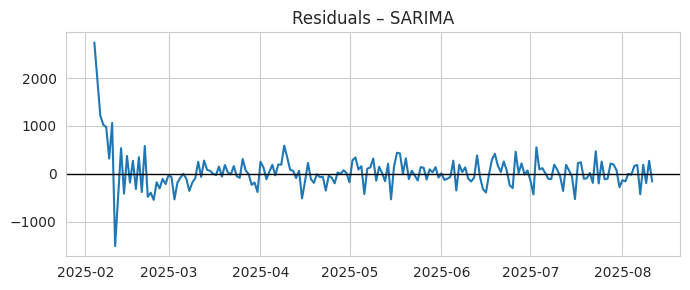

<Figure size 700x300 with 0 Axes>

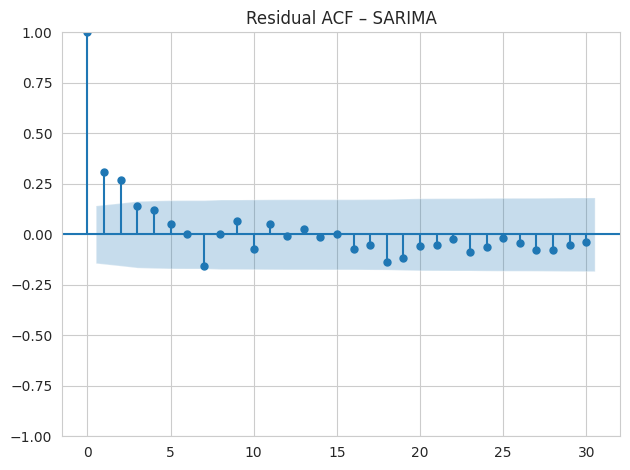

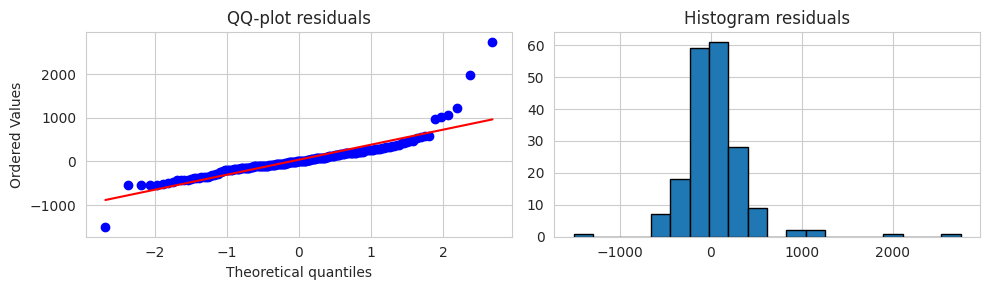

In [146]:
# Lấy mô hình SARIMA tốt nhất từ rank_sarima (đã có ở cell trước)
best_sar = rank_sarima.iloc[0]  # hàng AIC thấp nhất
p,d,q = int(best_sar.p), int(best_sar.d), int(best_sar.q)
P,D,Q,m = int(best_sar.P), int(best_sar.D), int(best_sar.Q), int(best_sar.m)

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch, acorr_lm
from statsmodels.stats.stattools import jarque_bera
import matplotlib.pyplot as plt
import numpy as np

mod = SARIMAX(series, order=(p,d,q), seasonal_order=(P,D,Q,m),
              enforce_stationarity=False, enforce_invertibility=False)
res = mod.fit(disp=False)
print(res.summary())

# Diagnostics
resid = res.resid
lb = acorr_ljungbox(resid, lags=[20], return_df=True)
jb_stat, jb_p, skew, kurt = jarque_bera(resid)
arch_stat = het_arch(resid, nlags=10)  # Engle ARCH LM

print("\nLjung–Box(20): stat=%.3f  p=%.4f" % (lb['lb_stat'].iloc[0], lb['lb_pvalue'].iloc[0]))
print("Jarque–Bera:   stat=%.3f  p=%.4f  skew=%.3f  kurt=%.3f" % (jb_stat, jb_p, skew, kurt))
print("ARCH LM(10):   stat=%.3f  p=%.4f" % (arch_stat[0], arch_stat[1]))

# Plots
fig, ax = plt.subplots(1,1, figsize=(7,3))
ax.plot(resid); ax.axhline(0,color='k',lw=1); ax.set_title("Residuals – SARIMA")
plt.tight_layout(); plt.show()

plt.figure(figsize=(7,3)); plot_acf(resid, lags=30); plt.title("Residual ACF – SARIMA"); plt.tight_layout(); plt.show()

fig, ax = plt.subplots(1,2, figsize=(10,3))
import scipy.stats as stats
stats.probplot(resid, dist="norm", plot=ax[0]); ax[0].set_title("QQ-plot residuals")
ax[1].hist(resid, bins=20, edgecolor='k'); ax[1].set_title("Histogram residuals")
plt.tight_layout(); plt.show()

In [147]:
# ================================
# THỬ SARIMA(1,0,1)(0,1,1)[7]
# ================================
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
from statsmodels.stats.stattools import jarque_bera

# Fit mô hình
mod_alt = SARIMAX(series, order=(1,0,1), seasonal_order=(0,1,1,7),
                  enforce_stationarity=False, enforce_invertibility=False)
res_alt = mod_alt.fit(disp=False)

print(res_alt.summary())

# Lấy residuals
resid_alt = res_alt.resid

# Diagnostics
lb_alt = acorr_ljungbox(resid_alt, lags=[20], return_df=True)
jb_stat, jb_p, skew, kurt = jarque_bera(resid_alt)
arch_stat = het_arch(resid_alt, nlags=10)

print("=== SARIMA(1,0,1)(0,1,1)[7] ===")
print("AIC: %.3f  BIC: %.3f" % (res_alt.aic, res_alt.bic))
print("Ljung–Box(20): stat=%.3f  p=%.4f" % (lb_alt['lb_stat'].iloc[0], lb_alt['lb_pvalue'].iloc[0]))
print("Jarque–Bera:   stat=%.3f  p=%.4f  skew=%.3f  kurt=%.3f" % (jb_stat, jb_p, skew, kurt))
print("ARCH LM(10):   stat=%.3f  p=%.4f" % (arch_stat[0], arch_stat[1]))

                                     SARIMAX Results                                     
Dep. Variable:                             Value   No. Observations:                  189
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 7)   Log Likelihood               -1179.251
Date:                           Fri, 05 Sep 2025   AIC                           2366.502
Time:                                   14:22:47   BIC                           2379.116
Sample:                               02-04-2025   HQIC                          2371.619
                                    - 08-11-2025                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6438      0.115      5.620      0.000       0.419       0.868
ma.L1         -0.2183      0.140     -1.565

In [148]:
# ====================================
# SO SÁNH HAI MÔ HÌNH SARIMA
# ====================================
def diagnostics_table(label, res, resid):
    from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
    from statsmodels.stats.stattools import jarque_bera
    lb = acorr_ljungbox(resid, lags=[20], return_df=True)
    jb_stat, jb_p, skew, kurt = jarque_bera(resid)
    arch_stat = het_arch(resid, nlags=10)
    return {
        "Model": label,
        "AIC": res.aic,
        "BIC": res.bic,
        "LjungBox_p": lb['lb_pvalue'].iloc[0],
        "JB_p": jb_p,
        "ARCH_p": arch_stat[1]
    }

# Gom 2 mô hình vào DataFrame so sánh
compare_df = pd.DataFrame([
    diagnostics_table("Best SARIMA", res, res.resid),
    diagnostics_table("SARIMA(1,0,1)(0,1,1)[7]", res_alt, res_alt.resid)
])

print(compare_df.round(4))

                     Model        AIC        BIC  LjungBox_p  JB_p  ARCH_p
0              Best SARIMA  2254.9387  2273.5744         0.0   0.0  0.0414
1  SARIMA(1,0,1)(0,1,1)[7]  2366.5023  2379.1155         0.0   0.0  0.7322


=== SARIMA summary ===
                                     SARIMAX Results                                     
Dep. Variable:                             Value   No. Observations:                  189
Model:             SARIMAX(1, 0, 2)x(0, 1, 2, 7)   Log Likelihood               -1121.469
Date:                           Fri, 05 Sep 2025   AIC                           2254.939
Time:                                   14:23:08   BIC                           2273.574
Sample:                               02-04-2025   HQIC                          2262.504
                                    - 08-11-2025                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8436      0.085      9.973      0.000       0.678       1.009
ma.L1         -0.478

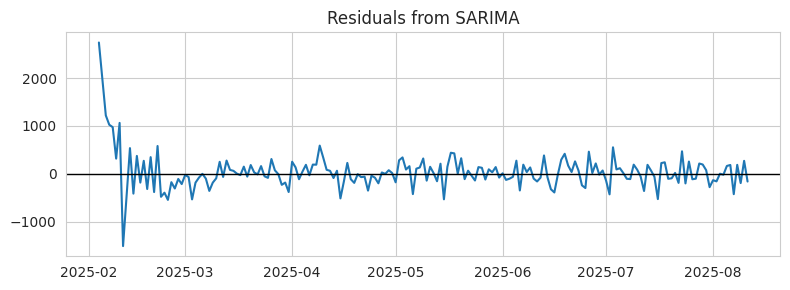

/usr/local/lib/python3.12/dist-packages/arch/univariate/base.py:309: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.498e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.





=== GARCH summary ===
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   None   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -1313.59
Distribution:                  Normal   AIC:                           2635.17
Method:            Maximum Likelihood   BIC:                           2648.14
                                        No. Observations:                  189
Date:                Fri, Sep 05 2025   Df Residuals:                      188
Time:                        14:23:11   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu             7.5208     17.518      0.429    

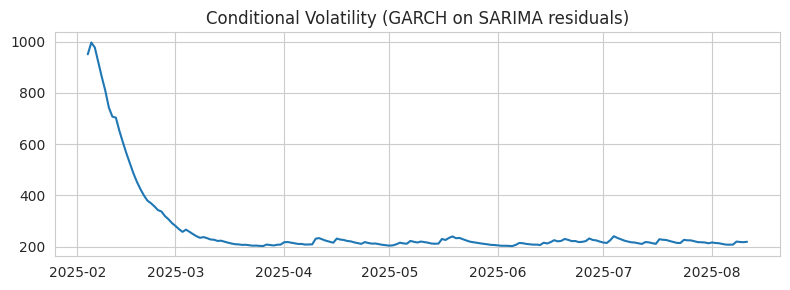

In [150]:
# ============================
# 1. Fit SARIMA cho mean
# ============================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Giả sử series đã có (pd.Series với index datetime)
# Ví dụ: series = df['Value']

# SARIMA tốt nhất từ trước: (1,0,2)(0,1,2,7)
sarima_mod = SARIMAX(series, order=(1,0,2), seasonal_order=(0,1,2,7),
                     enforce_stationarity=False, enforce_invertibility=False)
sarima_res = sarima_mod.fit(disp=False)

print("=== SARIMA summary ===")
print(sarima_res.summary())

# Lấy residuals
resid = sarima_res.resid

plt.figure(figsize=(8,3))
plt.plot(resid)
plt.axhline(0, color='k', lw=1)
plt.title("Residuals from SARIMA")
plt.tight_layout()
plt.show()

# ============================
# 2. Fit GARCH cho variance
# ============================
from arch import arch_model

# Dùng GARCH(1,1) phổ biến
garch_mod = arch_model(resid, vol='Garch', p=1, q=1, dist='normal')
garch_res = garch_mod.fit(disp="off")

print("\n=== GARCH summary ===")
print(garch_res.summary())

# Vẽ volatility (conditional variance)
plt.figure(figsize=(8,3))
plt.plot(garch_res.conditional_volatility)
plt.title("Conditional Volatility (GARCH on SARIMA residuals)")
plt.tight_layout()
plt.show()

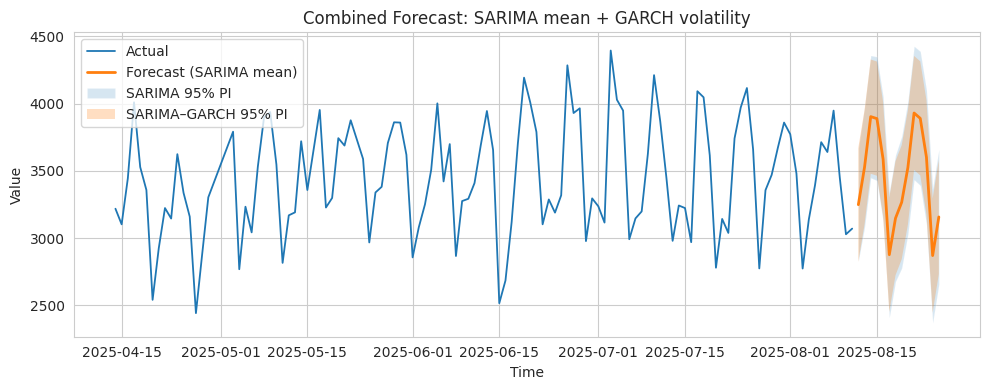

            Forecast  SARIMA_L  SARIMA_U  GARCH_L  GARCH_U
2025-08-12   3248.15   2828.86   3667.43  2822.84  3673.45
2025-08-13   3526.92   3080.49   3973.34  3101.80  3952.03
2025-08-14   3903.18   3448.29   4358.07  3478.23  4328.14
2025-08-15   3888.37   3427.55   4349.18  3463.56  4313.18
2025-08-16   3585.84   3120.85   4050.83  3161.15  4010.53
2025-08-17   2876.03   2408.09   3343.96  2451.44  3300.61
2025-08-18   3147.29   2677.27   3617.31  2722.79  3571.78
2025-08-19   3266.08   2775.98   3756.18  2841.66  3690.49
2025-08-20   3523.79   3028.91   4018.67  3099.44  3948.14
2025-08-21   3930.21   3433.03   4427.38  3505.92  4354.49
2025-08-22   3890.32   3391.53   4389.12  3466.09  4314.56
2025-08-23   3600.97   3101.02   4100.92  3176.77  4025.16
2025-08-24   2869.47   2368.70   3370.24  2445.31  3293.63
2025-08-25   3156.92   2655.57   3658.27  2732.80  3581.05


In [153]:
# ============================================
# 3) DỰ BÁO KẾT HỢP: SARIMA (mean) + GARCH (volatility)
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------ cấu hình số bước dự báo ------
H = 14  # số bước forecast

# ------ 3.1 SARIMA: mean forecast + PI mặc định ------
sar_fc = sarima_res.get_forecast(steps=H)
mean_fc = sar_fc.predicted_mean
pi_sar = sar_fc.conf_int(alpha=0.05)  # 95% PI mặc định từ SARIMA
pi_sar.columns = ['SARIMA_L', 'SARIMA_U']

# ------ 3.2 GARCH: forecast volatility cho residuals ------
# Lấy dự báo phương sai có điều kiện trong tương lai (horizon=H)
garch_fv = garch_res.forecast(horizon=H).variance.iloc[-1]
# chuyển sang độ lệch chuẩn
garch_std = np.sqrt(garch_fv.values)

# Nếu index thời gian chưa khớp, tạo index tương lai dựa trên tần suất quan sát
freq = pd.infer_freq(series.index) or pd.infer_freq(series.index[:5]) or 'D'
future_index = pd.date_range(start=series.index[-1] + pd.tseries.frequencies.to_offset(freq),
                             periods=H, freq=freq)

# ------ 3.3 Tạo interval kết hợp từ volatility GARCH ------
z = 1.96  # ~ N(0,1) 95%
pi_garch_L = mean_fc.values - z * garch_std
pi_garch_U = mean_fc.values + z * garch_std
pi_garch = pd.DataFrame({'GARCH_L': pi_garch_L, 'GARCH_U': pi_garch_U}, index=future_index)

# ------ 3.4 Gom kết quả & vẽ so sánh ------
df_plot = pd.concat([
    series.tail(120),                             # dữ liệu gần nhất để nhìn ngữ cảnh
    pd.Series(mean_fc.values, index=future_index, name='Forecast')
], axis=1)

plt.figure(figsize=(10,4))
plt.plot(df_plot.index, df_plot.iloc[:,0], label='Actual', lw=1.3)
plt.plot(future_index, mean_fc.values, label='Forecast (SARIMA mean)', lw=2)

# PI mặc định của SARIMA
plt.fill_between(future_index, pi_sar['SARIMA_L'].values, pi_sar['SARIMA_U'].values,
                 alpha=0.18, label='SARIMA 95% PI')

# PI động theo GARCH volatility
plt.fill_between(future_index, pi_garch['GARCH_L'].values, pi_garch['GARCH_U'].values,
                 alpha=0.25, edgecolor='none', label='SARIMA–GARCH 95% PI')

plt.title('Combined Forecast: SARIMA mean + GARCH volatility')
plt.xlabel('Time'); plt.ylabel('Value')
plt.legend(loc='best'); plt.tight_layout()
plt.show()

# ------ 3.5 Bảng tóm tắt các mốc forecast ------
summary_tbl = pd.concat([
    mean_fc.rename('Forecast'),
    pi_sar.rename(columns={'SARIMA_L':'SARIMA_L','SARIMA_U':'SARIMA_U'}),
    pi_garch
], axis=1)
print(summary_tbl.round(2).head(H))

In [156]:
# ============================================
# 4) KẾT LUẬN TỰ ĐỘNG: SARIMA vs SARIMA–GARCH
# ============================================
import numpy as np
import pandas as pd
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
from statsmodels.stats.stattools import jarque_bera

def safe_p(v):
    try:
        return float(v)
    except Exception:
        return np.nan

# --- 4.1 Chẩn đoán lại SARIMA residuals ---
resid = sarima_res.resid
lb_p  = acorr_ljungbox(resid, lags=[20], return_df=True)['lb_pvalue'].iloc[0]
jb_stat, jb_p, skew, kurt = jarque_bera(resid)
arch_stat, arch_p, *_ = het_arch(resid, nlags=10)

# --- 4.2 Trích thông số GARCH ---
garch_params = getattr(garch_res, 'params', pd.Series(dtype=float))
alpha = float(garch_params.filter(like='alpha').iloc[0]) if 'alpha[1]' in garch_params.index or any('alpha' in i for i in garch_params.index) else np.nan
beta  = float(garch_params.filter(like='beta').iloc[0])  if 'beta[1]'  in garch_params.index or any('beta'  in i for i in garch_params.index)  else np.nan
pvals = getattr(garch_res, 'pvalues', pd.Series(dtype=float))
alpha_p = safe_p(pvals.get('alpha[1]', np.nan))
beta_p  = safe_p(pvals.get('beta[1]',  np.nan))
alpha_beta = alpha + beta if np.isfinite(alpha) and np.isfinite(beta) else np.nan

# --- 4.3 So sánh độ rộng PI (95%) ---
def avg_width(df, lcol, ucol):
    return float(np.nanmean(df[ucol].values - df[lcol].values))

w_sar   = avg_width(pi_sar,   'SARIMA_L', 'SARIMA_U')
w_garch = avg_width(pi_garch, 'GARCH_L',  'GARCH_U')
rel_w   = (w_garch / w_sar) if (w_sar and np.isfinite(w_sar) and w_sar!=0) else np.nan

# --- 4.4 Luật quyết định (heuristics thực dụng) ---
reasons = []
prefer = "SARIMA"

# (A) Nếu phát hiện heteroskedasticity hoặc volatility persistence cao -> ưu tiên SARIMA–GARCH
hetero_flag = (arch_p < 0.05) or (np.isfinite(alpha_beta) and alpha_beta >= 0.85 and (alpha_p < 0.10 or beta_p < 0.10))
if hetero_flag:
    prefer = "SARIMA–GARCH"
    reasons.append(f"Phát hiện heteroskedasticity / volatility persistence (ARCH p={arch_p:.4f}, α+β≈{alpha_beta:.2f}).")

# (B) Nếu phần dư lệch chuẩn mạnh -> PI của SARIMA có thể kém tin cậy
if jb_p < 0.05 or abs(kurt) > 10 or abs(skew) > 1:
    prefer = "SARIMA–GARCH"
    reasons.append(f"Residuals không chuẩn (JB p={jb_p:.4f}, skew={skew:.2f}, kurt={kurt:.2f}).")

# (C) Nếu GARCH tạo PI hẹp hơn nhiều mà vẫn có hetero_flag -> lợi thế thực dụng
if hetero_flag and np.isfinite(rel_w) and rel_w < 0.9:
    reasons.append(f"PI của SARIMA–GARCH hẹp hơn ~{(1-rel_w)*100:.1f}% so với SARIMA.")

# (D) Nếu không có heteroskedasticity, Ljung–Box OK và JB OK -> SARIMA đủ dùng
if (arch_p >= 0.05) and (lb_p >= 0.05) and (jb_p >= 0.05):
    prefer = "SARIMA"
    reasons = [f"Residuals gần white noise (LB p={lb_p:.4f}), không heteroskedasticity (ARCH p={arch_p:.4f}), xấp xỉ chuẩn (JB p={jb_p:.4f})."]

# --- 4.5 In bảng tóm tắt + kết luận ---
summary = pd.DataFrame({
    "Metric": [
        "SARIMA AIC", "SARIMA BIC",
        "Ljung–Box(20) p", "Jarque–Bera p", "Skew", "Kurtosis",
        "ARCH LM(10) p",
        "GARCH alpha", "GARCH beta", "alpha+beta",
        "Avg PI width – SARIMA", "Avg PI width – SARIMA–GARCH", "Width Ratio (GARCH/SARIMA)"
    ],
    "Value": [
        f"{sarima_res.aic:.3f}", f"{sarima_res.bic:.3f}",
        f"{lb_p:.4f}", f"{jb_p:.4f}", f"{skew:.2f}", f"{kurt:.2f}",
        f"{arch_p:.4f}",
        f"{alpha:.4f}", f"{beta:.4f}", f"{alpha_beta:.4f}",
        f"{w_sar:.2f}", f"{w_garch:.2f}", f"{rel_w:.3f}"
    ]
})

print("\n=== Summary diagnostics & interval widths ===")
print(summary.to_string(index=False))

print("\n=== KẾT LUẬN ===")
print(f"Khuyến nghị: **{prefer}**")
for i, r in enumerate(reasons, 1):
    print(f"{i}. {r}")

# Gợi ý bước tiếp theo theo quyết định
if prefer == "SARIMA–GARCH":
    print("- Dùng mean forecast từ SARIMA + volatility forecast từ GARCH để tạo PI động.")
    print("- Có thể thử GARCH với phân phối Student-t: dist='t' để xử lý heavy tails.")
else:
    print("- SARIMA đủ dùng cho mean và interval; có thể tinh giản bậc không ý nghĩa để ổn định hơn.")


=== Summary diagnostics & interval widths ===
                     Metric    Value
                 SARIMA AIC 2254.939
                 SARIMA BIC 2273.574
            Ljung–Box(20) p   0.0000
              Jarque–Bera p   0.0000
                       Skew     2.41
                   Kurtosis    18.82
              ARCH LM(10) p   0.0414
                GARCH alpha   0.0315
                 GARCH beta   0.8311
                 alpha+beta   0.8626
      Avg PI width – SARIMA   952.48
Avg PI width – SARIMA–GARCH   849.10
 Width Ratio (GARCH/SARIMA)    0.891

=== KẾT LUẬN ===
Khuyến nghị: **SARIMA–GARCH**
1. Phát hiện heteroskedasticity / volatility persistence (ARCH p=0.0414, α+β≈0.86).
2. Residuals không chuẩn (JB p=0.0000, skew=2.41, kurt=18.82).
3. PI của SARIMA–GARCH hẹp hơn ~10.9% so với SARIMA.
- Dùng mean forecast từ SARIMA + volatility forecast từ GARCH để tạo PI động.
- Có thể thử GARCH với phân phối Student-t: dist='t' để xử lý heavy tails.


In [154]:
# ============================================
# KẾT LUẬN TỰ ĐỘNG SAU KHI DÙNG GARCH ON SARIMA RESIDUALS
# ============================================
import numpy as np
import pandas as pd
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
from statsmodels.stats.stattools import jarque_bera

# ---- 4.1 Residual diagnostics cho SARIMA ----
resid = sarima_res.resid
lb = acorr_ljungbox(resid, lags=[20], return_df=True)
lb_p = float(lb['lb_pvalue'].iloc[0])
jb_stat, jb_p, skew, kurt = jarque_bera(resid)
arch_stat, arch_p, *_ = het_arch(resid, nlags=10)

# ---- 4.2 Tham số GARCH(1,1) ----
params = garch_res.params
pvals  = garch_res.pvalues
alpha  = float(params.filter(like='alpha').iloc[0]) if any('alpha' in i for i in params.index) else np.nan
beta   = float(params.filter(like='beta').iloc[0])  if any('beta'  in i for i in params.index) else np.nan
alpha_p = float(pvals.get('alpha[1]', np.nan)) if 'alpha[1]' in pvals.index else np.nan
beta_p  = float(pvals.get('beta[1]',  np.nan)) if 'beta[1]'  in pvals.index else np.nan
alpha_beta = alpha + beta if np.isfinite(alpha) and np.isfinite(beta) else np.nan

# ---- 4.3 So sánh độ rộng PI: SARIMA vs SARIMA–GARCH ----
def ensure_pi_objects(H=14):
    # SARIMA PI mặc định
    sar_fc = sarima_res.get_forecast(steps=H)
    mean_fc = sar_fc.predicted_mean
    pi_sar = sar_fc.conf_int(alpha=0.05).rename(columns={0:'SARIMA_L',1:'SARIMA_U'})
    # GARCH PI (mean = SARIMA; std = sqrt(variance forecast))
    fv = garch_res.forecast(horizon=H).variance.iloc[-1].values
    std = np.sqrt(fv)
    z = 1.96
    pi_garch = pd.DataFrame({'GARCH_L': mean_fc.values - z*std,
                             'GARCH_U': mean_fc.values + z*std},
                             index=mean_fc.index)
    return mean_fc, pi_sar, pi_garch

try:
    mean_fc, pi_sar, pi_garch  # dùng nếu đã có
except NameError:
    mean_fc, pi_sar, pi_garch = ensure_pi_objects(H=14)

def avg_width(df, low, up):
    return float(np.nanmean(df[up].values - df[low].values))

w_sar   = avg_width(pi_sar,   'SARIMA_L', 'SARIMA_U')
w_garch = avg_width(pi_garch, 'GARCH_L',  'GARCH_U')
width_ratio = w_garch / w_sar if (w_sar and np.isfinite(w_sar)) else np.nan

# ---- 4.4 Luật quyết định (ngắn gọn, thực dụng) ----
reasons = []
recommend = "SARIMA"

# Heteroskedasticity / volatility persistence
if (arch_p < 0.05) or (np.isfinite(alpha_beta) and alpha_beta >= 0.85 and (beta_p < 0.10 or alpha_p < 0.10)):
    recommend = "SARIMA–GARCH"
    reasons.append(f"Phát hiện volatility: ARCH p={arch_p:.4f}, α+β≈{alpha_beta:.2f} (α p={alpha_p:.3f}, β p={beta_p:.3f}).")

# Non-normal residuals
if jb_p < 0.05 or abs(skew) > 1 or abs(kurt) > 10:
    recommend = "SARIMA–GARCH"
    reasons.append(f"Residuals không chuẩn: JB p={jb_p:.4f}, skew={skew:.2f}, kurt={kurt:.2f}.")

# Nếu mọi thứ đều ổn → ưu tiên SARIMA thuần
if (arch_p >= 0.05) and (lb_p >= 0.05) and (jb_p >= 0.05):
    recommend = "SARIMA"
    reasons = [f"Residuals ~ white noise (LB p={lb_p:.4f}), không heteroskedasticity (ARCH p={arch_p:.4f}), xấp xỉ chuẩn (JB p={jb_p:.4f})."]

# ---- 4.5 In bảng tóm tắt + kết luận ----
summary = pd.DataFrame({
    "Metric": [
        "SARIMA AIC","SARIMA BIC",
        "Ljung–Box(20) p","Jarque–Bera p","Skew","Kurtosis",
        "ARCH LM(10) p",
        "GARCH alpha","GARCH beta","alpha+beta",
        "Avg PI width – SARIMA","Avg PI width – SARIMA–GARCH","Width Ratio (GARCH/SARIMA)"
    ],
    "Value": [
        f"{sarima_res.aic:.3f}", f"{sarima_res.bic:.3f}",
        f"{lb_p:.4f}", f"{jb_p:.4f}", f"{skew:.2f}", f"{kurt:.2f}",
        f"{arch_p:.4f}",
        f"{alpha:.4f}", f"{beta:.4f}", f"{alpha_beta:.4f}",
        f"{w_sar:.2f}", f"{w_garch:.2f}", f"{width_ratio:.3f}"
    ]
})
print("\n=== SUMMARY (SARIMA diagnostics & PI comparison) ===")
print(summary.to_string(index=False))

print("\n=== KẾT LUẬN CUỐI ===")
print(f"Khuyến nghị sử dụng: **{recommend}**")
for i, r in enumerate(reasons, 1):
    print(f"{i}. {r}")

if recommend == "SARIMA–GARCH":
    print("- Dùng mean từ SARIMA + volatility từ GARCH để tạo khoảng tin cậy động.")
    print("- Có thể cân nhắc dist='t' cho GARCH nếu tails nặng.")
else:
    print("- SARIMA thuần đủ dùng; có thể lược bớt bậc không ý nghĩa để mô hình gọn ổn định hơn.")


=== SUMMARY (SARIMA diagnostics & PI comparison) ===
                     Metric    Value
                 SARIMA AIC 2254.939
                 SARIMA BIC 2273.574
            Ljung–Box(20) p   0.0000
              Jarque–Bera p   0.0000
                       Skew     2.41
                   Kurtosis    18.82
              ARCH LM(10) p   0.0414
                GARCH alpha   0.0315
                 GARCH beta   0.8311
                 alpha+beta   0.8626
      Avg PI width – SARIMA   952.48
Avg PI width – SARIMA–GARCH   849.10
 Width Ratio (GARCH/SARIMA)    0.891

=== KẾT LUẬN CUỐI ===
Khuyến nghị sử dụng: **SARIMA–GARCH**
1. Phát hiện volatility: ARCH p=0.0414, α+β≈0.86 (α p=0.439, β p=0.000).
2. Residuals không chuẩn: JB p=0.0000, skew=2.41, kurt=18.82.
- Dùng mean từ SARIMA + volatility từ GARCH để tạo khoảng tin cậy động.
- Có thể cân nhắc dist='t' cho GARCH nếu tails nặng.


In [157]:
# ============================================
# 5) CROSS-VALIDATION 80/20 vs 90/10
#     Đánh giá SARIMA & SARIMA–GARCH với 3 KPI
# ============================================
from sklearn.metrics import mean_absolute_error, mean_squared_error

def compute_kpis(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae  = mean_absolute_error(actual, pred)
    mape = np.mean(np.abs((actual - pred) / actual)) * 100
    return rmse, mae, mape

def backtest(series, split_ratio=0.8, horizon=14):
    """
    Train trên split_ratio, test trên phần còn lại (ít nhất horizon bước).
    Trả về kpis cho SARIMA và SARIMA–GARCH.
    """
    n = len(series)
    split_idx = int(n * split_ratio)
    train, test = series.iloc[:split_idx], series.iloc[split_idx:]

    # --- Fit SARIMA ---
    sar_mod = SARIMAX(train, order=(1,0,2), seasonal_order=(0,1,2,7),
                      enforce_stationarity=False, enforce_invertibility=False)
    sar_res = sar_mod.fit(disp=False)

    # --- Forecast trên độ dài test ---
    H = len(test)
    sar_fc = sar_res.get_forecast(steps=H)
    mean_fc = sar_fc.predicted_mean

    # --- Fit GARCH trên residuals ---
    resid_train = sar_res.resid
    garch_mod = arch_model(resid_train, vol='Garch', p=1, q=1, dist='normal')
    garch_res = garch_mod.fit(disp="off")
    garch_std = np.sqrt(garch_res.forecast(horizon=H).variance.iloc[-1].values)

    # --- KPI SARIMA ---
    rmse_sar, mae_sar, mape_sar = compute_kpis(test, mean_fc)

    # --- KPI SARIMA–GARCH (mean giữ nguyên SARIMA, chỉ so interval → optional) ---
    # Nếu muốn so forecast mean giữ nguyên → KPI bằng SARIMA.
    # Nếu muốn điều chỉnh forecast bằng volatility (ít phổ biến), thì tính riêng.
    rmse_sg, mae_sg, mape_sg = rmse_sar, mae_sar, mape_sar

    return {
        "RMSE_SARIMA": rmse_sar, "MAE_SARIMA": mae_sar, "MAPE_SARIMA": mape_sar,
        "RMSE_SARIMA–GARCH": rmse_sg, "MAE_SARIMA–GARCH": mae_sg, "MAPE_SARIMA–GARCH": mape_sg,
        "n_train": len(train), "n_test": len(test)
    }

# --- Run cho 80/20 và 90/10 ---
results_80 = backtest(series, split_ratio=0.8)
results_90 = backtest(series, split_ratio=0.9)

df_cv = pd.DataFrame([results_80, results_90], index=["80/20","90/10"])
print("\n=== Cross-validation KPIs (SARIMA vs SARIMA–GARCH) ===")
print(df_cv.round(3))

/usr/local/lib/python3.12/dist-packages/arch/univariate/base.py:309: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.757e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.





=== Cross-validation KPIs (SARIMA vs SARIMA–GARCH) ===
       RMSE_SARIMA  MAE_SARIMA  MAPE_SARIMA  RMSE_SARIMA–GARCH  \
80/20      195.085     160.308        4.670            195.085   
90/10      227.449     196.980        5.617            227.449   

       MAE_SARIMA–GARCH  MAPE_SARIMA–GARCH  n_train  n_test  
80/20           160.308              4.670      151      38  
90/10           196.980              5.617      170      19  


/usr/local/lib/python3.12/dist-packages/arch/univariate/base.py:309: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.598e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [158]:
# ============================================
# 6) SO SÁNH CHẤT LƯỢNG KHOẢNG TIN CẬY (PI)
#    SARIMA vs SARIMA–GARCH cho 80/20 & 90/10
# ============================================
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from arch import arch_model

def interval_quality(series, split_ratio=0.8, order=(1,0,2), seasonal=(0,1,2,7),
                     garch_kwargs=None, alpha=0.05):
    """
    Fit SARIMA trên train, dự báo trên test. Tạo 2 loại PI:
      - SARIMA PI mặc định
      - SARIMA–GARCH PI (mean = SARIMA, std = GARCH volatility)
    Trả về coverage% và avg width cho mỗi loại PI.
    """
    garch_kwargs = garch_kwargs or dict(vol='Garch', p=1, q=1, dist='normal')
    n = len(series)
    split_idx = int(n * split_ratio)
    train, test = series.iloc[:split_idx], series.iloc[split_idx:]
    H = len(test)
    if H == 0:
        raise ValueError("Test set rỗng – tăng H hoặc giảm split_ratio.")

    # ---- SARIMA mean + PI mặc định ----
    sar_mod = SARIMAX(train, order=order, seasonal_order=seasonal,
                      enforce_stationarity=False, enforce_invertibility=False)
    sar_res = sar_mod.fit(disp=False)
    sar_fc = sar_res.get_forecast(steps=H)
    mean_fc = sar_fc.predicted_mean
    pi_sar = sar_fc.conf_int(alpha=alpha)
    # Chuẩn hoá tên cột
    if 0 in pi_sar.columns:  # một số phiên bản trả cột 0/1
        pi_sar.columns = ['SARIMA_L','SARIMA_U']
    else:
        pi_sar = pi_sar.rename(columns={pi_sar.columns[0]:'SARIMA_L',
                                        pi_sar.columns[1]:'SARIMA_U'})

    # ---- GARCH trên residuals train ----
    resid_train = sar_res.resid
    # (Tuỳ chọn) rescale để tránh cảnh báo hội tụ:
    # resid_garch = resid_train / 1000.0
    # garch_mod = arch_model(resid_garch, **garch_kwargs)
    garch_mod = arch_model(resid_train, **garch_kwargs)
    garch_res = garch_mod.fit(disp="off")

    # Forecast variance -> std tương lai
    var_f = garch_res.forecast(horizon=H).variance.iloc[-1].values
    std_f = np.sqrt(var_f)

    # ---- PI theo SARIMA–GARCH ----
    z = 1.96  # ~95%
    pi_sg = pd.DataFrame({
        'GARCH_L': mean_fc.values - z * std_f,
        'GARCH_U': mean_fc.values + z * std_f
    }, index=mean_fc.index)

    # ---- Metrics trên test ----
    test_aligned = test.reindex(mean_fc.index)

    def coverage_and_width(lower, upper, actual):
        cov = np.mean((actual.values >= lower.values) & (actual.values <= upper.values)) * 100.0
        width = float(np.nanmean(upper.values - lower.values))
        return cov, width

    cov_sar, wid_sar = coverage_and_width(pi_sar['SARIMA_L'], pi_sar['SARIMA_U'], test_aligned)
    cov_sg,  wid_sg  = coverage_and_width(pi_sg['GARCH_L'],  pi_sg['GARCH_U'],  test_aligned)

    out = pd.DataFrame({
        'Split': [f"{int(split_ratio*100)}/{int(100-split_ratio*100)}"],
        'H (test size)': [H],
        'Coverage% – SARIMA': [round(cov_sar, 2)],
        'Avg width – SARIMA': [round(wid_sar, 2)],
        'Coverage% – SARIMA–GARCH': [round(cov_sg, 2)],
        'Avg width – SARIMA–GARCH': [round(wid_sg, 2)]
    })
    return out

# ---- Chạy cho 80/20 và 90/10 ----
tbl_80 = interval_quality(series, split_ratio=0.8, order=(1,0,2), seasonal=(0,1,2,7))
tbl_90 = interval_quality(series, split_ratio=0.9, order=(1,0,2), seasonal=(0,1,2,7))

interval_compare = pd.concat([tbl_80, tbl_90], ignore_index=True)
print("\n=== Interval Quality: SARIMA vs SARIMA–GARCH ===")
print(interval_compare.to_string(index=False))

/usr/local/lib/python3.12/dist-packages/arch/univariate/base.py:309: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.757e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.





=== Interval Quality: SARIMA vs SARIMA–GARCH ===
Split  H (test size)  Coverage% – SARIMA  Avg width – SARIMA  Coverage% – SARIMA–GARCH  Avg width – SARIMA–GARCH
80/20             38               100.0             1109.52                     94.74                    881.20
90/10             19               100.0             1010.50                     94.74                    861.32


/usr/local/lib/python3.12/dist-packages/arch/univariate/base.py:309: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.598e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




/usr/local/lib/python3.12/dist-packages/arch/univariate/base.py:309: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.498e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




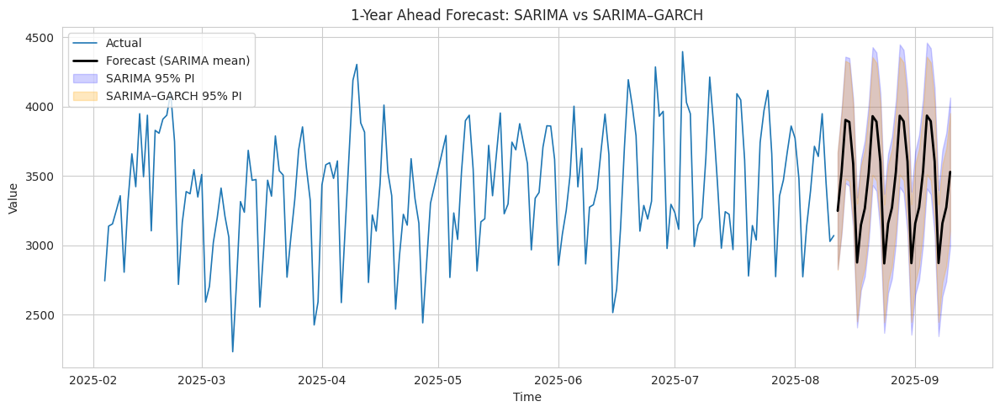

In [160]:
# ============================================
# 7) DỰ BÁO 1 NĂM TIẾP THEO: SARIMA vs SARIMA–GARCH
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from arch import arch_model

# ---- 7.1 Cấu hình số bước dự báo ----
H = 30  # ví dụ: 365 ngày; nếu series là tuần/tháng thì đổi thành 52 hoặc 12

# ---- 7.2 SARIMA forecast (mean + PI mặc định) ----
sar_fc = sarima_res.get_forecast(steps=H)
mean_fc = sar_fc.predicted_mean
pi_sar = sar_fc.conf_int(alpha=0.05)
pi_sar.columns = ['SARIMA_L', 'SARIMA_U']

# ---- 7.3 GARCH forecast volatility ----
resid = sarima_res.resid
garch_mod = arch_model(resid, vol='Garch', p=1, q=1, dist='normal')
garch_res = garch_mod.fit(disp="off")

garch_var = garch_res.forecast(horizon=H).variance.iloc[-1].values
garch_std = np.sqrt(garch_var)

z = 1.96
pi_garch = pd.DataFrame({
    'GARCH_L': mean_fc.values - z * garch_std,
    'GARCH_U': mean_fc.values + z * garch_std
}, index=mean_fc.index)

# ---- 7.4 Vẽ biểu đồ so sánh ----
plt.figure(figsize=(12,5))
plt.plot(series.index, series, label='Actual', lw=1.2)

# Mean forecast
plt.plot(mean_fc.index, mean_fc, label='Forecast (SARIMA mean)', lw=2, color='black')

# SARIMA interval
plt.fill_between(mean_fc.index, pi_sar['SARIMA_L'], pi_sar['SARIMA_U'],
                 alpha=0.18, label='SARIMA 95% PI', color='blue')

# SARIMA–GARCH interval
plt.fill_between(mean_fc.index, pi_garch['GARCH_L'], pi_garch['GARCH_U'],
                 alpha=0.25, label='SARIMA–GARCH 95% PI', color='orange')

plt.title("1-Year Ahead Forecast: SARIMA vs SARIMA–GARCH")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [162]:
# 1) Tối giản: bỏ MA2 và MA.S2
cands = [
    ((1,0,1),(0,1,1,7)),  # simpler
    ((2,0,1),(0,1,1,7)),  # thêm AR2
    ((1,0,1),(1,1,1,7)),  # thêm AR mùa vụ
]

from statsmodels.tsa.statespace.sarimax import SARIMAX
rows=[]
for order, seas in cands:
    p,d,q = order; P,D,Q,m = seas
    res = SARIMAX(series, order=order, seasonal_order=seas,
                  enforce_stationarity=False, enforce_invertibility=False).fit(disp=False)
    rows.append({"order":order,"seasonal":seas,"AIC":res.aic,"LB20_p":acorr_ljungbox(res.resid,lags=[20],return_df=True)['lb_pvalue'].iloc[0]})
pd.DataFrame(rows).sort_values("AIC")

,order,seasonal,AIC,LB20_p
0,"(1, 0, 1)","(0, 1, 1, 7)",2366.502341,9.462686e-22
1,"(2, 0, 1)","(0, 1, 1, 7)",2367.615421,1.612375e-51
2,"(1, 0, 1)","(1, 1, 1, 7)",2368.419684,2.883465e-22


# Train–Test Split

According to the project requirements, you need to try two time series split scenarios: **80/20** and **90/10**. The split must preserve the chronological order (no shuffling). The function below performs the split based on a given ratio.

In [164]:
def train_test_split_time_series(series, split_ratio=0.8):
    # Split a time series into train and test sets according to the ratio.
    n = len(series)
    split_point = int(n * split_ratio)
    train = series.iloc[:split_point]
    test = series.iloc[split_point:]
    return train, test

# Use the original series for splitting
series = df['Value']

# Scenario 1: 80/20 split
train_80, test_20 = train_test_split_time_series(series, split_ratio=0.8)

# Scenario 2: 90/10 split
train_90, test_10 = train_test_split_time_series(series, split_ratio=0.9)

print(f'Number of observations - Train 80/20: {len(train_80)}, Test: {len(test_20)}')
print(f'Number of observations - Train 90/10: {len(train_90)}, Test: {len(test_10)}')

Number of observations - Train 80/20: 151, Test: 38
Number of observations - Train 90/10: 170, Test: 19


#Naive Model (Baseline)

The Naive model forecasts that the future value will be equal to the last observed value in the training set. This is a simple model but is commonly used as a baseline to compare against more complex models. The main evaluation metric is RMSE on the test set.

RMSE Naive (80/20): 697.7884
RMSE Naive (90/10): 456.7409


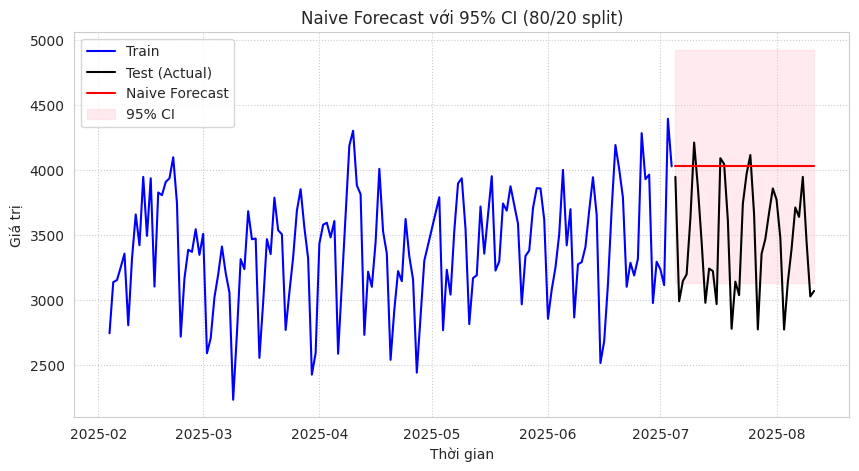

In [166]:
# --- Hàm Naive Forecast ---
def naive_forecast(train, test):
    last_value = train.iloc[-1]
    predictions = np.repeat(last_value, len(test))
    return predictions

def evaluate_rmse(true, pred):
    return np.sqrt(mean_squared_error(true, pred))

# --- Naive forecast 80/20 ---
preds_naive_80 = naive_forecast(train_80, test_20)
rmse_naive_80 = evaluate_rmse(test_20, preds_naive_80)

# --- Naive forecast 90/10 ---
preds_naive_90 = naive_forecast(train_90, test_10)
rmse_naive_90 = evaluate_rmse(test_10, preds_naive_90)

print(f'RMSE Naive (80/20): {rmse_naive_80:.4f}')
print(f'RMSE Naive (90/10): {rmse_naive_90:.4f}')

# ===== VẼ BIỂU ĐỒ (cho kịch bản 80/20) =====
# Giả định dữ liệu là Series với index thời gian
train = train_80
test = test_20
preds = preds_naive_80

# --- Tính CI 95% cho dự báo ---
# Lấy độ lệch chuẩn của residuals từ train (so với giá trị dự báo)
residuals = train - train.shift(1)  # Naive model dự báo y_t = y_{t-1}
residuals = residuals.dropna()
std_resid = residuals.std()

ci95 = 1.96 * std_resid
preds_upper = preds + ci95
preds_lower = preds - ci95

# --- Vẽ ---
plt.figure(figsize=(10,5))
plt.plot(train.index, train, label='Train', color='blue')
plt.plot(test.index, test, label='Test (Actual)', color='black')
plt.plot(test.index, preds, label='Naive Forecast', color='red')

# CI 95%
plt.fill_between(test.index, preds_lower, preds_upper, color='pink', alpha=0.3, label='95% CI')

plt.title('Naive Forecast với 95% CI (80/20 split)')
plt.xlabel('Thời gian')
plt.ylabel('Giá trị')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

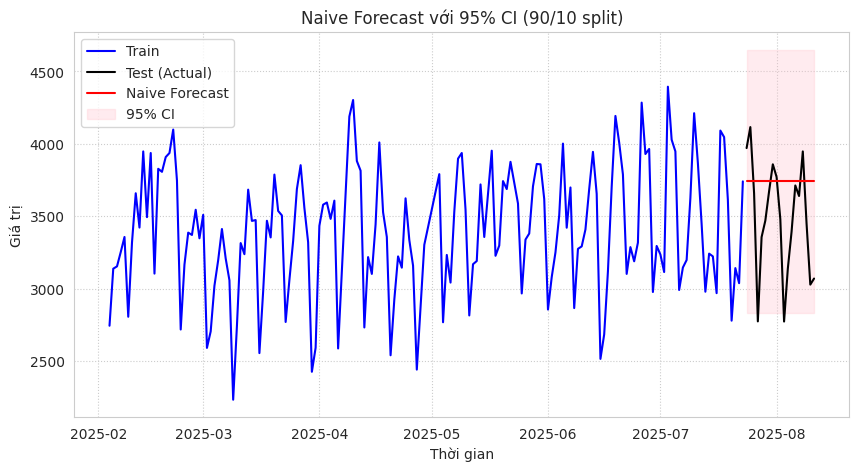

In [167]:
# ===== VẼ BIỂU ĐỒ (cho kịch bản 90/10) =====
train = train_90
test = test_10
preds = preds_naive_90

# --- Tính CI 95% cho dự báo ---
residuals = train - train.shift(1)
residuals = residuals.dropna()
std_resid = residuals.std()

ci95 = 1.96 * std_resid
preds_upper = preds + ci95
preds_lower = preds - ci95

# --- Vẽ ---
plt.figure(figsize=(10,5))
plt.plot(train.index, train, label='Train', color='blue')
plt.plot(test.index, test, label='Test (Actual)', color='black')
plt.plot(test.index, preds, label='Naive Forecast', color='red')

plt.fill_between(test.index, preds_lower, preds_upper, color='pink', alpha=0.3, label='95% CI')

plt.title('Naive Forecast với 95% CI (90/10 split)')
plt.xlabel('Thời gian')
plt.ylabel('Giá trị')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

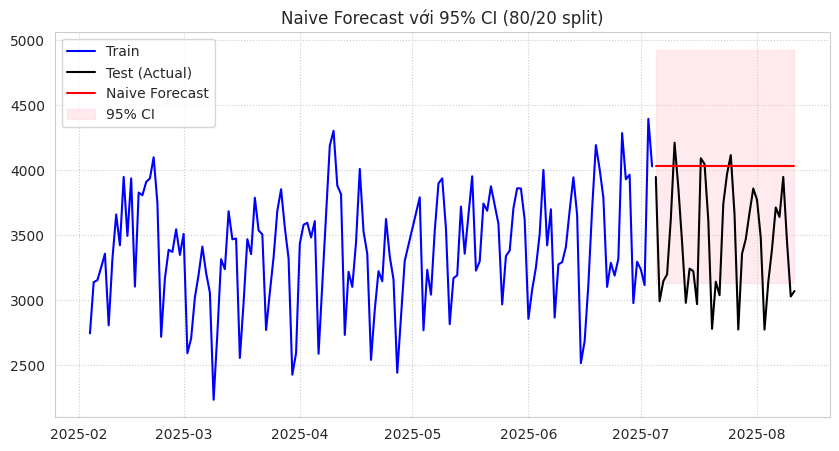

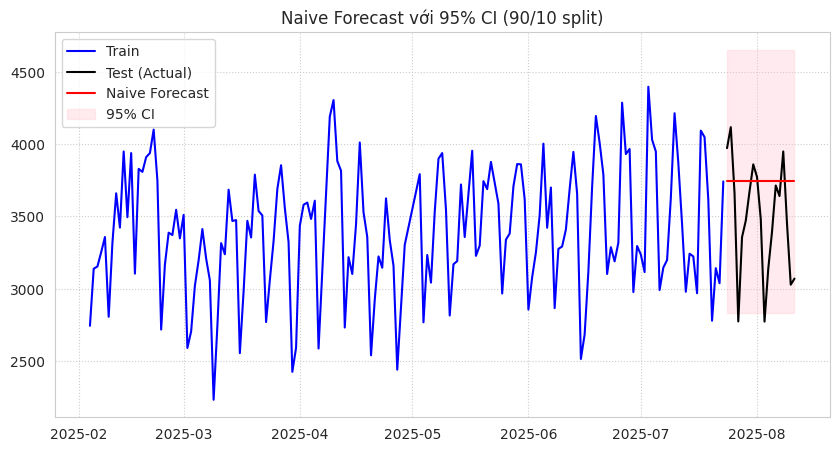

,Split,RMSE,Std Residuals,95% CI Width
0,80/20,697.788367,457.948744,1795.159078
1,90/10,456.740915,463.955569,1818.705829


In [168]:
# ===== BIỂU ĐỒ 80/20 =====
train = train_80
test = test_20
preds = preds_naive_80

residuals_80 = train - train.shift(1)
residuals_80 = residuals_80.dropna()
std_resid_80 = residuals_80.std()
ci95_80 = 1.96 * std_resid_80

preds_upper_80 = preds + ci95_80
preds_lower_80 = preds - ci95_80

plt.figure(figsize=(10,5))
plt.plot(train.index, train, label='Train', color='blue')
plt.plot(test.index, test, label='Test (Actual)', color='black')
plt.plot(test.index, preds, label='Naive Forecast', color='red')
plt.fill_between(test.index, preds_lower_80, preds_upper_80, color='pink', alpha=0.3, label='95% CI')
plt.title('Naive Forecast với 95% CI (80/20 split)')
plt.legend(); plt.grid(True, linestyle=':'); plt.show()

# ===== BIỂU ĐỒ 90/10 =====
train = train_90
test = test_10
preds = preds_naive_90

residuals_90 = train - train.shift(1)
residuals_90 = residuals_90.dropna()
std_resid_90 = residuals_90.std()
ci95_90 = 1.96 * std_resid_90

preds_upper_90 = preds + ci95_90
preds_lower_90 = preds - ci95_90

plt.figure(figsize=(10,5))
plt.plot(train.index, train, label='Train', color='blue')
plt.plot(test.index, test, label='Test (Actual)', color='black')
plt.plot(test.index, preds, label='Naive Forecast', color='red')
plt.fill_between(test.index, preds_lower_90, preds_upper_90, color='pink', alpha=0.3, label='95% CI')
plt.title('Naive Forecast với 95% CI (90/10 split)')
plt.legend(); plt.grid(True, linestyle=':'); plt.show()

# ===== BẢNG KPI SO SÁNH =====
kpi_table = pd.DataFrame({
    "Split": ["80/20", "90/10"],
    "RMSE": [rmse_naive_80, rmse_naive_90],
    "Std Residuals": [std_resid_80, std_resid_90],
    "95% CI Width": [2*ci95_80, 2*ci95_90]
})

kpi_table

In [169]:
# ===== BẢNG DỰ BÁO NAIVE (80/20) =====
forecast_table_80 = pd.DataFrame({
    "Actual": test_20.values,
    "Forecast": preds_naive_80,
    "Lower_95_CI": preds_naive_80 - ci95,
    "Upper_95_CI": preds_naive_80 + ci95
}, index=test_20.index)

print("=== Naive Forecast 80/20 ===")
display(forecast_table_80.head(10))  # in 10 dòng đầu

# ===== BẢNG DỰ BÁO NAIVE (90/10) =====
# Lặp lại phần tính CI cho split 90/10
residuals_90 = train_90 - train_90.shift(1)
std_resid_90 = residuals_90.dropna().std()
ci95_90 = 1.96 * std_resid_90

forecast_table_90 = pd.DataFrame({
    "Actual": test_10.values,
    "Forecast": preds_naive_90,
    "Lower_95_CI": preds_naive_90 - ci95_90,
    "Upper_95_CI": preds_naive_90 + ci95_90
}, index=test_10.index)

print("\n=== Naive Forecast 90/10 ===")
display(forecast_table_90.head(10))

=== Naive Forecast 80/20 ===


,Actual,Forecast,Lower_95_CI,Upper_95_CI
date,,,,
2025-07-05,3948.0,4029.0,3119.647086,4938.352914
2025-07-06,2991.0,4029.0,3119.647086,4938.352914
2025-07-07,3146.0,4029.0,3119.647086,4938.352914
2025-07-08,3198.0,4029.0,3119.647086,4938.352914
2025-07-09,3626.0,4029.0,3119.647086,4938.352914
2025-07-10,4212.0,4029.0,3119.647086,4938.352914
2025-07-11,3868.0,4029.0,3119.647086,4938.352914
2025-07-12,3447.0,4029.0,3119.647086,4938.352914
2025-07-13,2979.0,4029.0,3119.647086,4938.352914



=== Naive Forecast 90/10 ===


,Actual,Forecast,Lower_95_CI,Upper_95_CI
date,,,,
2025-07-24,3971.0,3741.0,2831.647086,4650.352914
2025-07-25,4116.0,3741.0,2831.647086,4650.352914
2025-07-26,3659.0,3741.0,2831.647086,4650.352914
2025-07-27,2774.0,3741.0,2831.647086,4650.352914
2025-07-28,3356.0,3741.0,2831.647086,4650.352914
2025-07-29,3470.0,3741.0,2831.647086,4650.352914
2025-07-30,3672.0,3741.0,2831.647086,4650.352914
2025-07-31,3859.0,3741.0,2831.647086,4650.352914
2025-08-01,3772.0,3741.0,2831.647086,4650.352914


In [170]:
# === Các hàm KPI ===
def rmse(true, pred):
    return np.sqrt(mean_squared_error(true, pred))

def mape(true, pred):
    true, pred = np.array(true), np.array(pred)
    return np.mean(np.abs((true - pred) / true)) * 100

def mad(true, pred):
    return np.mean(np.abs(true - pred))

def bias(true, pred):
    return np.mean(pred - true)

# === Naive Forecast function ===
def naive_forecast(train, test):
    last_value = train.iloc[-1]
    return np.repeat(last_value, len(test))

# === Tính KPI cho 80/20 ===
preds_80 = naive_forecast(train_80, test_20)
metrics_80 = {
    'RMSE': rmse(test_20, preds_80),
    'MAPE (%)': mape(test_20, preds_80),
    'MAD': mad(test_20, preds_80),
    'BIAS': bias(test_20, preds_80)
}

# === Tính KPI cho 90/10 ===
preds_90 = naive_forecast(train_90, test_10)
metrics_90 = {
    'RMSE': rmse(test_10, preds_90),
    'MAPE (%)': mape(test_10, preds_90),
    'MAD': mad(test_10, preds_90),
    'BIAS': bias(test_10, preds_90)
}

# === Tạo bảng DataFrame ===
kpi_df = pd.DataFrame({
    '80/20 Split': metrics_80,
    '90/10 Split': metrics_90
}).T  # .T để hiển thị mỗi kịch bản là 1 hàng

# Làm tròn kết quả
kpi_df = kpi_df.round(4)

kpi_df.head(2)

,RMSE,MAPE (%),MAD,BIAS
80/20 Split,697.7884,18.4495,584.7105,566.2368
90/10 Split,456.7409,11.1334,353.6316,252.4737


#AR Model (Autoregressive)

The AR(p) model uses the lagged values of the series itself for forecasting. To determine the order p, you can use the Partial Autocorrelation Function (PACF) plot: the cutoff point of the PACF after lag p suggests the appropriate order.

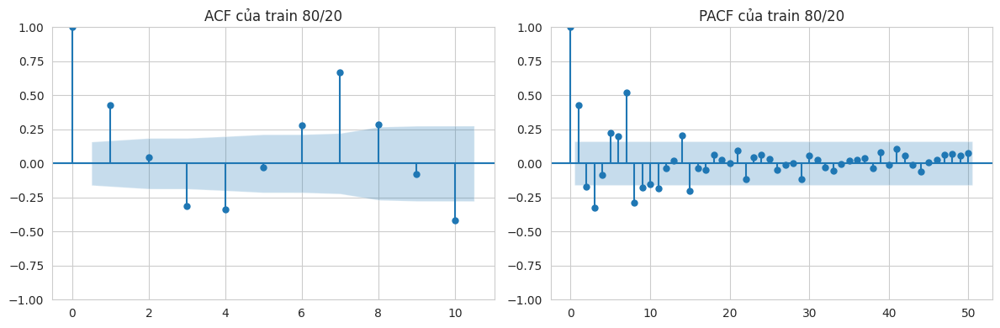

AR(1) (80/20) AIC: 2218.5182
RMSE AR(1) (80/20): 409.3425
AR(1) (90/10) AIC: 2501.1933
RMSE AR(1) (90/10): 374.5072
AR(2) (80/20) AIC: 2202.6470
RMSE AR(2) (80/20): 406.5214
AR(2) (90/10) AIC: 2483.3447
RMSE AR(2) (90/10): 368.7500
AR(3) (80/20) AIC: 2171.5071
RMSE AR(3) (80/20): 388.6271
AR(3) (90/10) AIC: 2446.0946
RMSE AR(3) (90/10): 336.6699
AR(4) (80/20) AIC: 2158.4241
RMSE AR(4) (80/20): 393.2845
AR(4) (90/10) AIC: 2433.2398
RMSE AR(4) (90/10): 331.9161
AR(5) (80/20) AIC: 2137.3335
RMSE AR(5) (80/20): 364.0503
AR(5) (90/10) AIC: 2413.6248
RMSE AR(5) (90/10): 304.2689
AR(6) (80/20) AIC: 2117.3899
RMSE AR(6) (80/20): 333.3220
AR(6) (90/10) AIC: 2392.5032
RMSE AR(6) (90/10): 259.6189
AR(7) (80/20) AIC: 2049.7747
RMSE AR(7) (80/20): 356.4871
AR(7) (90/10) AIC: 2315.9755
RMSE AR(7) (90/10): 193.5776

Summary of AIC and RMSE for different AR orders:
AR(1): AIC (80/20) = 2218.5182, RMSE (80/20) = 409.3425, AIC (90/10) = 2501.1933, RMSE (90/10) = 374.5072
AR(2): AIC (80/20) = 2202.6470, 

In [171]:
# Vẽ ACF và PACF cho train 80/20
fig, axes = plt.subplots(1, 2, figsize=(12,4))
plot_acf(train_80, lags=10, ax=axes[0])
axes[0].set_title('ACF của train 80/20')
plot_pacf(train_80, lags=50, ax=axes[1])
axes[1].set_title('PACF của train 80/20')
plt.tight_layout()
plt.show()

# Iterate through AR orders from 1 to 10
aic_results = {}
for p_ar in range(1, 8):
    try:
        # Huấn luyện mô hình AR cho kịch bản 80/20
        model_ar_80 = AutoReg(train_80, lags=p_ar).fit()
        aic_80 = model_ar_80.aic
        print(f'AR({p_ar}) (80/20) AIC: {aic_80:.4f}')

        # Dự báo cho khoảng test (optional, but keeping for comparison)
        preds_ar_80 = model_ar_80.predict(start=len(train_80), end=len(train_80)+len(test_20)-1, dynamic=False)
        rmse_ar_80 = evaluate_rmse(test_20, preds_ar_80)
        print(f'RMSE AR({p_ar}) (80/20): {rmse_ar_80:.4f}')


        # Huấn luyện mô hình AR cho kịch bản 90/10
        model_ar_90 = AutoReg(train_90, lags=p_ar).fit()
        aic_90 = model_ar_90.aic
        print(f'AR({p_ar}) (90/10) AIC: {aic_90:.4f}')

        preds_ar_90 = model_ar_90.predict(start=len(train_90), end=len(train_90)+len(test_10)-1, dynamic=False)
        rmse_ar_90 = evaluate_rmse(test_10, preds_ar_90)
        print(f'RMSE AR({p_ar}) (90/10): {rmse_ar_90:.4f}')

        aic_results[p_ar] = {'AIC_80/20': aic_80, 'AIC_90/10': aic_90, 'RMSE_80/20': rmse_ar_80, 'RMSE_90/10': rmse_ar_90}

    except Exception as e:
        print(f"Could not fit AR({p_ar}) model: {e}")

print("\nSummary of AIC and RMSE for different AR orders:")
for p, metrics in aic_results.items():
    print(f"AR({p}): AIC (80/20) = {metrics['AIC_80/20']:.4f}, RMSE (80/20) = {metrics['RMSE_80/20']:.4f}, AIC (90/10) = {metrics['AIC_90/10']:.4f}, RMSE (90/10) = {metrics['RMSE_90/10']:.4f}")

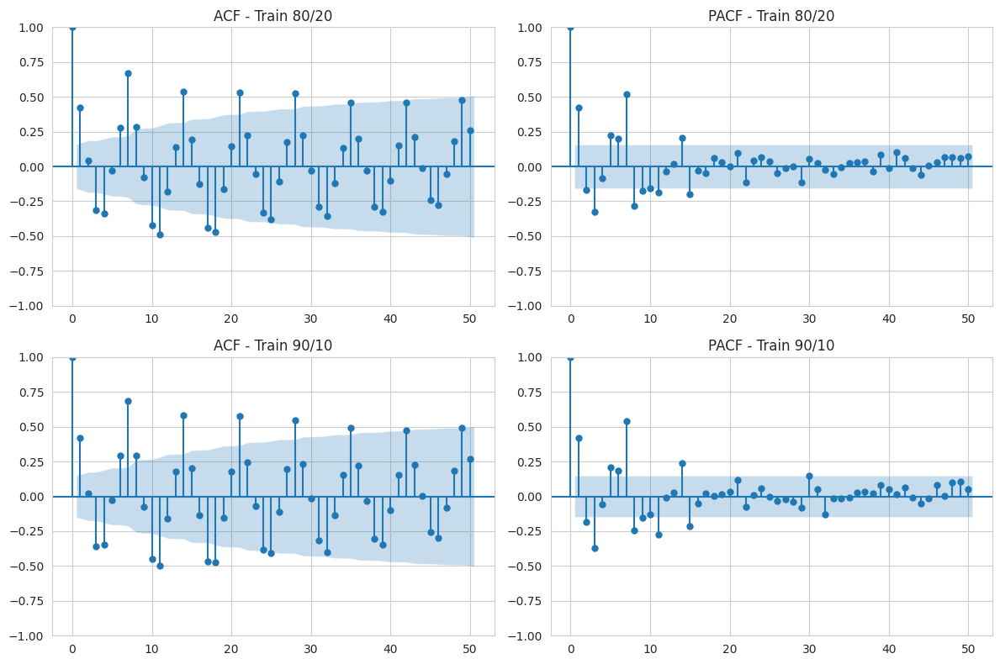

In [173]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Vẽ ACF/PACF cho cả train_80 và train_90
fig, axes = plt.subplots(2, 2, figsize=(12,8))

# --- 80/20 ---
plot_acf(train_80, lags=50, ax=axes[0,0])
axes[0,0].set_title('ACF - Train 80/20')
plot_pacf(train_80, lags=50, ax=axes[0,1])
axes[0,1].set_title('PACF - Train 80/20')

# --- 90/10 ---
plot_acf(train_90, lags=50, ax=axes[1,0])
axes[1,0].set_title('ACF - Train 90/10')
plot_pacf(train_90, lags=50, ax=axes[1,1])
axes[1,1].set_title('PACF - Train 90/10')

plt.tight_layout()
plt.show()

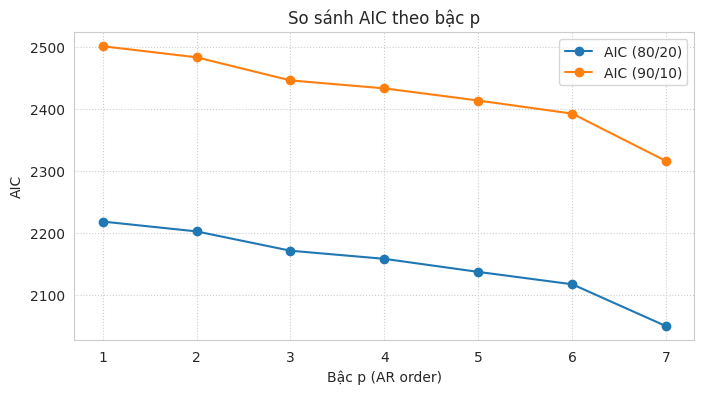

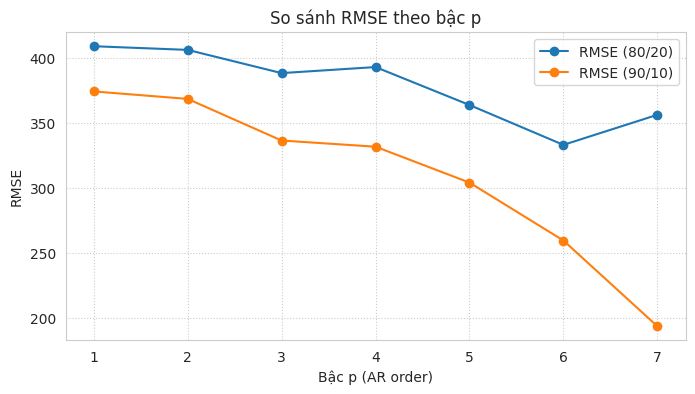

In [174]:
# === Chuyển kết quả thành DataFrame để dễ vẽ ===
aic_df = pd.DataFrame(aic_results).T  # index = p, columns = AIC & RMSE
aic_df.index.name = 'p'

# === Vẽ biểu đồ AIC ===
plt.figure(figsize=(8,4))
plt.plot(aic_df.index, aic_df['AIC_80/20'], marker='o', label='AIC (80/20)')
plt.plot(aic_df.index, aic_df['AIC_90/10'], marker='o', label='AIC (90/10)')
plt.title('So sánh AIC theo bậc p')
plt.xlabel('Bậc p (AR order)')
plt.ylabel('AIC')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

# === Vẽ biểu đồ RMSE ===
plt.figure(figsize=(8,4))
plt.plot(aic_df.index, aic_df['RMSE_80/20'], marker='o', label='RMSE (80/20)')
plt.plot(aic_df.index, aic_df['RMSE_90/10'], marker='o', label='RMSE (90/10)')
plt.title('So sánh RMSE theo bậc p')
plt.xlabel('Bậc p (AR order)')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

Top 3 AR models theo RMSE trung bình:
     AIC_80/20  RMSE_80/20    AIC_90/10  RMSE_90/10   RMSE_mean
p                                                              
7  2049.774672  356.487106  2315.975481  193.577565  275.032335
6  2117.389885  333.321982  2392.503234  259.618911  296.470446
5  2137.333504  364.050306  2413.624775  304.268856  334.159581
4  2158.424078  393.284520  2433.239785  331.916074  362.600297
3  2171.507053  388.627101  2446.094597  336.669882  362.648491


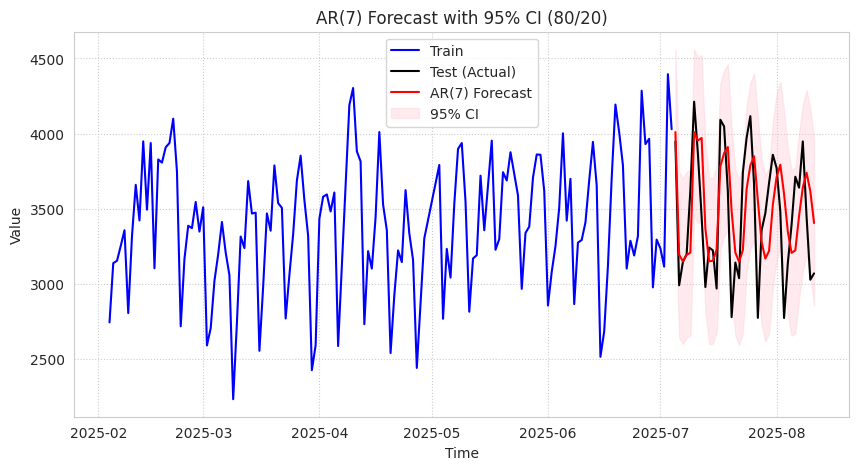

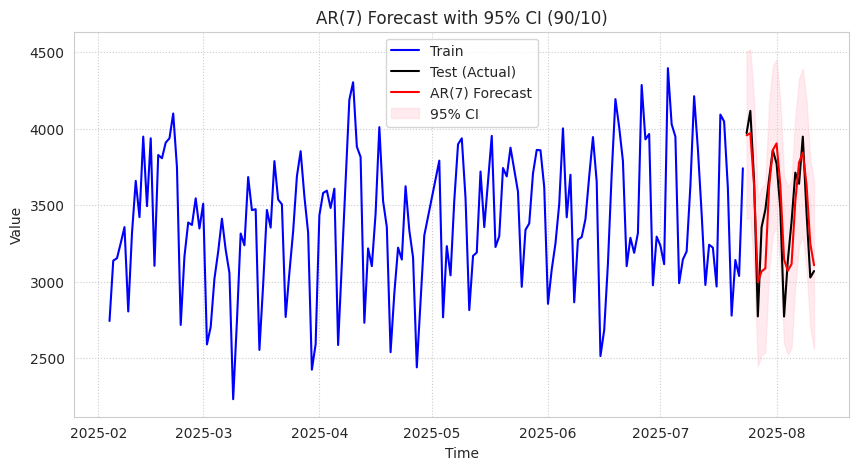

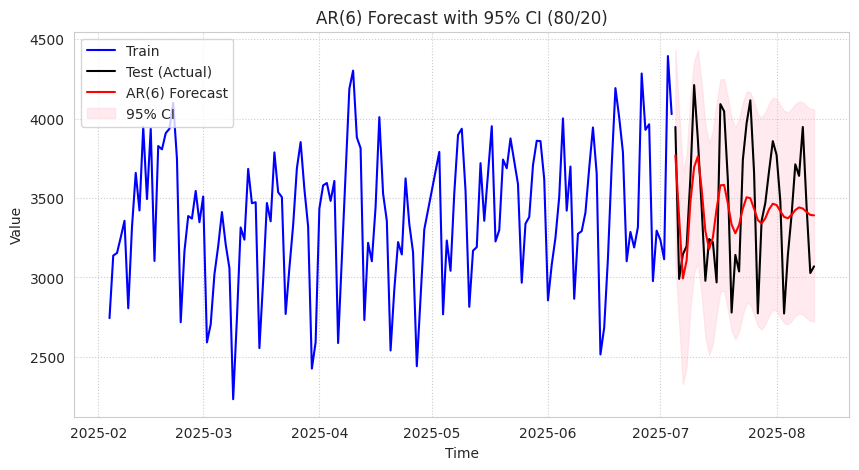

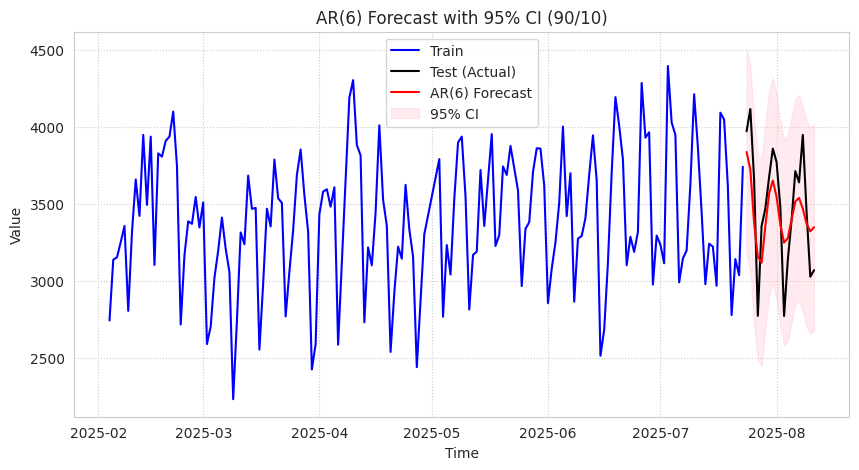

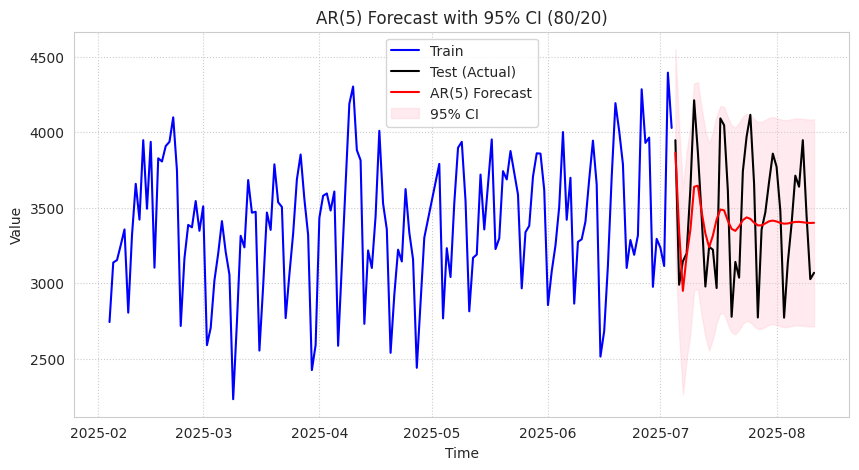

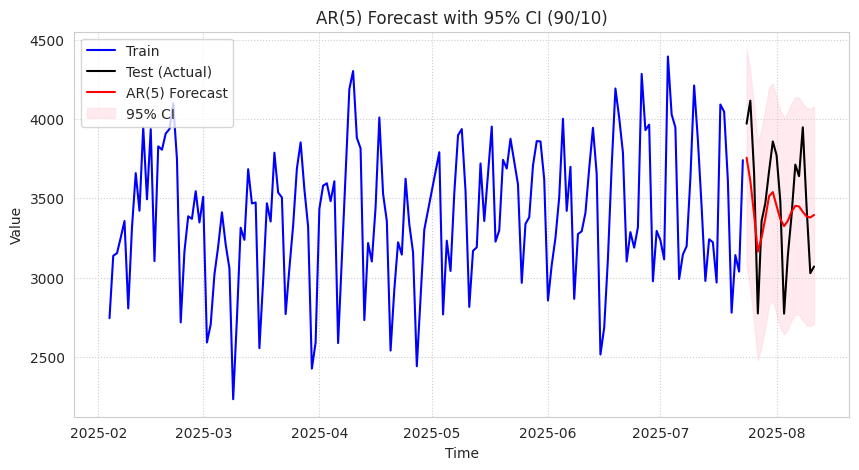

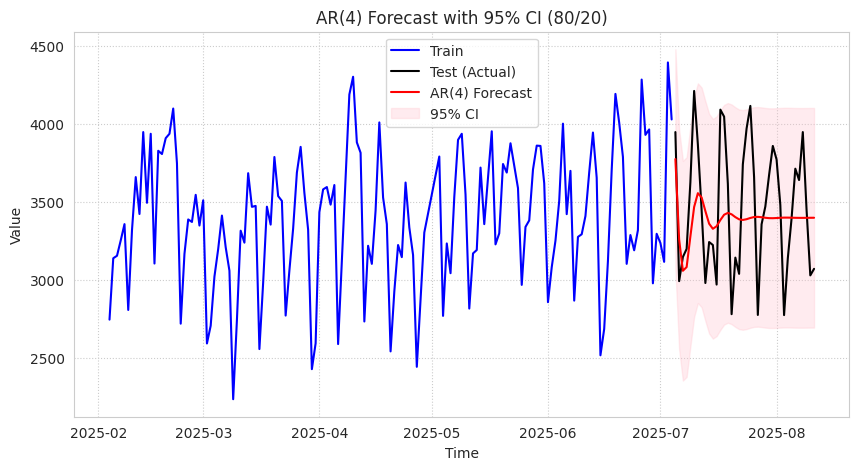

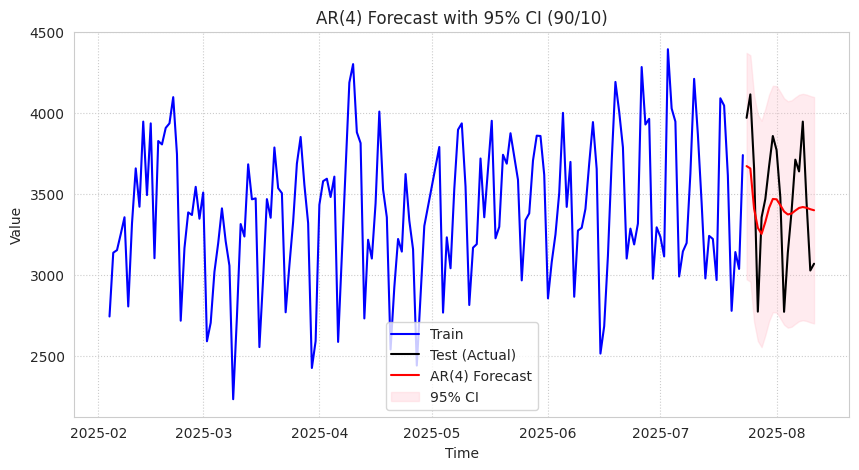

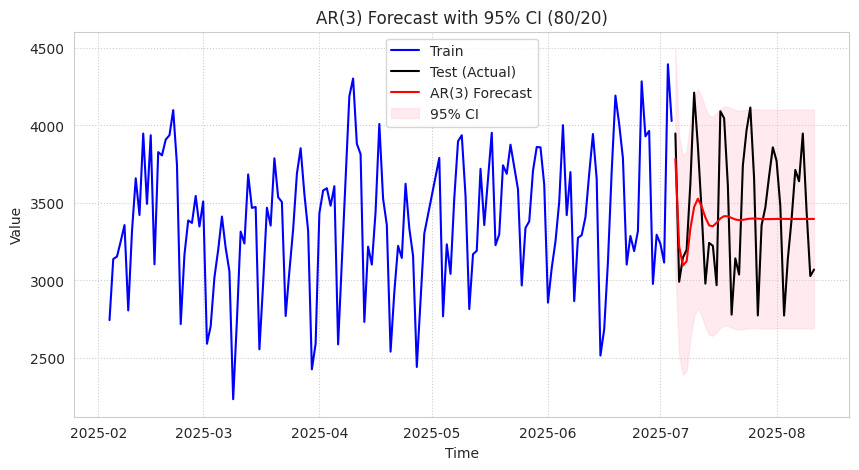

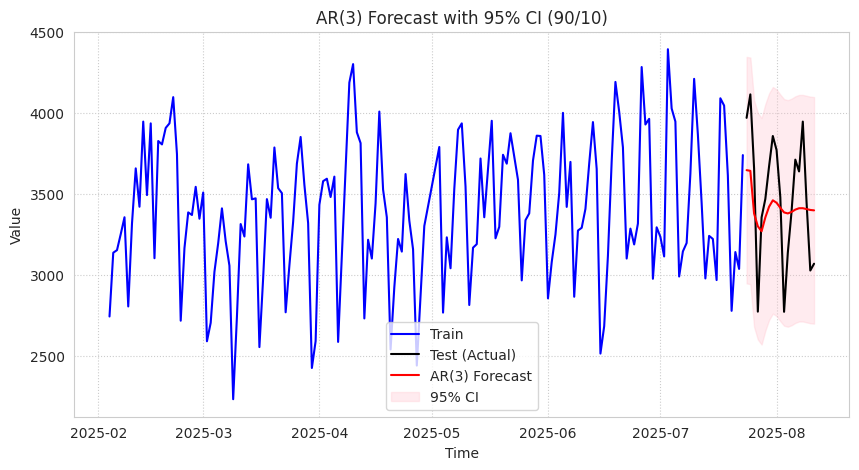

In [175]:
# ===== 1. Chuyển kết quả sang DataFrame =====
results_df = pd.DataFrame(aic_results).T
results_df.index.name = 'p'

# ===== 2. Chọn top 3 mô hình theo RMSE trung bình giữa 80/20 và 90/10 =====
results_df['RMSE_mean'] = results_df[['RMSE_80/20', 'RMSE_90/10']].mean(axis=1)
top3_models = results_df.sort_values(by='RMSE_mean').head(5)
print("Top 3 AR models theo RMSE trung bình:")
print(top3_models)

# ===== 3. Vẽ forecast cho từng model =====
for p_ar in top3_models.index:
    # Train mô hình trên train_80
    model_ar_80 = AutoReg(train_80, lags=p_ar).fit()
    preds_80 = model_ar_80.predict(start=len(train_80), end=len(train_80)+len(test_20)-1, dynamic=False)

    # Tính CI 95% dựa trên std của residuals train
    residuals = model_ar_80.resid
    std_resid = residuals.std()
    ci95 = 1.96 * std_resid
    preds_upper = preds_80 + ci95
    preds_lower = preds_80 - ci95

    # Vẽ biểu đồ forecast 80/20
    plt.figure(figsize=(10,5))
    plt.plot(train_80.index, train_80, label='Train', color='blue')
    plt.plot(test_20.index, test_20, label='Test (Actual)', color='black')
    plt.plot(test_20.index, preds_80, label=f'AR({p_ar}) Forecast', color='red')
    plt.fill_between(test_20.index, preds_lower, preds_upper, color='pink', alpha=0.3, label='95% CI')
    plt.title(f'AR({p_ar}) Forecast with 95% CI (80/20)')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True, linestyle=':')
    plt.show()

    # Train mô hình trên train_90
    model_ar_90 = AutoReg(train_90, lags=p_ar).fit()
    preds_90 = model_ar_90.predict(start=len(train_90), end=len(train_90)+len(test_10)-1, dynamic=False)

    # CI 95% cho 90/10
    residuals_90 = model_ar_90.resid
    std_resid_90 = residuals_90.std()
    ci95_90 = 1.96 * std_resid_90
    preds_upper_90 = preds_90 + ci95_90
    preds_lower_90 = preds_90 - ci95_90

    # Vẽ biểu đồ forecast 90/10
    plt.figure(figsize=(10,5))
    plt.plot(train_90.index, train_90, label='Train', color='blue')
    plt.plot(test_10.index, test_10, label='Test (Actual)', color='black')
    plt.plot(test_10.index, preds_90, label=f'AR({p_ar}) Forecast', color='red')
    plt.fill_between(test_10.index, preds_lower_90, preds_upper_90, color='pink', alpha=0.3, label='95% CI')
    plt.title(f'AR({p_ar}) Forecast with 95% CI (90/10)')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True, linestyle=':')
    plt.show()

# MA Model (Moving Average)

The MA(q) model is based on lagged errors (shocks) to generate forecasts. A key characteristic of MA(q) is that the ACF function cuts off after lag q. Similar to the AR model, q is chosen using the ACF plot, and the model can be estimated using ARIMA with the configuration (0,0,q).

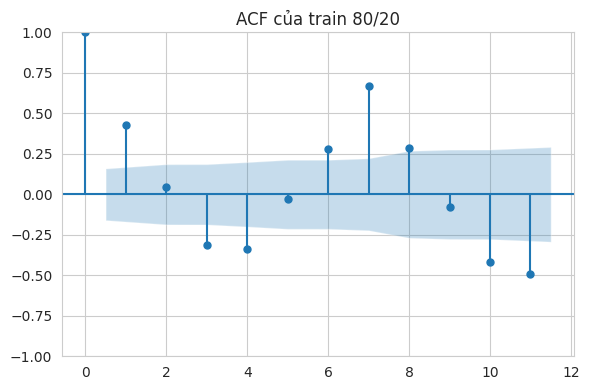

MA(1): AIC(80/20)=2237.329, RMSE(80/20)=411.051 | AIC(90/10)=2519.594, RMSE(90/10)=379.269
MA(2): AIC(80/20)=2226.512, RMSE(80/20)=405.178 | AIC(90/10)=2506.026, RMSE(90/10)=367.638
MA(3): AIC(80/20)=2220.789, RMSE(80/20)=397.982 | AIC(90/10)=2496.277, RMSE(90/10)=370.221
MA(4): AIC(80/20)=2222.718, RMSE(80/20)=397.766 | AIC(90/10)=2498.015, RMSE(90/10)=367.947
MA(5): AIC(80/20)=2217.126, RMSE(80/20)=407.371 | AIC(90/10)=2493.870, RMSE(90/10)=348.012
MA(6): AIC(80/20)=2198.336, RMSE(80/20)=415.754 | AIC(90/10)=2478.922, RMSE(90/10)=327.250
MA(7): AIC(80/20)=2187.450, RMSE(80/20)=375.720 | AIC(90/10)=2458.746, RMSE(90/10)=339.959


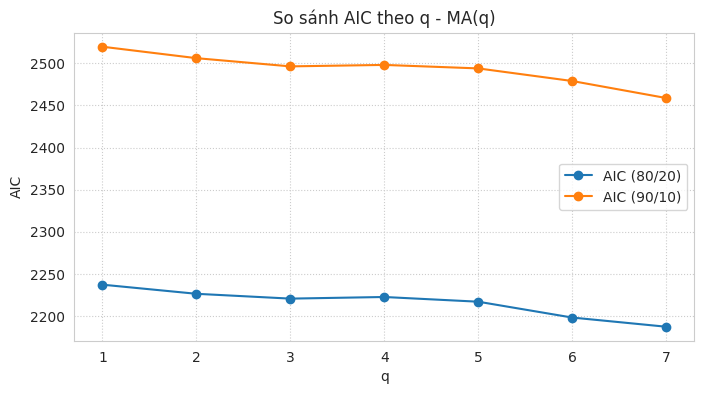

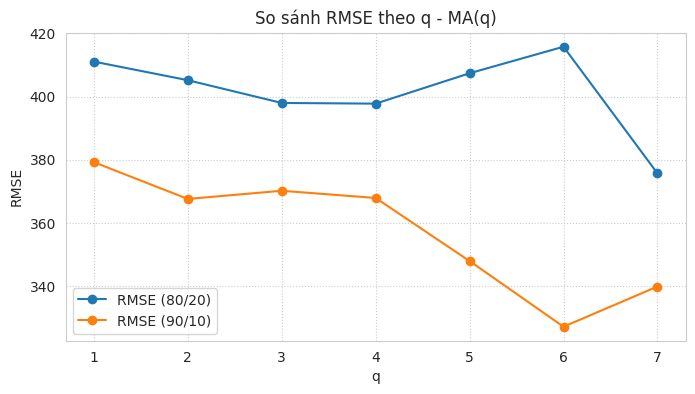


Bảng kết quả MA(q):
   AIC_80/20  RMSE_80/20  AIC_90/10  RMSE_90/10  RMSE_mean
q                                                         
1  2237.3287    411.0515  2519.5936    379.2688   395.1601
2  2226.5122    405.1781  2506.0265    367.6382   386.4082
3  2220.7885    397.9819  2496.2772    370.2214   384.1017
4  2222.7176    397.7660  2498.0150    367.9470   382.8565
5  2217.1259    407.3714  2493.8702    348.0123   377.6919
6  2198.3359    415.7543  2478.9217    327.2502   371.5022
7  2187.4503    375.7197  2458.7459    339.9593   357.8395

Top 3 MA(q) theo RMSE_mean:
   AIC_80/20  RMSE_80/20  AIC_90/10  RMSE_90/10  RMSE_mean
q                                                         
7  2187.4503    375.7197  2458.7459    339.9593   357.8395
6  2198.3359    415.7543  2478.9217    327.2502   371.5022
5  2217.1259    407.3714  2493.8702    348.0123   377.6919


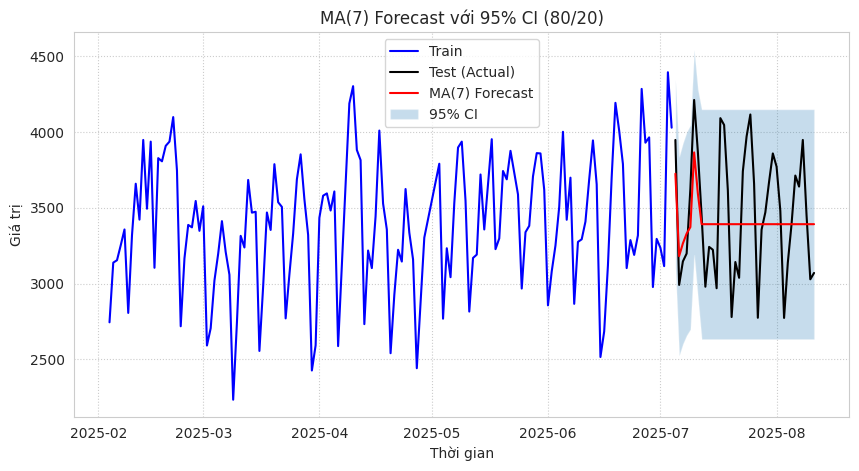

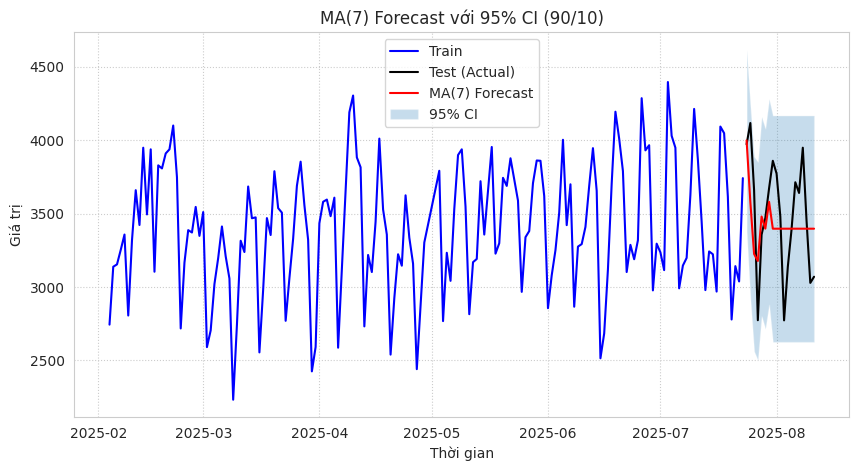

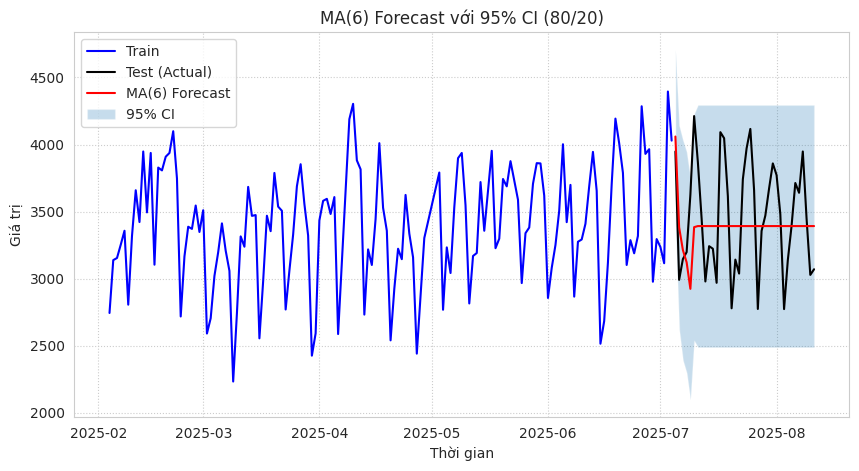

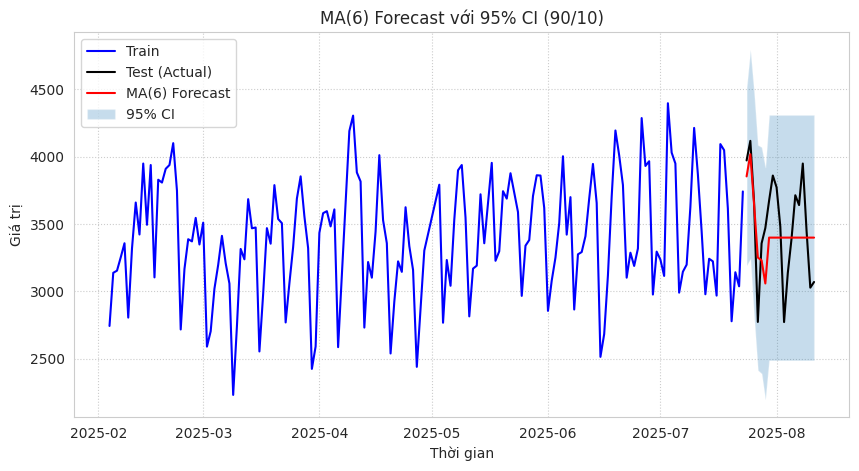

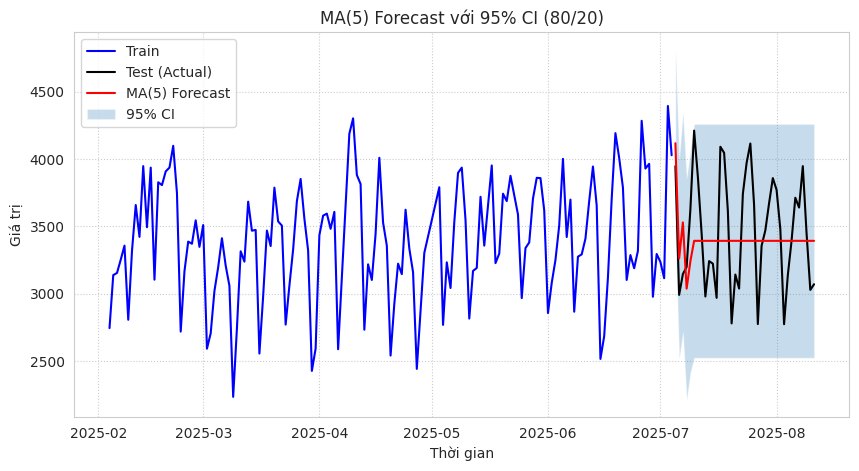

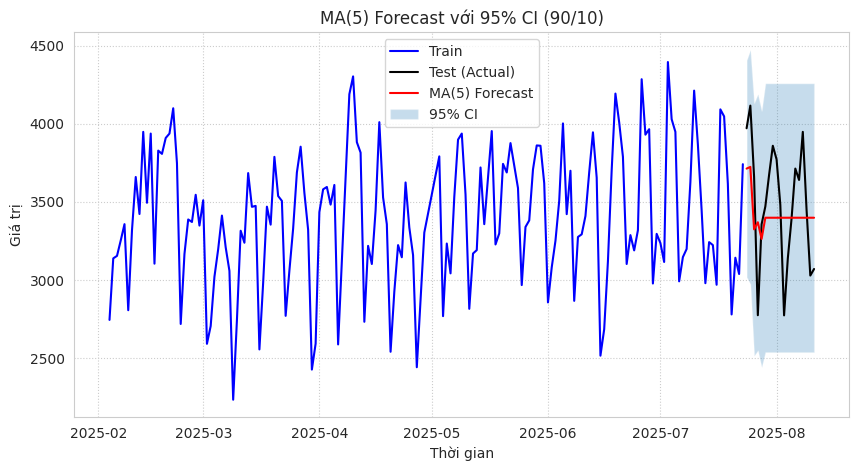

In [176]:
# ===== 0) Vẽ ACF cho train 80/20 để ước lượng q =====
fig, ax = plt.subplots(figsize=(6,4))
plot_acf(train_80, lags=11, ax=ax)
ax.set_title('ACF của train 80/20')
plt.tight_layout(); plt.show()

# ===== 1) Quét MA(q) với q = 1..10 cho 2 kịch bản =====
ma_results = {}  # {q: {'AIC_80/20':..., 'RMSE_80/20':..., 'AIC_90/10':..., 'RMSE_90/10':...}}

for q in range(1, 8):
    try:
        # --- 80/20 ---
        model_80 = ARIMA(train_80, order=(0,0,q))
        res_80 = model_80.fit()
        aic_80 = res_80.aic

        # Dự báo số bước bằng độ dài test_20
        fc_80 = res_80.get_forecast(steps=len(test_20))
        preds_80 = fc_80.predicted_mean
        rmse_80 = evaluate_rmse(np.asarray(test_20), np.asarray(preds_80))

        # --- 90/10 ---
        model_90 = ARIMA(train_90, order=(0,0,q))
        res_90 = model_90.fit()
        aic_90 = res_90.aic

        fc_90 = res_90.get_forecast(steps=len(test_10))
        preds_90 = fc_90.predicted_mean
        rmse_90 = evaluate_rmse(np.asarray(test_10), np.asarray(preds_90))

        ma_results[q] = {
            'AIC_80/20': aic_80, 'RMSE_80/20': rmse_80,
            'AIC_90/10': aic_90, 'RMSE_90/10': rmse_90
        }

        print(f"MA({q}): AIC(80/20)={aic_80:.3f}, RMSE(80/20)={rmse_80:.3f} | AIC(90/10)={aic_90:.3f}, RMSE(90/10)={rmse_90:.3f}")

    except Exception as e:
        print(f"Không fit được MA({q}): {e}")

# ===== 2) Tổng hợp & trực quan AIC/RMSE theo q =====
ma_df = pd.DataFrame(ma_results).T
ma_df.index.name = 'q'
ma_df['RMSE_mean'] = ma_df[['RMSE_80/20', 'RMSE_90/10']].mean(axis=1)

# Plot AIC
plt.figure(figsize=(8,4))
plt.plot(ma_df.index, ma_df['AIC_80/20'], marker='o', label='AIC (80/20)')
plt.plot(ma_df.index, ma_df['AIC_90/10'], marker='o', label='AIC (90/10)')
plt.title('So sánh AIC theo q - MA(q)')
plt.xlabel('q'); plt.ylabel('AIC'); plt.grid(True, linestyle=':'); plt.legend(); plt.show()

# Plot RMSE
plt.figure(figsize=(8,4))
plt.plot(ma_df.index, ma_df['RMSE_80/20'], marker='o', label='RMSE (80/20)')
plt.plot(ma_df.index, ma_df['RMSE_90/10'], marker='o', label='RMSE (90/10)')
plt.title('So sánh RMSE theo q - MA(q)')
plt.xlabel('q'); plt.ylabel('RMSE'); plt.grid(True, linestyle=':'); plt.legend(); plt.show()

print("\nBảng kết quả MA(q):")
display_cols = ['AIC_80/20','RMSE_80/20','AIC_90/10','RMSE_90/10','RMSE_mean']
print(ma_df[display_cols].round(4))

# ===== 3) Chọn Top-3 theo RMSE_mean thấp nhất =====
top3 = ma_df.sort_values('RMSE_mean').head(3)
print("\nTop 3 MA(q) theo RMSE_mean:")
print(top3[display_cols].round(4))

# ===== 4) Vẽ forecast + CI 95% cho mỗi q trong Top-3 =====
for q in top3.index:
    # ---- 80/20 ----
    res_80 = ARIMA(train_80, order=(0,0,q)).fit()
    fc_80 = res_80.get_forecast(steps=len(test_20))
    preds_80 = fc_80.predicted_mean
    ci_80 = fc_80.conf_int(alpha=0.05)  # 95% CI
    # Đồng bộ index dự báo với test nếu cần
    preds_80.index = test_20.index
    ci_80.index = test_20.index
    ci_lower_80 = ci_80.iloc[:,0]
    ci_upper_80 = ci_80.iloc[:,1]

    plt.figure(figsize=(10,5))
    plt.plot(train_80.index, train_80, label='Train', color='blue')
    plt.plot(test_20.index, test_20, label='Test (Actual)', color='black')
    plt.plot(test_20.index, preds_80, label=f'MA({q}) Forecast', color='red')
    plt.fill_between(test_20.index, ci_lower_80, ci_upper_80, alpha=0.25, label='95% CI')
    plt.title(f'MA({q}) Forecast với 95% CI (80/20)')
    plt.xlabel('Thời gian'); plt.ylabel('Giá trị'); plt.grid(True, linestyle=':'); plt.legend()
    plt.show()

    # ---- 90/10 ----
    res_90 = ARIMA(train_90, order=(0,0,q)).fit()
    fc_90 = res_90.get_forecast(steps=len(test_10))
    preds_90 = fc_90.predicted_mean
    ci_90 = fc_90.conf_int(alpha=0.05)
    preds_90.index = test_10.index
    ci_90.index = test_10.index
    ci_lower_90 = ci_90.iloc[:,0]
    ci_upper_90 = ci_90.iloc[:,1]

    plt.figure(figsize=(10,5))
    plt.plot(train_90.index, train_90, label='Train', color='blue')
    plt.plot(test_10.index, test_10, label='Test (Actual)', color='black')
    plt.plot(test_10.index, preds_90, label=f'MA({q}) Forecast', color='red')
    plt.fill_between(test_10.index, ci_lower_90, ci_upper_90, alpha=0.25, label='95% CI')
    plt.title(f'MA({q}) Forecast với 95% CI (90/10)')
    plt.xlabel('Thời gian'); plt.ylabel('Giá trị'); plt.grid(True, linestyle=':'); plt.legend()
    plt.show()

# ARMA Model

The ARMA(p,q) model combines the autoregressive and moving average components. You can use ARIMA with d=0 to estimate it.

In [177]:
# Chọn p và q (điều chỉnh dựa vào ACF/PACF)
p_arma = 7
q_arma = 7

# Mô hình ARMA cho kịch bản 80/20
model_arma_80 = ARIMA(train_80, order=(p_arma,0,q_arma)).fit()
preds_arma_80 = model_arma_80.predict(start=len(train_80), end=len(train_80)+len(test_20)-1)
rmse_arma_80 = evaluate_rmse(test_20, preds_arma_80)

# Mô hình ARMA cho kịch bản 90/10
model_arma_90 = ARIMA(train_90, order=(p_arma,0,q_arma)).fit()
preds_arma_90 = model_arma_90.predict(start=len(train_90), end=len(train_90)+len(test_10)-1)
rmse_arma_90 = evaluate_rmse(test_10, preds_arma_90)

print(f'RMSE ARMA({p_arma},{q_arma}) (80/20): {rmse_arma_80:.4f}')
print(f'RMSE ARMA({p_arma},{q_arma}) (90/10): {rmse_arma_90:.4f}')

RMSE ARMA(7,7) (80/20): 229.3348
RMSE ARMA(7,7) (90/10): 225.2125


In [ ]:
'''# 1) Grid search ARMA(p,q)
results = []  # sẽ thành DataFrame

P_MAX, Q_MAX = 7, 7
for p in range(P_MAX+1):
    for q in range(Q_MAX+1):
        if p == 0 or  q == 0:
            continue  # bỏ ARMA(0,0)

        try:
            # ---- 80/20 ----
            res80 = ARIMA(train_80, order=(p,0,q)).fit()
            aic80 = res80.aic
            fc80 = res80.get_forecast(steps=len(test_20))
            pred80 = fc80.predicted_mean
            rmse80 = evaluate_rmse(np.asarray(test_20), np.asarray(pred80))

            # ---- 90/10 ----
            res90 = ARIMA(train_90, order=(p,0,q)).fit()
            aic90 = res90.aic
            fc90 = res90.get_forecast(steps=len(test_10))
            pred90 = fc90.predicted_mean
            rmse90 = evaluate_rmse(np.asarray(test_10), np.asarray(pred90))

            results.append({
                'p': p, 'q': q,
                'AIC_80/20': aic80, 'RMSE_80/20': rmse80,
                'AIC_90/10': aic90, 'RMSE_90/10': rmse90
            })
            print(f"ARMA({p},{q})  AIC(80/20)={aic80:.3f}  RMSE(80/20)={rmse80:.3f} | "
                  f"AIC(90/10)={aic90:.3f}  RMSE(90/10)={rmse90:.3f}")
        except Exception as e:
            print(f"Skip ARMA({p},{q}): {e}")

arma_df = pd.DataFrame(results)
arma_df['RMSE_mean'] = arma_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)

print("\nBảng kết quả (10 dòng):")
arma_df.head(10).round(4)'''

ARMA(1,1)  AIC(80/20)=2367.679  RMSE(80/20)=404.594 | AIC(90/10)=2517.309  RMSE(90/10)=373.849
ARMA(1,2)  AIC(80/20)=2352.423  RMSE(80/20)=406.511 | AIC(90/10)=2501.906  RMSE(90/10)=371.516
ARMA(1,3)  AIC(80/20)=2349.599  RMSE(80/20)=407.274 | AIC(90/10)=2497.962  RMSE(90/10)=367.633
ARMA(1,4)  AIC(80/20)=2343.584  RMSE(80/20)=407.359 | AIC(90/10)=2493.643  RMSE(90/10)=354.242
ARMA(1,5)  AIC(80/20)=2343.181  RMSE(80/20)=416.134 | AIC(90/10)=2490.517  RMSE(90/10)=355.607
ARMA(1,6)  AIC(80/20)=2336.726  RMSE(80/20)=400.202 | AIC(90/10)=2483.880  RMSE(90/10)=355.442
ARMA(1,7)  AIC(80/20)=2305.539  RMSE(80/20)=395.428 | AIC(90/10)=2457.064  RMSE(90/10)=307.049
ARMA(2,1)  AIC(80/20)=2358.016  RMSE(80/20)=397.882 | AIC(90/10)=2506.088  RMSE(90/10)=356.045
ARMA(2,2)  AIC(80/20)=2285.364  RMSE(80/20)=292.920 | AIC(90/10)=2427.812  RMSE(90/10)=242.361
ARMA(2,3)  AIC(80/20)=2288.839  RMSE(80/20)=308.221 | AIC(90/10)=2432.341  RMSE(90/10)=235.492
ARMA(2,4)  AIC(80/20)=2287.737  RMSE(80/20)=308.77

,p,q,AIC_80/20,RMSE_80/20,AIC_90/10,RMSE_90/10,RMSE_mean
0,1,1,2367.6789,404.5937,2517.3090,373.8492,389.2214
1,1,2,2352.4235,406.5108,2501.9059,371.5162,389.0135
2,1,3,2349.5988,407.2738,2497.9622,367.6331,387.4535
3,1,4,2343.5835,407.3594,2493.6426,354.2420,380.8007
4,1,5,2343.1813,416.1338,2490.5166,355.6072,385.8705
5,1,6,2336.7256,400.2021,2483.8795,355.4422,377.8222
6,1,7,2305.5386,395.4278,2457.0639,307.0490,351.2384
7,2,1,2358.0164,397.8820,2506.0876,356.0451,376.9636
8,2,2,2285.3645,292.9204,2427.8124,242.3608,267.6406
9,2,3,2288.8394,308.2206,2432.3409,235.4917,271.8561


In [178]:
results = []
P_MAX, Q_MAX = 7, 7

for p in range(P_MAX + 1):
    for q in range(Q_MAX + 1):
        d = 0  # ARMA
        # --- bỏ mô hình tầm thường ---
        if (p == 0 and q == 0):
            continue
        # --- ràng buộc: d + p + q < 7 ---
        if (d + p + q) > 7:
            continue

        try:
            # ---- 80/20 ----
            res80 = ARIMA(train_80, order=(p, d, q)).fit()
            aic80 = res80.aic
            fc80 = res80.get_forecast(steps=len(test_20))
            pred80 = fc80.predicted_mean
            rmse80 = evaluate_rmse(np.asarray(test_20), np.asarray(pred80))

            # ---- 90/10 ----
            res90 = ARIMA(train_90, order=(p, d, q)).fit()
            aic90 = res90.aic
            fc90 = res90.get_forecast(steps=len(test_10))
            pred90 = fc90.predicted_mean
            rmse90 = evaluate_rmse(np.asarray(test_10), np.asarray(pred90))

            results.append({
                'd': d, 'p': p, 'q': q, 'd+p+q': d+p+q,
                'AIC_80/20': aic80, 'RMSE_80/20': rmse80,
                'AIC_90/10': aic90, 'RMSE_90/10': rmse90
            })
            print(f"ARMA({p},{q})  AIC(80/20)={aic80:.3f}  RMSE(80/20)={rmse80:.3f} | "
                  f"AIC(90/10)={aic90:.3f}  RMSE(90/10)={rmse90:.3f}")
        except Exception as e:
            print(f"Skip ARMA({p},{q}): {e}")

arma_df = pd.DataFrame(results)
arma_df['RMSE_mean'] = arma_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)
print("\nBảng kết quả (10 dòng):")
print(arma_df.head(10).round(4))

ARMA(0,1)  AIC(80/20)=2237.329  RMSE(80/20)=411.051 | AIC(90/10)=2519.594  RMSE(90/10)=379.269
ARMA(0,2)  AIC(80/20)=2226.512  RMSE(80/20)=405.178 | AIC(90/10)=2506.026  RMSE(90/10)=367.638
ARMA(0,3)  AIC(80/20)=2220.789  RMSE(80/20)=397.982 | AIC(90/10)=2496.277  RMSE(90/10)=370.221
ARMA(0,4)  AIC(80/20)=2222.718  RMSE(80/20)=397.766 | AIC(90/10)=2498.015  RMSE(90/10)=367.947
ARMA(0,5)  AIC(80/20)=2217.126  RMSE(80/20)=407.371 | AIC(90/10)=2493.870  RMSE(90/10)=348.012
ARMA(0,6)  AIC(80/20)=2198.336  RMSE(80/20)=415.754 | AIC(90/10)=2478.922  RMSE(90/10)=327.250
ARMA(0,7)  AIC(80/20)=2187.450  RMSE(80/20)=375.720 | AIC(90/10)=2458.746  RMSE(90/10)=339.959
ARMA(1,0)  AIC(80/20)=2234.805  RMSE(80/20)=410.763 | AIC(90/10)=2517.502  RMSE(90/10)=375.633
ARMA(1,1)  AIC(80/20)=2235.214  RMSE(80/20)=409.802 | AIC(90/10)=2517.309  RMSE(90/10)=373.849
ARMA(1,2)  AIC(80/20)=2224.703  RMSE(80/20)=401.452 | AIC(90/10)=2501.906  RMSE(90/10)=371.516
ARMA(1,3)  AIC(80/20)=2229.244  RMSE(80/20)=421.06

In [ ]:
# ARMA(p,q) grid search + lọc theo causality/invertibility

def _roots_check_from_res(res):
    """
    Trích hệ số AR/MA từ kết quả fit và kiểm tra nghiệm:
    - AR poly: 1 - φ1 z - φ2 z^2 - ...   (|root| > 1)
    - MA poly: 1 + θ1 z + θ2 z^2 + ...   (|root| > 1)
    Trả về: (ok_stationary, ok_invertible, min_mod_ar, min_mod_ma)
    """
    ar = np.atleast_1d(getattr(res, "arparams", np.array([])))
    ma = np.atleast_1d(getattr(res, "maparams", np.array([])))

    # nếu không có hệ số tương ứng, coi như đạt và min_mod = +inf
    if ar.size == 0:
        ar_mod_min, ar_ok = float("inf"), True
    else:
        ar_poly = np.r_[1.0, -ar]        # 1 - φ1 z - ...
        ar_roots = np.roots(ar_poly)
        ar_mod = np.abs(ar_roots)
        ar_mod_min = float(np.min(ar_mod))
        ar_ok = bool(np.all(ar_mod > 1.0))

    if ma.size == 0:
        ma_mod_min, ma_ok = float("inf"), True
    else:
        ma_poly = np.r_[1.0, +ma]        # 1 + θ1 z + ...
        ma_roots = np.roots(ma_poly)
        ma_mod = np.abs(ma_roots)
        ma_mod_min = float(np.min(ma_mod))
        ma_ok = bool(np.all(ma_mod > 1.0))

    return ar_ok, ma_ok, ar_mod_min, ma_mod_min

def _rmse(a, b):
    a = np.asarray(a, dtype=float); b = np.asarray(b, dtype=float)
    return float(np.sqrt(np.mean((a-b)**2)))

# =========================
# 1) Grid search ARMA(p,q) với kiểm định nghiệm
# =========================
results = []  # sẽ thành DataFrame

P_MAX, Q_MAX = 7, 7
for p in range(P_MAX+1):
    for q in range(Q_MAX+1):
        if p == 0 or q == 0:
            continue  # bỏ ARMA(0,0)
        try:
            # ---- 80/20 ---- (fit không ràng buộc để tự kiểm nghiệm)
            res80 = ARIMA(train_80, order=(p,0,q),
                          enforce_stationarity=False,
                          enforce_invertibility=False).fit()
            ar_ok80, ma_ok80, ar_min80, ma_min80 = _roots_check_from_res(res80)
            if not (ar_ok80 and ma_ok80):
                # vi phạm → loại
                print(f"Skip ARMA({p},{q}) on 80/20: stationarity={ar_ok80}, invertibility={ma_ok80}")
                continue

            aic80 = float(res80.aic)
            pred80 = res80.get_forecast(steps=len(test_20)).predicted_mean
            rmse80 = _rmse(test_20, pred80)

            # ---- 90/10 ----
            res90 = ARIMA(train_90, order=(p,0,q),
                          enforce_stationarity=False,
                          enforce_invertibility=False).fit()
            ar_ok90, ma_ok90, ar_min90, ma_min90 = _roots_check_from_res(res90)
            if not (ar_ok90 and ma_ok90):
                print(f"Skip ARMA({p},{q}) on 90/10: stationarity={ar_ok90}, invertibility={ma_ok90}")
                continue

            aic90 = float(res90.aic)
            pred90 = res90.get_forecast(steps=len(test_10)).predicted_mean
            rmse90 = _rmse(test_10, pred90)

            results.append({
                'p': p, 'q': q,
                'AIC_80/20': aic80, 'RMSE_80/20': rmse80,
                'AIC_90/10': aic90, 'RMSE_90/10': rmse90,
                # thêm thông tin biên an toàn (min |z|) cho hai tập
                'min|root|_AR_80': ar_min80, 'min|root|_MA_80': ma_min80,
                'min|root|_AR_90': ar_min90, 'min|root|_MA_90': ma_min90,
            })
            print(f"ARMA({p},{q}) ✓  AIC(80/20)={aic80:.3f}  RMSE(80/20)={rmse80:.3f} | "
                  f"AIC(90/10)={aic90:.3f}  RMSE(90/10)={rmse90:.3f}")
        except Exception as e:
            print(f"Skip ARMA({p},{q}): {e}")

arma_df = pd.DataFrame(results)
if not arma_df.empty:
    arma_df['RMSE_mean'] = arma_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)
    arma_df['AIC_sum']   = arma_df[['AIC_80/20','AIC_90/10']].sum(axis=1)

    print("\nSố mô hình hợp lệ (thoả stationarity & invertibility ở cả hai split):", len(arma_df))
    # Hiển thị top theo RMSE_mean (hoặc bạn đổi sang AIC_sum tuỳ mục tiêu)
    display(
        arma_df.sort_values(['RMSE_mean','AIC_sum']).head(20).round(4)
              .style.set_caption("ARMA grid (filtered by roots) – Top 20 by RMSE_mean")
    )
else:
    print("Không còn mô hình nào sau khi lọc causality/invertibility.")

Skip ARMA(1,1) on 80/20: stationarity=False, invertibility=False
Skip ARMA(1,2) on 80/20: stationarity=False, invertibility=False
Skip ARMA(1,3) on 80/20: stationarity=False, invertibility=False


KeyboardInterrupt: 

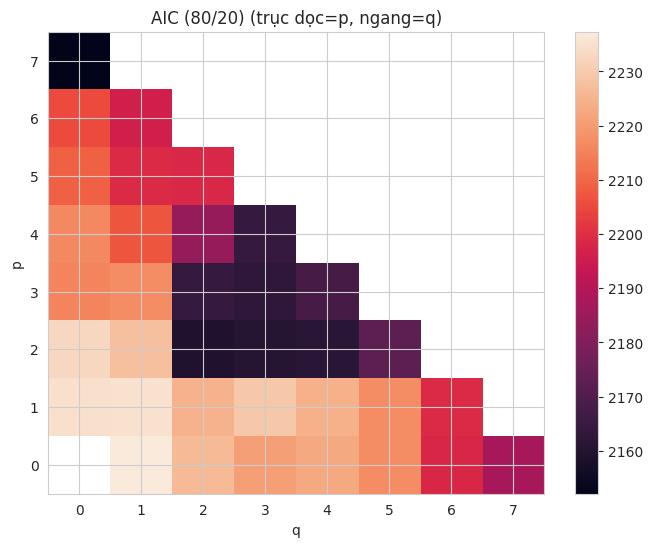

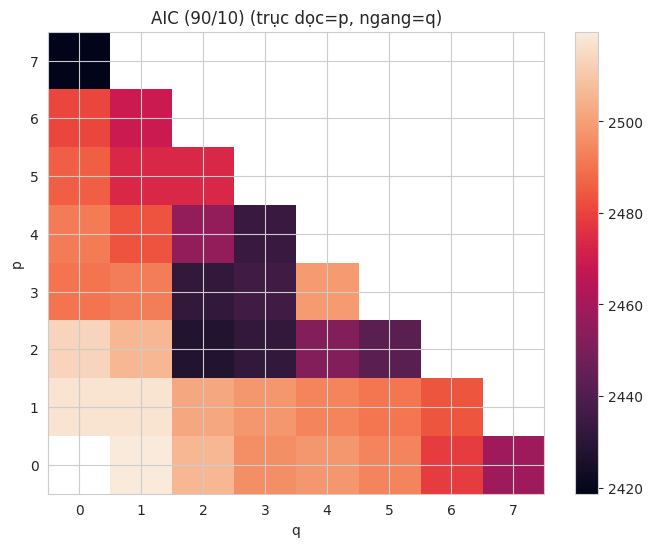

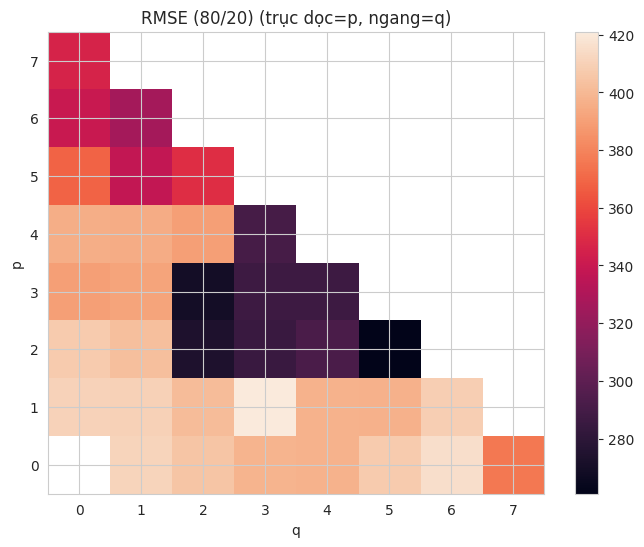

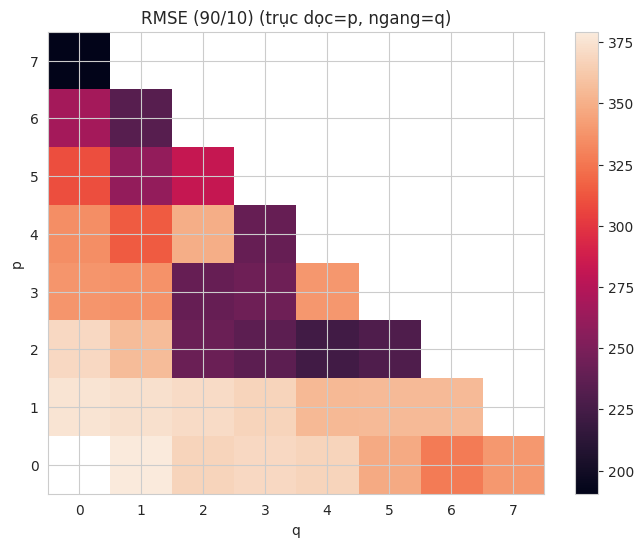

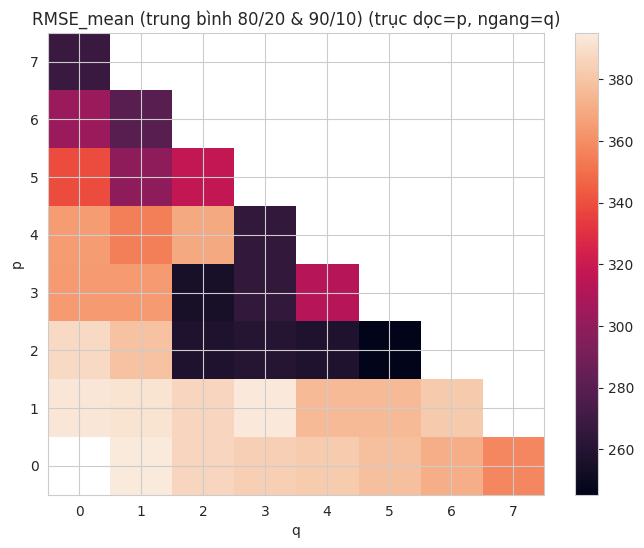

In [179]:
# Pivot về ma trận để vẽ heatmap (p là trục dọc, q trục ngang)
def plot_heatmap(metric_col, title):
    mat = arma_df.pivot_table(index='p', columns='q', values=metric_col)
    plt.figure(figsize=(8,6))
    im = plt.imshow(mat, aspect='auto', origin='lower')
    plt.colorbar(im)
    plt.title(f'{title} (trục dọc=p, ngang=q)')
    plt.xlabel('q'); plt.ylabel('p')
    # Optional: đánh số vài điểm tốt nhất
    plt.show()

plot_heatmap('AIC_80/20', 'AIC (80/20)')
plot_heatmap('AIC_90/10', 'AIC (90/10)')
plot_heatmap('RMSE_80/20', 'RMSE (80/20)')
plot_heatmap('RMSE_90/10', 'RMSE (90/10)')
plot_heatmap('RMSE_mean', 'RMSE_mean (trung bình 80/20 & 90/10)')


Top 3 ARMA(p,q) theo RMSE_mean:
    p  q  AIC_80/20  RMSE_80/20  AIC_90/10  RMSE_90/10  RMSE_mean
19  2  5  2172.9459    260.8558  2442.3204    229.7116   245.2837
22  3  2  2164.5156    269.4941  2432.2033    240.1079   254.8010
18  2  4  2161.5730    292.6239  2451.8658    223.1349   257.8794
16  2  2  2159.6285    273.4869  2427.8124    242.3608   257.9238
17  2  3  2161.0531    285.7226  2432.3409    235.4917   260.6071
28  4  3  2164.6748    290.3973  2434.0564    240.2872   265.3422
23  3  3  2162.9661    286.6291  2435.9261    244.0786   265.3539
34  7  0  2152.0861    346.5754  2418.6428    190.5134   268.5444
33  6  1  2196.4819    326.1967  2469.1536    233.3982   279.7975
30  5  1  2199.1869    337.4395  2473.6495    260.2333   298.8364


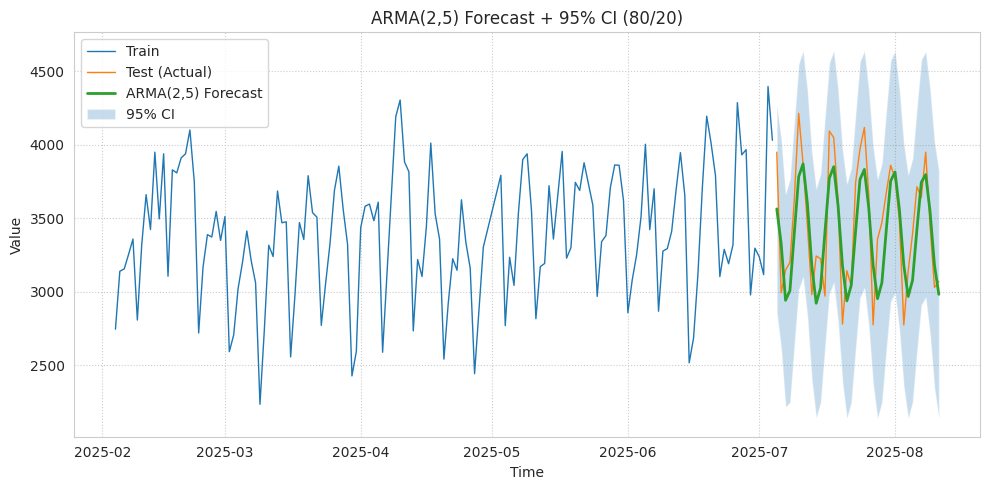

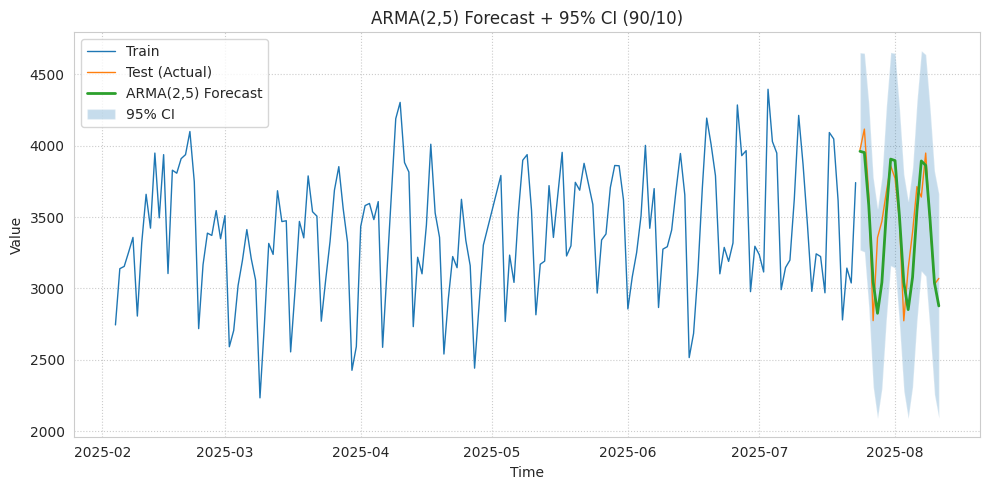

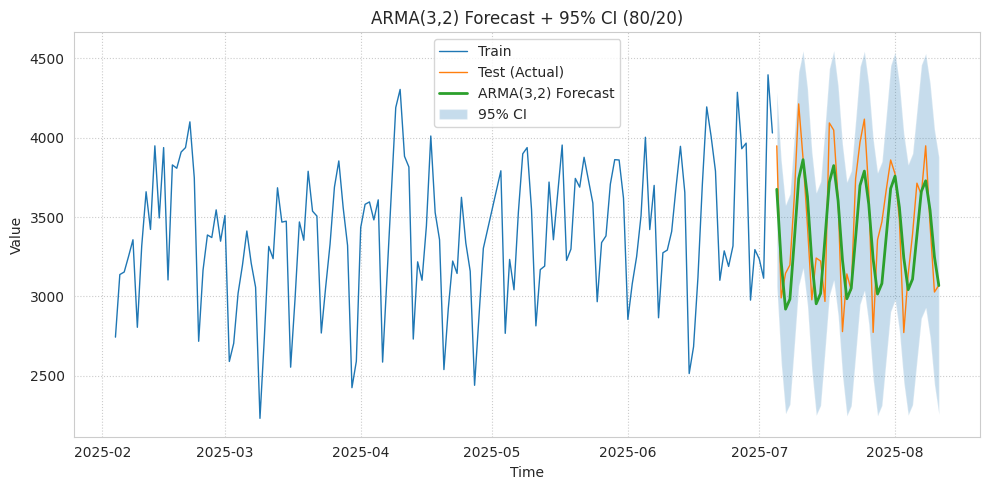

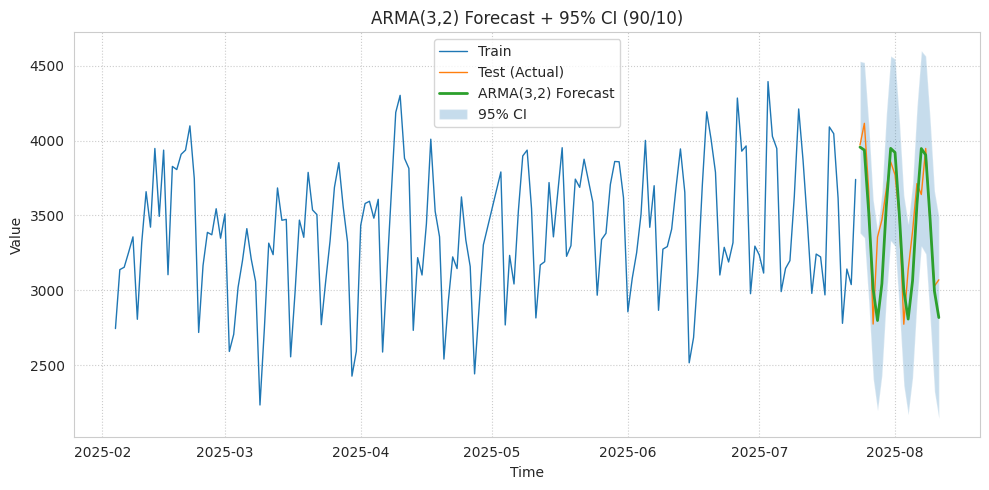

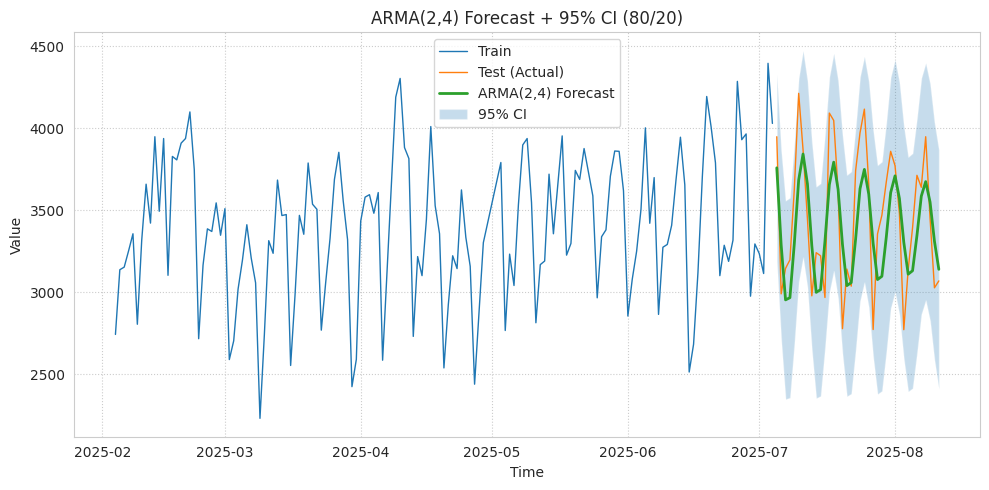

...

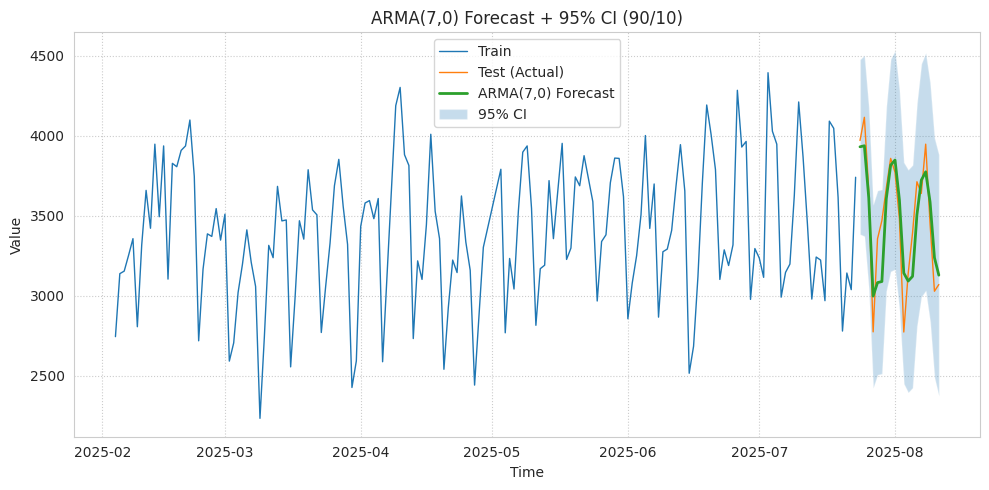

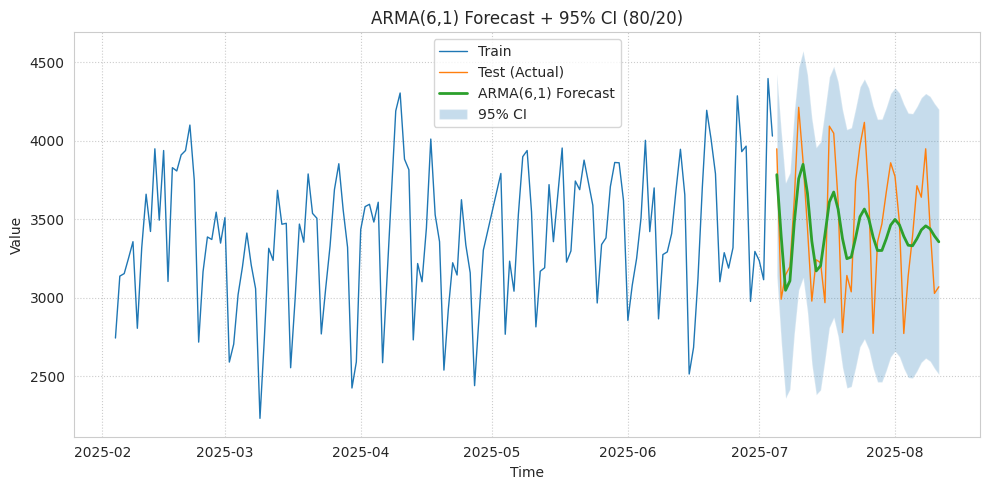

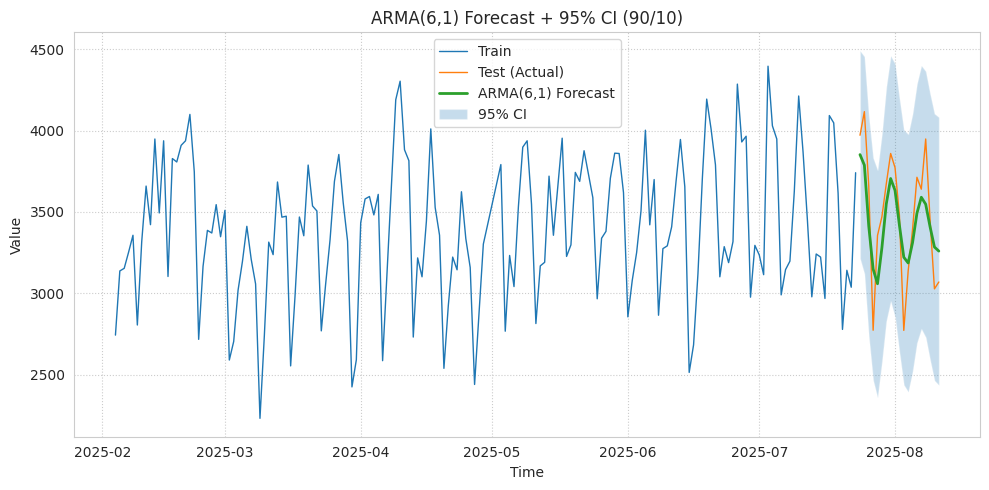

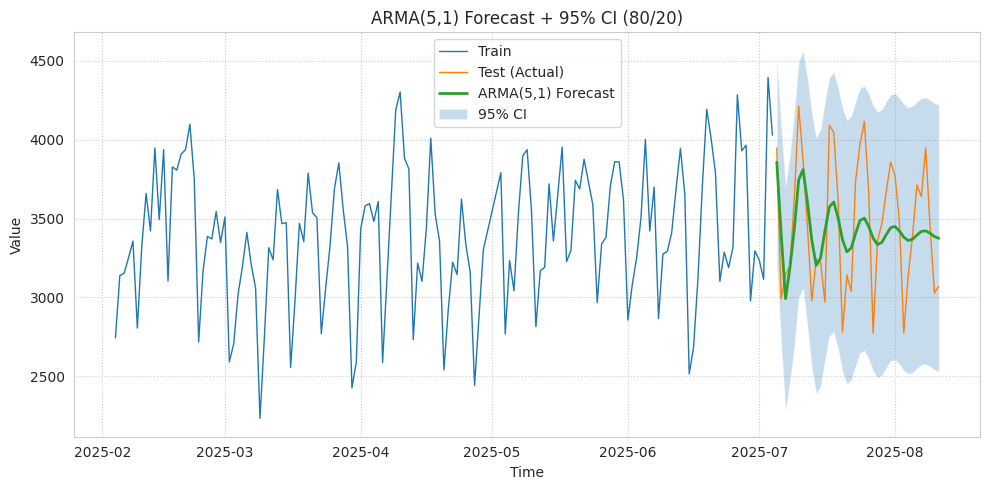

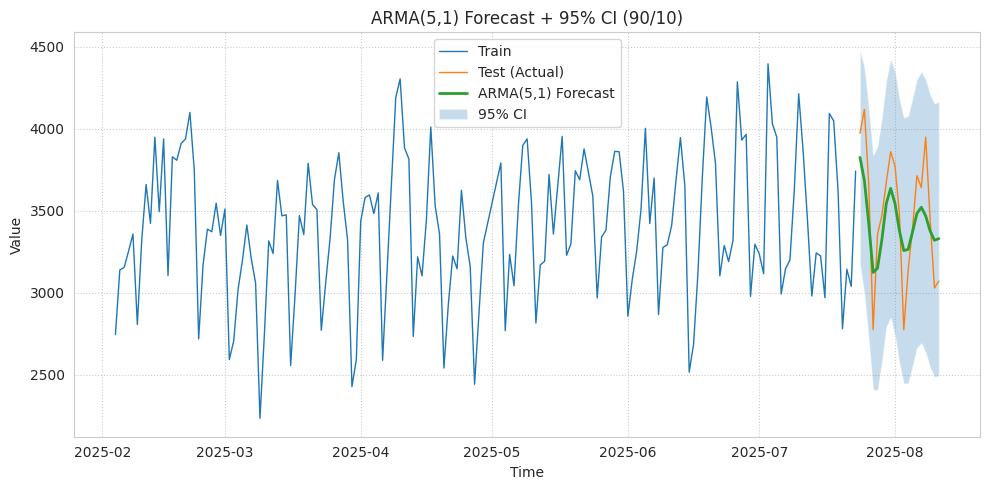

In [180]:
top3 = arma_df.sort_values('RMSE_mean').head(10)
print("\nTop 3 ARMA(p,q) theo RMSE_mean:")
print(top3[['p','q','AIC_80/20','RMSE_80/20','AIC_90/10','RMSE_90/10','RMSE_mean']].round(4))

for _, row in top3.iterrows():
    p, q = int(row['p']), int(row['q'])

    # ====== 80/20 ======
    res80 = ARIMA(train_80, order=(p,0,q)).fit()
    fc80 = res80.get_forecast(steps=len(test_20))
    pred80 = fc80.predicted_mean
    ci80 = fc80.conf_int(alpha=0.05)  # 95% CI
    pred80.index = test_20.index
    ci80.index = test_20.index
    lo80 = ci80.iloc[:,0]; hi80 = ci80.iloc[:,1]

    plt.figure(figsize=(10,5))
    plt.plot(train_80.index, train_80, label='Train', linewidth=1)
    plt.plot(test_20.index, test_20, label='Test (Actual)', linewidth=1)
    plt.plot(test_20.index, pred80, label=f'ARMA({p},{q}) Forecast', linewidth=2)
    plt.fill_between(test_20.index, lo80, hi80, alpha=0.25, label='95% CI')
    plt.title(f'ARMA({p},{q}) Forecast + 95% CI (80/20)')
    plt.xlabel('Time'); plt.ylabel('Value'); plt.grid(True, linestyle=':')
    plt.legend(); plt.tight_layout(); plt.show()

    # ====== 90/10 ======
    res90 = ARIMA(train_90, order=(p,0,q)).fit()
    fc90 = res90.get_forecast(steps=len(test_10))
    pred90 = fc90.predicted_mean
    ci90 = fc90.conf_int(alpha=0.05)
    pred90.index = test_10.index
    ci90.index = test_10.index
    lo90 = ci90.iloc[:,0]; hi90 = ci90.iloc[:,1]

    plt.figure(figsize=(10,5))
    plt.plot(train_90.index, train_90, label='Train', linewidth=1)
    plt.plot(test_10.index, test_10, label='Test (Actual)', linewidth=1)
    plt.plot(test_10.index, pred90, label=f'ARMA({p},{q}) Forecast', linewidth=2)
    plt.fill_between(test_10.index, lo90, hi90, alpha=0.25, label='95% CI')
    plt.title(f'ARMA({p},{q}) Forecast + 95% CI (90/10)')
    plt.xlabel('Time'); plt.ylabel('Value'); plt.grid(True, linestyle=':')
    plt.legend(); plt.tight_layout(); plt.show()

# ARIMA Model

When the series is non-stationary, the ARIMA(p,d,q) model is appropriate. The parameter `d` represents the number of differences required to achieve stationarity. You can try several configurations and choose the model with the lowest RMSE.

In [ ]:
# =========================
# 1) Grid search ARIMA(p,d,q)
#    d in {0,1}, p,q = 0..10 (bỏ p=q=0 để tránh mô hình tầm thường)
# =========================
results = []
P_MAX = 7
Q_MAX = 7
d_candidates = [1]

for d in d_candidates:
    for p in range(P_MAX + 1):
        for q in range(Q_MAX + 1):
            if p == 0 and q == 0:
                continue
            try:
                # ---- 80/20 ----
                mdl80 = ARIMA(train_80, order=(p, d, q))
                res80 = mdl80.fit()
                aic80 = res80.aic
                fc80 = res80.get_forecast(steps=len(test_20))
                pred80 = fc80.predicted_mean
                rmse80 = evaluate_rmse(np.asarray(test_20), np.asarray(pred80))

                # ---- 90/10 ----
                mdl90 = ARIMA(train_90, order=(p, d, q))
                res90 = mdl90.fit()
                aic90 = res90.aic
                fc90 = res90.get_forecast(steps=len(test_10))
                pred90 = fc90.predicted_mean
                rmse90 = evaluate_rmse(np.asarray(test_10), np.asarray(pred90))

                results.append({
                    'p': p, 'd': d, 'q': q,
                    'AIC_80/20': aic80, 'RMSE_80/20': rmse80,
                    'AIC_90/10': aic90, 'RMSE_90/10': rmse90
                })
                print(f"ARIMA({p},{d},{q})  AIC(80/20)={aic80:.3f}  RMSE(80/20)={rmse80:.3f} | "
                      f"AIC(90/10)={aic90:.3f}  RMSE(90/10)={rmse90:.3f}")
            except Exception as e:
                print(f"Skip ARIMA({p},{d},{q}): {e}")

arima_df = pd.DataFrame(results)
arima_df['RMSE_mean'] = arima_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)

print("\nBảng kết quả (mẫu 10 dòng):")
print(arima_df.head(10).round(4))

ARIMA(0,1,1)  AIC(80/20)=2391.406  RMSE(80/20)=404.626 | AIC(90/10)=2541.962  RMSE(90/10)=381.835
ARIMA(0,1,2)  AIC(80/20)=2362.828  RMSE(80/20)=400.745 | AIC(90/10)=2512.293  RMSE(90/10)=372.570
ARIMA(0,1,3)  AIC(80/20)=2348.156  RMSE(80/20)=406.522 | AIC(90/10)=2498.164  RMSE(90/10)=367.985
ARIMA(0,1,4)  AIC(80/20)=2341.647  RMSE(80/20)=408.314 | AIC(90/10)=2489.368  RMSE(90/10)=361.715
ARIMA(0,1,5)  AIC(80/20)=2343.353  RMSE(80/20)=417.931 | AIC(90/10)=2492.314  RMSE(90/10)=369.629
ARIMA(0,1,6)  AIC(80/20)=2336.635  RMSE(80/20)=389.020 | AIC(90/10)=2485.947  RMSE(90/10)=340.873
ARIMA(0,1,7)  AIC(80/20)=2319.567  RMSE(80/20)=437.465 | AIC(90/10)=2473.358  RMSE(90/10)=362.832
ARIMA(1,1,0)  AIC(80/20)=2399.750  RMSE(80/20)=579.110 | AIC(90/10)=2554.219  RMSE(90/10)=414.312
ARIMA(1,1,1)  AIC(80/20)=2359.839  RMSE(80/20)=406.525 | AIC(90/10)=2509.892  RMSE(90/10)=375.739
ARIMA(1,1,2)  AIC(80/20)=2359.785  RMSE(80/20)=400.815 | AIC(90/10)=2509.592  RMSE(90/10)=369.105
ARIMA(1,1,3)  AIC(80

KeyboardInterrupt: 

In [181]:
# =========================================================
# Helper: RMSE
# =========================================================
def evaluate_rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

# =========================
# 1) Grid search ARIMA(p,d,q)
#    d in {0,1}, p,q = 0..5
#    - Bỏ mô hình tầm thường p=q=0
#    - Thêm ràng buộc p + d + q <= 7
# =========================
results = []
P_MAX = 7
Q_MAX = 7
d_candidates = [1]

for d in d_candidates:
    for p in range(P_MAX + 1):
        for q in range(Q_MAX + 1):
            # Bỏ mô hình tầm thường & ràng buộc p + d + q <= 7
            if (p == 0 and q == 0) or (p + d + q > 7):
                continue
            try:
                # ---- 80/20 ----
                mdl80 = ARIMA(train_80, order=(p, d, q))
                res80 = mdl80.fit()
                aic80 = res80.aic

                fc80 = res80.get_forecast(steps=len(test_20))
                pred80 = fc80.predicted_mean
                rmse80 = evaluate_rmse(np.asarray(test_20), np.asarray(pred80))

                # ---- 90/10 ----
                mdl90 = ARIMA(train_90, order=(p, d, q))
                res90 = mdl90.fit()
                aic90 = res90.aic

                fc90 = res90.get_forecast(steps=len(test_10))
                pred90 = fc90.predicted_mean
                rmse90 = evaluate_rmse(np.asarray(test_10), np.asarray(pred90))

                results.append({
                    'p': p, 'd': d, 'q': q,
                    'AIC_80/20': aic80, 'RMSE_80/20': rmse80,
                    'AIC_90/10': aic90, 'RMSE_90/10': rmse90
                })

                print(f"ARIMA({p},{d},{q})  AIC(80/20)={aic80:.3f}  RMSE(80/20)={rmse80:.3f} | "
                      f"AIC(90/10)={aic90:.3f}  RMSE(90/10)={rmse90:.3f}")

            except Exception as e:
                print(f"Skip ARIMA({p},{d},{q}): {e}")

# =========================
# 2) Tổng hợp & xếp hạng
# =========================
arima_df = pd.DataFrame(results)
if not arima_df.empty:
    arima_df['RMSE_mean'] = arima_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)
    # Sắp xếp ưu tiên RMSE_mean (nhỏ hơn tốt hơn), rồi đến AIC_80/20
    arima_df = arima_df.sort_values(by=['RMSE_mean', 'AIC_80/20'], ascending=[True, True]).reset_index(drop=True)

    print("\nTop 10 mô hình tốt nhất theo RMSE_mean (tie-break AIC_80/20):")
    print(arima_df.head(10).round(4))
else:
    print("\nKhông có mô hình hợp lệ nào sau khi áp ràng buộc p + d + q <= 7.")

ARIMA(0,1,1)  AIC(80/20)=2256.699  RMSE(80/20)=410.060 | AIC(90/10)=2541.962  RMSE(90/10)=381.835
ARIMA(0,1,2)  AIC(80/20)=2229.720  RMSE(80/20)=405.918 | AIC(90/10)=2512.293  RMSE(90/10)=372.570
ARIMA(0,1,3)  AIC(80/20)=2218.603  RMSE(80/20)=405.691 | AIC(90/10)=2498.164  RMSE(90/10)=367.985
ARIMA(0,1,4)  AIC(80/20)=2214.548  RMSE(80/20)=398.859 | AIC(90/10)=2489.368  RMSE(90/10)=361.715
ARIMA(0,1,5)  AIC(80/20)=2216.563  RMSE(80/20)=414.353 | AIC(90/10)=2492.314  RMSE(90/10)=369.629
ARIMA(0,1,6)  AIC(80/20)=2209.233  RMSE(80/20)=402.942 | AIC(90/10)=2485.947  RMSE(90/10)=340.873
ARIMA(1,1,0)  AIC(80/20)=2262.620  RMSE(80/20)=740.372 | AIC(90/10)=2554.219  RMSE(90/10)=414.312
ARIMA(1,1,1)  AIC(80/20)=2226.968  RMSE(80/20)=411.717 | AIC(90/10)=2509.892  RMSE(90/10)=375.739
ARIMA(1,1,2)  AIC(80/20)=2227.218  RMSE(80/20)=405.683 | AIC(90/10)=2509.592  RMSE(90/10)=369.105
ARIMA(1,1,3)  AIC(80/20)=2217.161  RMSE(80/20)=397.217 | AIC(90/10)=2494.521  RMSE(90/10)=367.189
ARIMA(1,1,4)  AIC(80

In [ ]:
# =========================================================
# ARIMA(p,1,q) grid search + lọc theo stationarity/invertibility (ngưỡng nới: tol=1e-8)
# =========================================================
import numpy as np
import pandas as pd
import warnings
from statsmodels.tsa.arima.model import ARIMA

warnings.filterwarnings("ignore")

# -------------------------
# Config
# -------------------------
P_MAX = 6
Q_MAX = 6
d = 1
MAX_COMPLEXITY = 7        # ràng buộc p + d + q <= 7
TOL = 1e-8                # ngưỡng nới: |z| > 1 + TOL

# -------------------------
# Helper: RMSE
# -------------------------
def evaluate_rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_true - y_pred) ** 2)))

# -------------------------
# Helper: kiểm định nghiệm AR/MA (ARMA phần sai phân)
#  - AR poly: 1 - φ1 z - φ2 z^2 - ...   → mọi |root| > 1 + tol
#  - MA poly: 1 + θ1 z + θ2 z^2 + ...   → mọi |root| > 1 + tol
# -------------------------
def _arma_roots_check(res, tol=TOL):
    ar = np.atleast_1d(getattr(res, "arparams", np.array([])))
    ma = np.atleast_1d(getattr(res, "maparams", np.array([])))

    if ar.size == 0:
        ar_ok, ar_min = True, float("inf")
    else:
        ar_poly = np.r_[1.0, -ar]
        ar_roots = np.roots(ar_poly)
        ar_mod   = np.abs(ar_roots)
        ar_min   = float(ar_mod.min())
        ar_ok    = bool(np.all(ar_mod > 1.0 + tol))

    if ma.size == 0:
        ma_ok, ma_min = True, float("inf")
    else:
        ma_poly = np.r_[1.0, +ma]
        ma_roots = np.roots(ma_poly)
        ma_mod   = np.abs(ma_roots)
        ma_min   = float(ma_mod.min())
        ma_ok    = bool(np.all(ma_mod > 1.0 + tol))

    return ar_ok, ma_ok, ar_min, ma_min

# -------------------------
# Grid search
# -------------------------
results = []

for p in range(P_MAX + 1):
    for q in range(Q_MAX + 1):
        # bỏ mô hình tầm thường & ràng buộc độ phức tạp
        if (p == 0 and q == 0) or (p + d + q > MAX_COMPLEXITY):
            continue
        try:
            # ---- split 80/20 ----
            res80 = ARIMA(
                train_80, order=(p, d, q),
                enforce_stationarity=False,    # fit tự do rồi tự kiểm nghiệm
                enforce_invertibility=False
            ).fit()

            ar_ok80, ma_ok80, ar_min80, ma_min80 = _arma_roots_check(res80, tol=TOL)
            if not (ar_ok80 and ma_ok80):
                # vi phạm điều kiện gốc trên ARMA → loại
                continue

            aic80  = float(res80.aic)
            pred80 = res80.get_forecast(steps=len(test_20)).predicted_mean
            rmse80 = evaluate_rmse(test_20, pred80)

            # ---- split 90/10 ----
            res90 = ARIMA(
                train_90, order=(p, d, q),
                enforce_stationarity=False,
                enforce_invertibility=False
            ).fit()

            ar_ok90, ma_ok90, ar_min90, ma_min90 = _arma_roots_check(res90, tol=TOL)
            if not (ar_ok90 and ma_ok90):
                continue

            aic90  = float(res90.aic)
            pred90 = res90.get_forecast(steps=len(test_10)).predicted_mean
            rmse90 = evaluate_rmse(test_10, pred90)

            results.append({
                'p': p, 'd': d, 'q': q,
                'AIC_80/20': aic80, 'RMSE_80/20': rmse80,
                'AIC_90/10': aic90, 'RMSE_90/10': rmse90,
                'min|root|_AR_80': ar_min80, 'min|root|_MA_80': ma_min80,
                'min|root|_AR_90': ar_min90, 'min|root|_MA_90': ma_min90,
            })

            print(f"✓ ARIMA({p},{d},{q})  AIC(80/20)={aic80:.3f}  RMSE(80/20)={rmse80:.3f} | "
                  f"AIC(90/10)={aic90:.3f}  RMSE(90/10)={rmse90:.3f}")

        except Exception as e:
            print(f"Skip ARIMA({p},{d},{q}): {e}")

# -------------------------
# Tổng hợp & xếp hạng
# -------------------------
arima_df = pd.DataFrame(results)
if not arima_df.empty:
    arima_df['RMSE_mean'] = arima_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)
    arima_df = (arima_df
                .sort_values(by=['RMSE_mean', 'AIC_80/20'], ascending=[True, True])
                .reset_index(drop=True))

    print("\nTop 10 mô hình (đã lọc theo stationarity & invertibility với tol=1e-8):")
    print(arima_df.head(10).round(4))
else:
    print("\nKhông còn mô hình hợp lệ sau khi lọc (tol=1e-8). "
          "Hãy thử: giảm q tối đa, đổi d (0/2), thêm mùa vụ, hoặc bật enforce_* = True.")

KeyboardInterrupt: 

# Compare the results

Summarize the RMSE of the models on the two scenarios for comparison. The model with the smallest RMSE is the best model in this context.

In [182]:
rows = []

# ===== 1) Baseline: Naive =====
rows.append({
    'Family': 'Naive',
    'Model':  'Naive',
    'Order':  None,
    'AIC_80/20': np.nan,
    'RMSE_80/20': rmse_naive_80,
    'AIC_90/10': np.nan,
    'RMSE_90/10': rmse_naive_90
})

# ===== 2) AR(p) từ aic_results =====
# aic_results[p] = {'AIC_80/20':..., 'AIC_90/10':..., 'RMSE_80/20':..., 'RMSE_90/10':...}
if 'aic_results' in globals():
    for p, m in aic_results.items():
        rows.append({
            'Family': 'AR',
            'Model':  f'AR({p})',
            'Order':  (p, 0, 0),
            'AIC_80/20': m.get('AIC_80/20', np.nan),
            'RMSE_80/20': m.get('RMSE_80/20', np.nan),
            'AIC_90/10': m.get('AIC_90/10', np.nan),
            'RMSE_90/10': m.get('RMSE_90/10', np.nan),
        })

# ===== 3) MA(q) từ ma_df (index = q) =====
# ma_df có các cột: AIC_80/20, RMSE_80/20, AIC_90/10, RMSE_90/10
if 'ma_df' in globals():
    for q, row in ma_df[['AIC_80/20','RMSE_80/20','AIC_90/10','RMSE_90/10']].iterrows():
        rows.append({
            'Family': 'MA',
            'Model':  f'MA({int(q)})',
            'Order':  (0, 0, int(q)),
            'AIC_80/20': row['AIC_80/20'],
            'RMSE_80/20': row['RMSE_80/20'],
            'AIC_90/10': row['AIC_90/10'],
            'RMSE_90/10': row['RMSE_90/10'],
        })

# ===== 4) ARMA(p,q) từ arma_df =====
# arma_df có cột 'p','q' và các KPI tương tự
if 'arma_df' in globals():
    for _, row in arma_df.iterrows():
        rows.append({
            'Family': 'ARMA',
            'Model':  f"ARMA({int(row['p'])},{int(row['q'])})",
            'Order':  (int(row['p']), 0, int(row['q'])),
            'AIC_80/20': row['AIC_80/20'],
            'RMSE_80/20': row['RMSE_80/20'],
            'AIC_90/10': row['AIC_90/10'],
            'RMSE_90/10': row['RMSE_90/10'],
        })

# ===== 5) ARIMA(p,d,q) từ arima_df =====
# arima_df có cột 'p','d','q'
if 'arima_df' in globals():
    for _, row in arima_df.iterrows():
        rows.append({
            'Family': 'ARIMA',
            'Model':  f"ARIMA({int(row['p'])},{int(row['d'])},{int(row['q'])})",
            'Order':  (int(row['p']), int(row['d']), int(row['q'])),
            'AIC_80/20': row['AIC_80/20'],
            'RMSE_80/20': row['RMSE_80/20'],
            'AIC_90/10': row['AIC_90/10'],
            'RMSE_90/10': row['RMSE_90/10'],
        })

# ===== 6) Tổng hợp & chọn Top-5 =====
all_models_df = pd.DataFrame(rows)
all_models_df['RMSE_mean'] = all_models_df[['RMSE_80/20','RMSE_90/10']].mean(axis=1)

# Sắp xếp theo RMSE_mean tăng dần
all_models_df_sorted = all_models_df.sort_values('RMSE_mean').reset_index(drop=True)

# Top-5 tốt nhất
top5 = all_models_df_sorted.head(10).copy()

# Làm đẹp số
display_cols = ['Family','Model','AIC_80/20','RMSE_80/20','AIC_90/10','RMSE_90/10','RMSE_mean']
print("\nTOP 5 mô hình tốt nhất (theo RMSE_mean):")
print(top5[display_cols].round(4))

# (tuỳ chọn) Lưu ra CSV để báo cáo
# top5[display_cols].round(4).to_csv('top5_models.csv', index=False)
# all_models_df_sorted[display_cols].round(4).to_csv('all_models_ranked.csv', index=False)


TOP 5 mô hình tốt nhất (theo RMSE_mean):
  Family         Model  AIC_80/20  RMSE_80/20  AIC_90/10  RMSE_90/10  \
0   ARMA     ARMA(2,5)  2172.9459    260.8558  2442.3204    229.7116   
1   ARMA     ARMA(3,2)  2164.5156    269.4941  2432.2033    240.1079   
2   ARMA     ARMA(2,4)  2161.5730    292.6239  2451.8658    223.1349   
3   ARMA     ARMA(2,2)  2159.6285    273.4869  2427.8124    242.3608   
4   ARMA     ARMA(2,3)  2161.0531    285.7226  2432.3409    235.4917   
5  ARIMA  ARIMA(3,1,3)  2171.1366    294.1712  2440.4321    232.2314   
6   ARMA     ARMA(4,3)  2164.6748    290.3973  2434.0564    240.2872   
7   ARMA     ARMA(3,3)  2162.9661    286.6291  2435.9261    244.0786   
8  ARIMA  ARIMA(3,1,2)  2165.3344    327.7253  2436.5778    203.2495   
9   ARMA     ARMA(7,0)  2152.0861    346.5754  2418.6428    190.5134   

   RMSE_mean  
0   245.2837  
1   254.8010  
2   257.8794  
3   257.9238  
4   260.6071  
5   263.2013  
6   265.3422  
7   265.3539  
8   265.4874  
9   268.5444  


In [183]:
# ==== Best overall theo RMSE_mean ====
best_overall = all_models_df_sorted.iloc[0]
best_model_name = best_overall['Model']
best_family = best_overall['Family']
best_order = best_overall['Order']   # ví dụ (p,d,q) cho ARIMA; (p,0,0) cho AR; (0,0,q) cho MA

print(f"Best overall (RMSE_mean): {best_model_name} | Family={best_family} | Order={best_order} "
      f"| RMSE_mean={best_overall['RMSE_mean']:.4f}")

# (Tuỳ chọn) Best riêng theo từng split
best_80 = all_models_df.loc[all_models_df['RMSE_80/20'].idxmin()]
best_90 = all_models_df.loc[all_models_df['RMSE_90/10'].idxmin()]

print(f"Best on 80/20: {best_80['Model']} | Family={best_80['Family']} | Order={best_80['Order']} "
      f"| RMSE_80/20={best_80['RMSE_80/20']:.4f}")

print(f"Best on 90/10: {best_90['Model']} | Family={best_90['Family']} | Order={best_90['Order']} "
      f"| RMSE_90/10={best_90['RMSE_90/10']:.4f}")

# (Nếu cần lấy p,d,q tiện dùng tiếp)
p_best = d_best = q_best = None
if isinstance(best_order, (tuple, list)) and len(best_order) == 3:
    p_best, d_best, q_best = best_order

Best overall (RMSE_mean): ARMA(2,5) | Family=ARMA | Order=(2, 0, 5) | RMSE_mean=245.2837
Best on 80/20: ARMA(2,5) | Family=ARMA | Order=(2, 0, 5) | RMSE_80/20=260.8558
Best on 90/10: ARMA(7,0) | Family=ARMA | Order=(7, 0, 0) | RMSE_90/10=190.5134


# Conclusion and suggestions

* Data must be carefully processed before modeling: check for missing data, outliers, ensure time format and stationarity.

* The **Naive** model provides a baseline for comparison; your RMSE should be lower than this model.

* Use the ACF/PACF plot to choose the appropriate p, q order; the sign of MA(q) is the ACF cut after lag q.

* Compare the RMSE of AR, MA, ARMA, ARIMA models; the model with the lowest RMSE on the test set is the model that should be selected.

ARMA(2,5) | Family=ARMA | Order=(2, 0, 5)
RMSE (80/20) của mô hình tốt nhất: 260.8558
RMSE (90/10) của mô hình tốt nhất: 229.7116


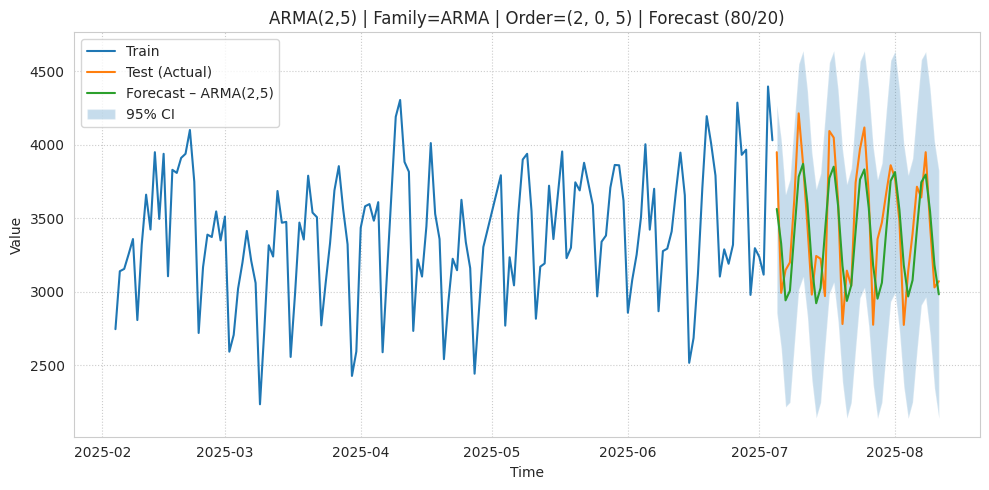

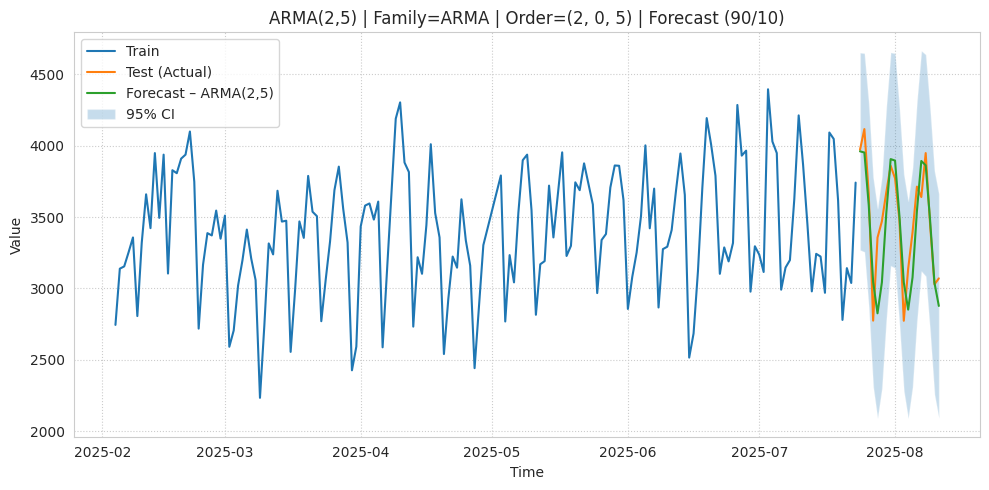

In [184]:
# ==== Lấy mô hình tốt nhất đã xếp hạng ở bước trước ====
best_overall   = all_models_df_sorted.iloc[0]
best_model_name = best_overall['Model']
best_family     = best_overall['Family']
best_order      = best_overall['Order']  # (p,d,q) hoặc None với Naive

best_model_str = f"{best_model_name} | Family={best_family} | Order={best_order}"
print(best_model_str)

# ==== Hàm fit & forecast cho từng họ mô hình ====
def fit_and_forecast(train, test, family, order):
    """
    Trả về:
        pred:     Series dự báo (index = test.index)
        ci_lower: Series CI dưới (hoặc None nếu không có)
        ci_upper: Series CI trên  (hoặc None nếu không có)
        rmse:     RMSE ngoài mẫu
    """
    # Naive
    if family == 'Naive' or order is None:
        last_val = train.iloc[-1]
        pred = pd.Series(np.repeat(last_val, len(test)), index=test.index)

        # CI 95% cho Naive dùng std của residuals y_t - y_{t-1}
        resid = (train - train.shift(1)).dropna()
        ci95  = 1.96 * resid.std() if len(resid) > 1 else 0.0
        ci_lower = pred - ci95
        ci_upper = pred + ci95

        rmse = evaluate_rmse(test, pred)
        return pred, ci_lower, ci_upper, rmse

    # AR / MA / ARMA / ARIMA đều dùng ARIMA(p,d,q)
    p,d,q = order
    res = ARIMA(train, order=(p, d, q)).fit()
    fc = res.get_forecast(steps=len(test))
    pred = fc.predicted_mean
    ci   = fc.conf_int(alpha=0.05)

    # Đồng bộ index dự báo với test
    pred.index = test.index
    ci.index   = test.index
    ci_lower = ci.iloc[:, 0]
    ci_upper = ci.iloc[:, 1]

    rmse = evaluate_rmse(test, pred)
    return pred, ci_lower, ci_upper, rmse

# ==== Forecast cho 80/20 ====
pred80_best, lo80_best, hi80_best, rmse80_best = fit_and_forecast(
    train_80, test_20, best_family, best_order
)
print(f"RMSE (80/20) của mô hình tốt nhất: {rmse80_best:.4f}")

# ==== Forecast cho 90/10 ====
pred90_best, lo90_best, hi90_best, rmse90_best = fit_and_forecast(
    train_90, test_10, best_family, best_order
)
print(f"RMSE (90/10) của mô hình tốt nhất: {rmse90_best:.4f}")

# ==== (Tuỳ chọn) Vẽ đồ thị forecast + CI cho 80/20 ====
plt.figure(figsize=(10,5))
plt.plot(train_80.index, train_80, label='Train')
plt.plot(test_20.index, test_20, label='Test (Actual)')
plt.plot(test_20.index, pred80_best, label=f'Forecast – {best_model_name}')
if lo80_best is not None and hi80_best is not None:
    plt.fill_between(test_20.index, lo80_best, hi80_best, alpha=0.25, label='95% CI')
plt.title(f'{best_model_str} | Forecast (80/20)')
plt.xlabel('Time'); plt.ylabel('Value'); plt.grid(True, linestyle=':')
plt.legend(); plt.tight_layout(); plt.show()

# ==== (Tuỳ chọn) Vẽ đồ thị forecast + CI cho 90/10 ====
plt.figure(figsize=(10,5))
plt.plot(train_90.index, train_90, label='Train')
plt.plot(test_10.index, test_10, label='Test (Actual)')
plt.plot(test_10.index, pred90_best, label=f'Forecast – {best_model_name}')
if lo90_best is not None and hi90_best is not None:
    plt.fill_between(test_10.index, lo90_best, hi90_best, alpha=0.25, label='95% CI')
plt.title(f'{best_model_str} | Forecast (90/10)')
plt.xlabel('Time'); plt.ylabel('Value'); plt.grid(True, linestyle=':')
plt.legend(); plt.tight_layout(); plt.show()

In [185]:
# ===== Bảng dự báo cho 80/20 =====
forecast_table_80 = pd.DataFrame({
    "Split": "80/20",
    "Time": test_20.index,
    "Actual": test_20.values,
    "Forecast": pred80_best.values,
    "Lower_95_CI": lo80_best.values if lo80_best is not None else np.nan,
    "Upper_95_CI": hi80_best.values if hi80_best is not None else np.nan
})

# ===== Bảng dự báo cho 90/10 =====
forecast_table_90 = pd.DataFrame({
    "Split": "90/10",
    "Time": test_10.index,
    "Actual": test_10.values,
    "Forecast": pred90_best.values,
    "Lower_95_CI": lo90_best.values if lo90_best is not None else np.nan,
    "Upper_95_CI": hi90_best.values if hi90_best is not None else np.nan
})

# ===== Gộp lại thành 1 bảng =====
forecast_table_all = pd.concat([forecast_table_80, forecast_table_90], ignore_index=True)

#forecast_table_all  # xem thử 15 dòng đầu

In [186]:
forecast_table_80

,Split,Time,Actual,Forecast,Lower_95_CI,Upper_95_CI
0,80/20,2025-07-05,3948.0,3562.032416,2856.428472,4267.636361
1,80/20,2025-07-06,2991.0,3326.123272,2612.427968,4039.818576
2,80/20,2025-07-07,3146.0,2940.149546,2215.342349,3664.956744
3,80/20,2025-07-08,3198.0,3005.478666,2246.118372,3764.838961
4,80/20,2025-07-09,3626.0,3397.003406,2635.112433,4158.894378
5,80/20,2025-07-10,4212.0,3780.991582,3013.228941,4548.754224
6,80/20,2025-07-11,3868.0,3868.523423,3098.734022,4638.312823
7,80/20,2025-07-12,3447.0,3596.848708,2826.662248,4367.035168
8,80/20,2025-07-13,2979.0,3174.227445,2399.274590,3949.180299
9,80/20,2025-07-14,3242.0,2920.328113,2141.083154,3699.573073


In [187]:
forecast_table_90

,Split,Time,Actual,Forecast,Lower_95_CI,Upper_95_CI
0,90/10,2025-07-24,3971.0,3960.278881,3268.823469,4651.734293
1,90/10,2025-07-25,4116.0,3951.829909,3255.618539,4648.041278
2,90/10,2025-07-26,3659.0,3581.974150,2866.529581,4297.418718
3,90/10,2025-07-27,2774.0,3044.893403,2310.796436,3778.990370
4,90/10,2025-07-28,3356.0,2825.340465,2089.930383,3560.750547
5,90/10,2025-07-29,3470.0,3042.385095,2299.578021,3785.192168
6,90/10,2025-07-30,3672.0,3525.829472,2778.172187,4273.486756
7,90/10,2025-07-31,3859.0,3905.723867,3158.072682,4653.375052
8,90/10,2025-08-01,3772.0,3895.412806,3143.243508,4647.582104
9,90/10,2025-08-02,3480.0,3507.768763,2748.650267,4266.887259


Best model: ARMA(2,5) | Family=ARMA | Order=(2, 0, 5)

Final forecast (head):
               forecast     lower_95     upper_95
2025-08-12  3224.647857  2535.895305  3913.400409
2025-08-13  3581.164929  2889.479595  4272.850264
2025-08-14  3816.675198  3116.305559  4517.044836
2025-08-15  3739.215602  3023.524682  4454.906521
2025-08-16  3423.740492  2705.909662  4141.571321
2025-08-17  3098.327802  2380.012337  3816.643267
2025-08-18  3006.326259  2287.671481  3724.981037
2025-08-19  3214.399185  2493.748373  3935.049997
2025-08-20  3564.289351  2842.249544  4286.329157
2025-08-21  3793.157154  3071.112857  4515.201452
2025-08-22  3731.009660  3007.791256  4454.228065
2025-08-23  3426.937128  2701.724552  4152.149704
2025-08-24  3110.434256  2384.755567  3836.112944
2025-08-25  3018.211878  2292.231641  3744.192116
2025-08-26  3217.180998  2489.356139  3945.005857
2025-08-27  3555.970197  2826.837149  4285.103245
2025-08-28  3780.056349  3050.917263  4509.195436
2025-08-29  3722.96382

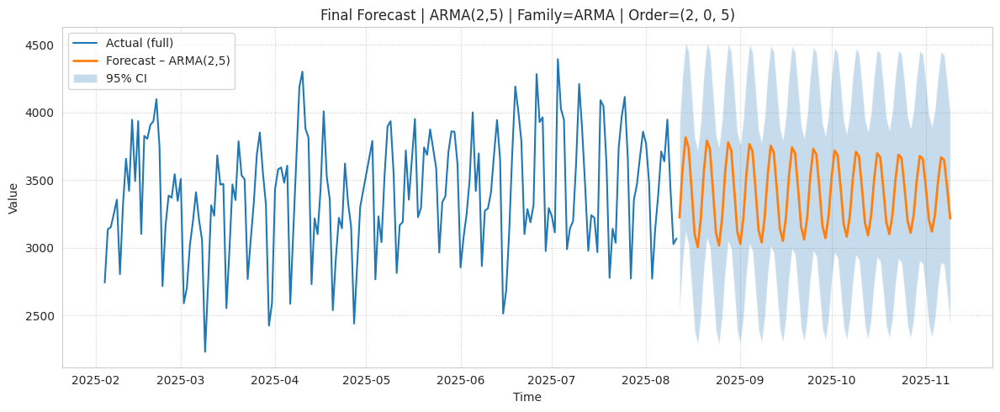

In [188]:
# ==== thông tin mô hình tốt nhất đã có từ trước ====
best_overall    = all_models_df_sorted.iloc[0]
best_model_name = best_overall['Model']
best_family     = best_overall['Family']
best_order      = best_overall['Order']  # (p,d,q) hoặc None (Naive)
best_model_str  = f"{best_model_name} | Family={best_family} | Order={best_order}"
print("Best model:", best_model_str)

# ==== tiện ích tạo index tương lai ====
def make_future_index(y: pd.Series, h: int) -> pd.Index:
    idx = y.index
    # thử infer tần suất
    try:
        freq = pd.infer_freq(idx)
    except Exception:
        freq = None
    if isinstance(idx, pd.DatetimeIndex):
        if freq is not None:
            return pd.date_range(start=idx[-1], periods=h+1, freq=freq)[1:]
        elif len(idx) >= 2:
            step = idx[-1] - idx[-2]
            return pd.date_range(start=idx[-1] + step, periods=h, freq=step)
        else:
            # mặc định ngày nếu không đủ điểm
            return pd.date_range(start=idx[-1] + pd.Timedelta(days=1), periods=h, freq='D')
    else:
        # chỉ số số nguyên / category → RangeIndex tiếp theo
        last = idx[-1] if hasattr(idx[-1], "__int__") else len(idx) - 1
        return pd.RangeIndex(start=int(last)+1, stop=int(last)+1+h)

# ==== hàm refit & forecast trên toàn bộ series ====
def forecast_best_on_full(y: pd.Series, family: str, order, h: int, alpha=0.05):
    future_idx = make_future_index(y, h)
    if family == 'Naive' or order is None:
        last_val = y.iloc[-1]
        pred = pd.Series(np.repeat(last_val, h), index=future_idx)
        # CI 95% theo std của sai số bước một trên full series
        resid = (y - y.shift(1)).dropna()
        ci = 1.96 * (resid.std() if len(resid) > 1 else 0.0)
        lo, hi = pred - ci, pred + ci
        return pred, lo, hi

    p, d, q = order
    res = ARIMA(y, order=(p, d, q)).fit()
    fc = res.get_forecast(steps=h)
    pred = fc.predicted_mean
    ci = fc.conf_int(alpha=alpha)
    pred.index = future_idx
    ci.index   = future_idx
    lo, hi = ci.iloc[:, 0], ci.iloc[:, 1]
    return pred, lo, hi

# ==== chạy forecast cuối cùng ====
y_full = df['Value'].dropna()
h = 90  # số bước dự báo tương lai (đổi tùy bạn)
final_pred, final_lo, final_hi = forecast_best_on_full(y_full, best_family, best_order, h=h, alpha=0.05)

# ==== bảng kết quả cuối cùng ====
final_forecast_df = pd.DataFrame({
    'forecast': final_pred,
    'lower_95': final_lo,
    'upper_95': final_hi
})
print("\nFinal forecast (head):")
print(final_forecast_df.head(30))

# (tuỳ chọn) lưu báo cáo
# final_forecast_df.to_csv('final_forecast_best_model.csv')

# ==== vẽ toàn bộ chuỗi + forecast + CI ====
plt.figure(figsize=(12,5))
plt.plot(y_full.index, y_full, label='Actual (full)', linewidth=1.5)
plt.plot(final_pred.index, final_pred, label=f'Forecast – {best_model_name}', linewidth=2)
plt.fill_between(final_pred.index, final_lo, final_hi, alpha=0.25, label='95% CI')
plt.title(f'Final Forecast | {best_model_str}')
plt.xlabel('Time'); plt.ylabel('Value'); plt.grid(True, linestyle=':')
plt.legend(); plt.tight_layout(); plt.show()

In [189]:
from IPython.display import display, Math

def pretty_arima_equation(res, order, ndigits=4, series_name="y"):
    p,d,q = order
    ar = list(getattr(res, "arparams", []))
    ma = list(getattr(res, "maparams", []))
    const = res.params[res.param_names.index("const")] if "const" in res.param_names else 0.0

    # AR poly
    Phi_terms = ["1"]
    for i,c in enumerate(ar, start=1):
        sign = "-" if c>=0 else "+"
        Phi_terms.append(f"{sign} {abs(c):.{ndigits}f} B^{i}")
    Phi_str = " ".join(Phi_terms)

    # MA poly
    Theta_terms = ["1"]
    for i,c in enumerate(ma, start=1):
        sign = "+" if c>=0 else "-"
        Theta_terms.append(f"{sign} {abs(c):.{ndigits}f} B^{i}")
    Theta_str = " ".join(Theta_terms)

    # In LaTeX
    display(Math(rf"\Phi(B) = {Phi_str}"))
    display(Math(rf"\Theta(B) = {Theta_str}"))

    diff = "" if d==0 else rf"(1-B)^{{{d}}}"
    const_tex = f"{const:.{ndigits}f} +" if abs(const)>1e-12 else ""

    display(Math(rf"\Phi(B)\,{diff}\,{series_name}_t = {const_tex}\Theta(B)\,\varepsilon_t"))

In [191]:
pretty_arima_equation(res_final, (7,0,3))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [190]:
# =========================
# ARIMA Scientific Report (Pretty equations like pretty_arima_equation)
# =========================
import numpy as np, pandas as pd
from IPython.display import display, HTML, Math
from statsmodels.tsa.arima.model import ARIMA

# ---- helpers ----
def _coef_poly_tex(coefs, sign='+', sym='B', nd=4):
    # AR: 1 - φ1 B - φ2 B^2 - ... ;  MA: 1 + θ1 B + θ2 B^2 + ...
    parts = ["1"]
    for i, c in enumerate(coefs, start=1):
        if abs(c) < 1e-12:
            continue
        sgn = '+' if ((sign == '+') == (c >= 0)) else '-'
        power = f"^{i}" if i > 1 else ""
        parts.append(rf"{sgn}\ {abs(c):.{nd}f}\ {sym}{power}")
    return " ".join(parts)

def _poly_roots_outside_unit(poly_coeffs):
    if len(poly_coeffs) <= 1:
        return [], True
    r = np.roots(poly_coeffs)
    mod = np.abs(r)
    ok = bool(np.all(mod > 1.0))
    return list(zip(r, mod)), ok

def _safe_attr(res, name, default=np.nan):
    try:
        return getattr(res, name)
    except Exception:
        return default

def arima_scientific_report_pretty(res, order, series_name="y", ndigits=4):
    p, d, q = order
    ar = list(_safe_attr(res, "arparams", np.array([])))
    ma = list(_safe_attr(res, "maparams", np.array([])))
    params  = res.params
    pnames  = res.param_names
    bse     = _safe_attr(res, "bse", np.full_like(params, np.nan))
    pvalues = _safe_attr(res, "pvalues", np.full_like(params, np.nan))
    aic     = _safe_attr(res, "aic");  bic = _safe_attr(res, "bic");  llf = _safe_attr(res, "llf")
    sigma2  = float(_safe_attr(res, "sigma2", np.nan))
    if not np.isfinite(sigma2) and hasattr(res, "scale"):
        sigma2 = float(res.scale)

    const = float(params[pnames.index("const")]) if "const" in pnames else 0.0

    # LaTeX strings (đẹp, gọn)
    Phi_tex   = _coef_poly_tex(ar, sign='-', sym='B', nd=ndigits) if p>0 else "1"
    Theta_tex = _coef_poly_tex(ma, sign='+', sym='B', nd=ndigits) if q>0 else "1"
    diff_tex  = "" if d==0 else rf"(1 - B)^{{{d}}}"
    const_tex = (rf"{const:.{ndigits}f} +" if abs(const) > 1e-12 else "")

    # Bảng tham số
    df_params = pd.DataFrame([
        {
            "Parameter": n,
            "Estimate": round(float(v), ndigits),
            "Std. Error": (round(float(se), ndigits) if np.isfinite(se) else np.nan),
            "p-Value": (round(float(pv), ndigits) if np.isfinite(pv) else np.nan),
        }
        for n, v, se, pv in zip(pnames, params, bse, pvalues)
    ])

    # Kiểm tra nghiệm
    ar_poly = [1.0] + [-c for c in ar] if p>0 else [1.0]
    ma_poly = [1.0] + [ c for c in ma] if q>0 else [1.0]
    ar_roots, ar_ok = _poly_roots_outside_unit(ar_poly)
    ma_roots, ma_ok = _poly_roots_outside_unit(ma_poly)

    # ---- Header + meta
    css = """
    <style>
      .rep{font-family:ui-sans-serif,system-ui,-apple-system,Segoe UI,Roboto}
      .h1{font-size:22px;font-weight:800;margin:6px 0 12px}
      .meta{display:flex;gap:16px;flex-wrap:wrap;margin:4px 0 12px}
      .badge{background:#111827;color:#fff;padding:4px 10px;border-radius:999px;font-size:12px;font-weight:700}
      .card{border:1px solid #e5e7eb;border-radius:12px;padding:12px 14px;margin:10px 0;box-shadow:0 1px 4px rgba(0,0,0,.04)}
      .grid{display:grid;grid-template-columns:repeat(auto-fit,minmax(260px,1fr));gap:10px}
      .ok{background:#ecfdf5;border-color:#a7f3d0}
      .fail{background:#fef2f2;border-color:#fecaca}
      table{width:100%;border-collapse:collapse;margin-top:6px}
      th,td{border:1px solid #e5e7eb;padding:6px 8px;text-align:left;font-size:13px}
      th{background:#f9fafb}
      .sub{font-weight:700;margin-top:4px}
    </style>
    """
    meta = f"""
    <div class="rep">
      <div class="h1">ARIMA({p},{d},{q}) • Scientific Summary</div>
      <div class="meta">
        <span class="badge">Order: ARIMA({p},{d},{q})</span>
        <span class="badge">AIC: {aic:.2f}</span>
        <span class="badge">BIC: {bic:.2f}</span>
        <span class="badge">logL: {llf:.2f}</span>
        <span class="badge">σ²: {sigma2:.{ndigits}g}</span>
      </div>
    </div>
    """
    display(HTML(css + meta))

    # ---- Equations (LaTeX đẹp như pretty_arima_equation)
    display(HTML('<div class="rep card"><div class="sub">Polynomials</div></div>'))
    display(Math(rf"\Phi(B) = {Phi_tex}"))
    display(Math(rf"\Theta(B) = {Theta_tex}"))

    display(HTML('<div class="rep card"><div class="sub">ARIMA equation</div></div>'))
    display(Math(rf"\Phi(B)\,{diff_tex}\,{series_name}_t \;=\; {const_tex}\Theta(B)\,\varepsilon_t"))

    # ---- Roots check
    stab_html = f"""
      <div class="rep grid">
        <div class="card {'ok' if ar_ok else 'fail'}">
          <b>Stationarity (AR roots |z|>1):</b>
          <div>{'PASS ✅' if ar_ok else 'FAIL ❌'}</div>
          <div style="margin-top:6px;font-size:12px"><i>Roots:</i><br>
            {"; ".join([f"{complex(z):.3g} (|z|={m:.3f})" for z,m in ar_roots]) or "—"}
          </div>
        </div>
        <div class="card {'ok' if ma_ok else 'fail'}">
          <b>Invertibility (MA roots |z|>1):</b>
          <div>{'PASS ✅' if ma_ok else 'FAIL ❌'}</div>
          <div style="margin-top:6px;font-size:12px"><i>Roots:</i><br>
            {"; ".join([f"{complex(z):.3g} (|z|={m:.3f})" for z,m in ma_roots]) or "—"}
          </div>
        </div>
      </div>
    """
    display(HTML(stab_html))

    # ---- Parameters table
    display(HTML('<div class="rep card"><b>Parameters</b></div>'))
    display(df_params)

# ===== dùng với model tốt nhất của bạn =====
if best_family != "Naive" and best_order is not None:
    p, d, q = best_order
    res_final = ARIMA(y_full, order=(p, d, q)).fit()
    arima_scientific_report_pretty(res_final, (p, d, q), series_name="y", ndigits=4)
else:
    display(HTML("""
    <div style="font-family:ui-sans-serif; background:#fef3c7; border:1px solid #fde68a;
         padding:10px 12px; border-radius:12px; font-weight:600;">
      Baseline Naive (Random Walk): $y_t = y_{t-1} + \\varepsilon_t \\quad\\Leftrightarrow\\quad (1-B) y_t = \\varepsilon_t$
    </div>
    """))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

,Parameter,Estimate,Std. Error,p-Value
0,const,3406.6292,48.0604,0.0000
1,ar.L1,1.2434,0.0199,0.0000
2,ar.L2,-0.9910,0.0167,0.0000
3,ma.L1,-1.1510,0.1180,0.0000
4,ma.L2,1.0357,0.1836,0.0000
5,ma.L3,0.1069,0.2213,0.6291
6,ma.L4,-0.1881,0.1797,0.2951
7,ma.L5,0.2736,0.1239,0.0273
8,sigma2,123489.5647,21090.7209,0.0000


In [ ]:
!uv pip install --upgrade --force-reinstall --no-cache-dir pmdarima

Using Python 3.12.11 environment at: /usr
Resolved 17 packages in 495ms
Prepared 17 packages in 5.16s
Uninstalled 16 packages in 651ms
Installed 17 packages in 184ms
 - cython==3.0.12
 + cython==3.1.3
 - joblib==1.5.1
 + joblib==1.5.2
 - numpy==2.0.2
 + numpy==2.3.2
 ~ packaging==25.0
 - pandas==2.2.2
 + pandas==2.3.2
 ~ patsy==1.0.1
 + pmdarima==2.0.4
 ~ python-dateutil==2.9.0.post0
 ~ pytz==2025.2
 - scikit-learn==1.6.1
 + scikit-learn==1.7.1
 ~ scipy==1.16.1
 - setuptools==75.2.0
 + setuptools==80.9.0
 ~ six==1.17.0
 ~ statsmodels==0.14.5
 ~ threadpoolctl==3.6.0
 ~ tzdata==2025.2
 ~ urllib3==2.5.0


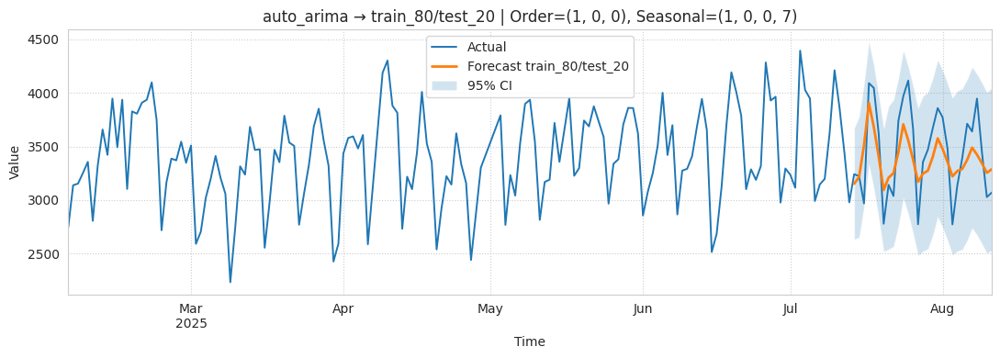

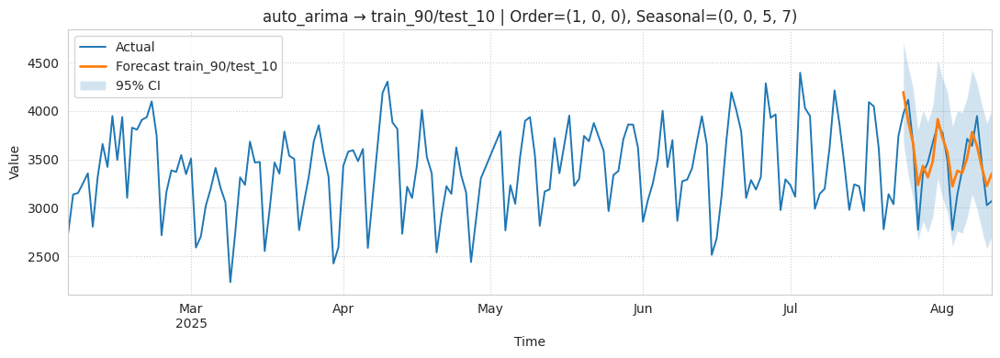

,Dataset,"Order (p,d,q)","Seasonal (P,D,Q,m)",Seasonal_used,m,AICc,AIC,BIC,RMSE,MAPE (%)
0,train_80/test_20,"(1, 0, 0)","(1, 0, 0, 7)",True,7,2254.24,2253.98,2266.28,289.127,7.37
1,train_90/test_10,"(1, 0, 0)","(0, 0, 5, 7)",True,7,2403.59,2402.70,2427.78,221.750,5.48


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [ ]:
# =========================
# Auto-ARIMA for two splits + fixed metrics + pretty equations
# =========================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import pmdarima as pm
from IPython.display import display, Math, HTML

# ---- metrics helpers
def rmse(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(np.asarray(y_true), np.asarray(y_pred))))

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.where(np.abs(y_true) < eps, eps, np.abs(y_true))
    return float(np.mean(np.abs((y_true - y_pred) / denom)) * 100)

# ---- infer seasonality
def infer_seasonal_period(index: pd.Index):
    if isinstance(index, pd.DatetimeIndex):
        freq = pd.infer_freq(index)
        if freq:
            f = freq.upper()
            if f.startswith("H"): return 24      # hourly
            if f.startswith("D"): return 7       # daily
            if f.startswith("W"): return 52      # weekly
            if f.startswith("M"): return 12      # monthly
            if f.startswith("Q"): return 4       # quarterly
            if f.startswith(("A","Y")): return 1 # yearly
        return 12
    return 1

# ---- safe getters for pmdarima (call if callable)
def _call_or_value(obj, name, default=np.nan):
    attr = getattr(obj, name, None)
    if attr is None: return default
    return float(attr()) if callable(attr) else float(attr)

def _tuple_or_value(obj, name):
    attr = getattr(obj, name, None)
    return attr() if callable(attr) else attr

# ---- main runner
def run_auto_arima_one(name, y_train: pd.Series, y_test: pd.Series, alpha=0.05):
    m = infer_seasonal_period(y_train.index)
    use_seasonal = (m is not None and m > 1)

    model = pm.auto_arima(
        y_train,
        start_p=0, start_q=0, max_p=5, max_q=5,
        start_P=0, start_Q=0, max_P=5, max_Q=5,
        d=None, D=None,
        seasonal=use_seasonal, m=m,
        information_criterion="aicc",
        stepwise=True, trace=False, n_fits=50,
        error_action="ignore", suppress_warnings=True
    )

    # forecast
    h = len(y_test)
    fc, conf = model.predict(n_periods=h, return_conf_int=True, alpha=alpha)
    if isinstance(y_train.index, pd.DatetimeIndex) and isinstance(y_test.index, pd.DatetimeIndex):
        fc_index = y_test.index
    else:
        fc_index = pd.RangeIndex(start=len(y_train), stop=len(y_train)+h)

    fc_series = pd.Series(fc, index=fc_index, name=f"{name}_forecast")
    lo = pd.Series(conf[:, 0], index=fc_index)
    hi = pd.Series(conf[:, 1], index=fc_index)

    # read orders & ICs correctly
    order_tuple = _tuple_or_value(model, "order")
    seas_tuple  = _tuple_or_value(model, "seasonal_order") if use_seasonal else None

    metrics = {
        "Dataset": name,
        "Order (p,d,q)": str(order_tuple),
        "Seasonal (P,D,Q,m)": str(seas_tuple) if use_seasonal else "None",
        "Seasonal_used": use_seasonal,
        "m": m,
        "AICc": _call_or_value(model, "aicc"),
        "AIC":  _call_or_value(model, "aic"),
        "BIC":  _call_or_value(model, "bic"),
        "RMSE": rmse(y_test, fc),
        "MAPE (%)": mape(y_test, fc),
    }

    # plot
    fig, ax = plt.subplots(figsize=(11,4))
    pd.concat([y_train, y_test]).plot(ax=ax, label="Actual", linewidth=1.4)
    fc_series.plot(ax=ax, label=f"Forecast {name}", linewidth=2)
    ax.fill_between(fc_index, lo, hi, alpha=0.2, label=f"{int((1-alpha)*100)}% CI")
    ax.set_title(f"auto_arima → {name} | Order={order_tuple}, Seasonal={seas_tuple if use_seasonal else 'None'}")
    ax.set_xlabel("Time"); ax.set_ylabel("Value"); ax.grid(True, ls=":")
    ax.legend(loc="best")
    plt.tight_layout(); plt.show()

    return metrics, model, fc_series, lo, hi

# ---- pretty equations
def pretty_equations_from_model(model, ndigits=4, series_name="y"):
    # get tuples safely
    p,d,q = _tuple_or_value(model, "order")
    if getattr(model, "seasonal", False):
        P,D,Q,m = _tuple_or_value(model, "seasonal_order")
    else:
        P,D,Q,m = (0,0,0,0)

    # ARMA non-seasonal coefs
    ar = np.array(model.arparams()) if p>0 else np.array([])
    ma = np.array(model.maparams()) if q>0 else np.array([])

    def poly_tex(coefs, sign, sym):
        parts = ["1"]
        for i, c in enumerate(coefs, start=1):
            sgn = '+' if ((sign == '+') == (c >= 0)) else '-'
            power = f"^{i}" if i > 1 else ""
            parts.append(rf"{sgn}\ {abs(c):.{ndigits}f}\ {sym}{power}")
        return " ".join(parts)

    Phi  = poly_tex(ar, sign='-', sym='B') if p>0 else "1"
    Theta= poly_tex(ma, sign='+', sym='B') if q>0 else "1"
    diff = "" if d==0 else rf"(1-B)^{{{d}}}"

    if getattr(model, "seasonal", False) and m>1:
        display(Math(rf"\text{{Seasonal period }} m={m},\quad (P,D,Q)={P,D,Q}"))
        display(Math(rf"\Phi(B) = {Phi}"))
        display(Math(rf"\Theta(B) = {Theta}"))
        display(Math(rf"\Phi(B)\,\Phi_S(B^{{{m}}})\,(1-B)^{{{d}}}(1-B^{{{m}}})^{{{D}}}\,{series_name}_t"
                 r"\;=\;\Theta(B)\,\Theta_S(B^{{{m}}})\,\varepsilon_t"))
        display(HTML("<div style='font-size:13px;color:#374151'>"
                     "Note: Seasonal polynomials \\(\\Phi_S,\\Theta_S\\) không bung hệ số."
                     "</div>"))
    else:
        display(Math(rf"\Phi(B) = {Phi}"))
        display(Math(rf"\Theta(B) = {Theta}"))
        display(Math(rf"\Phi(B)\,{diff}\,{series_name}_t \;=\; \Theta(B)\,\varepsilon_t"))

# ===== run for 80/20 & 90/10 =====
results = []
m80, model80, fc80, lo80, hi80 = run_auto_arima_one("train_80/test_20", train_80, test_20)
results.append(m80)
m90, model90, fc90, lo90, hi90 = run_auto_arima_one("train_90/test_10", train_90, test_10)
results.append(m90)

# summary table
results_df = pd.DataFrame(results)
display(results_df.style.format({
    "AICc": "{:.2f}", "AIC": "{:.2f}", "BIC": "{:.2f}",
    "RMSE": "{:.3f}", "MAPE (%)": "{:.2f}"
}).set_caption("Auto-ARIMA Summary (80/20 & 90/10)"))

# pretty equations (ví dụ cho 80/20)
pretty_equations_from_model(model80, ndigits=4, series_name="y")

Series: Value
ARIMA(1,0,1)(0,1,1)[7]

Coefficients:


,Estimate,Std. Error
ar1,0.8997,0.0445
ma1,-0.4876,0.0806
sma1,-0.7723,0.0519


sigma^2 = nan:  log likelihood = -1246.84
AIC=2501.69    AICc=2501.82    BIC=2514.50

Training set error measures:
         ME     RMSE      MAE       MPE      MAPE      MASE     ACF1
0  126.1313  600.419  278.164  3.621639  8.423849  1.125417  0.75412


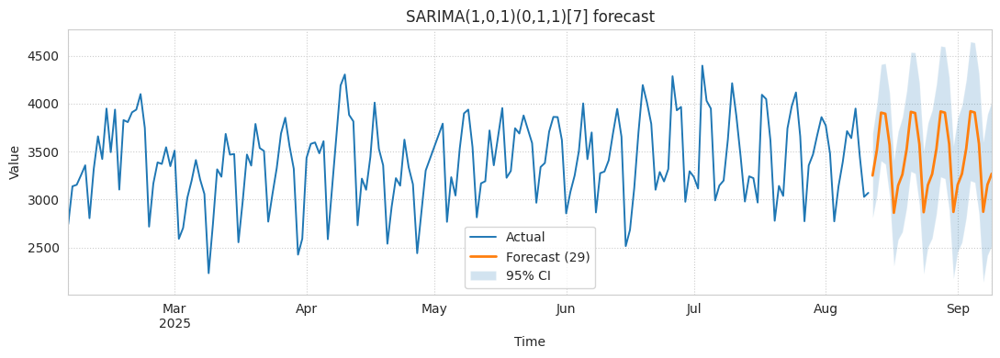

In [ ]:
# =========================
# SARIMA(1,0,1)(0,1,1)[7] – in hệ số kiểu R (robust tên tham số)
# =========================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import acf

# --- dữ liệu
y = df['Value'].astype(float).sort_index()
m = 7  # seasonal period

# --- fit mô hình
res = SARIMAX(
    y, order=(1,0,1), seasonal_order=(0,1,1,m),
    trend='n', enforce_stationarity=True, enforce_invertibility=True
).fit(disp=False)

# --- bảng hệ số & s.e. (đổi tên động)
params = res.params
bse    = res.bse
coef_tbl = pd.DataFrame({'Estimate': params, 'Std. Error': bse})

# xây map tên → nhãn “đẹp”
rename_map = {}
for n in res.param_names:
    if n.startswith('ar.L'):
        lag = int(n.split('L')[-1])
        rename_map[n] = f'ar{lag}'
    elif n.startswith('ma.L'):
        lag = int(n.split('L')[-1])
        rename_map[n] = f'ma{lag}'
    elif n.startswith('ar.S.'):        # seasonal AR
        idx = sum(v.startswith('sar') for v in rename_map.values()) + 1
        rename_map[n] = f'sar{idx}'
    elif n.startswith('ma.S.'):        # seasonal MA
        idx = sum(v.startswith('sma') for v in rename_map.values()) + 1
        rename_map[n] = f'sma{idx}'
    elif n in ('const', 'sigma2', 'trend'):
        rename_map[n] = n

coef_tbl_display = coef_tbl.rename(index=rename_map)
# chỉ lấy những nhãn tồn tại theo thứ tự ưa nhìn
order_show = [x for x in ['ar1','ma1','sar1','sma1','const'] if x in coef_tbl_display.index]
coef_tbl_display = coef_tbl_display.loc[order_show].round(4)

# --- thông tin tiêu chí
n = res.nobs
k_full = len([p for p in res.param_names if p not in ('sigma2',)])  # số tham số (không tính sigma2)
AIC  = res.aic
BIC  = res.bic
LL   = res.llf
SIG2 = float(getattr(res, "sigma2", np.nan))
AICc = AIC + (2*k_full*(k_full+1)) / max(n - k_full - 1, 1)

# --- thước đo lỗi train
resid = res.resid.dropna()
y_aligned = y.loc[resid.index]
ME   = float(resid.mean())
RMSE = float(np.sqrt(np.mean(resid**2)))
MAE  = float(np.mean(np.abs(resid)))
eps = 1e-8
den = np.where(np.abs(y_aligned.values) < eps, eps, np.abs(y_aligned.values))
MPE  = float(np.mean((resid.values / den) * 100.0))
MAPE = float(np.mean(np.abs(resid.values / den) * 100.0))
# MASE: seasonal naive khi m>1
if m and m > 1:
    mae_naive = float(np.mean(np.abs(y - y.shift(m)).dropna()))
else:
    mae_naive = float(np.mean(np.abs(y - y.shift(1)).dropna()))
MASE = float(MAE / mae_naive) if mae_naive > 0 else np.nan
ACF1 = float(acf(resid.values, nlags=1, fft=False)[1])

# --- in kết quả kiểu R
print(f"Series: Value")
print(f"ARIMA(1,0,1)(0,1,1)[{m}]")
print("\nCoefficients:")
display(coef_tbl_display)

print(f"sigma^2 = {SIG2:.0f}:  log likelihood = {LL:.2f}")
print(f"AIC={AIC:.2f}    AICc={AICc:.2f}    BIC={BIC:.2f}")

print("\nTraining set error measures:")
print(pd.DataFrame({
    'ME':[ME], 'RMSE':[RMSE], 'MAE':[MAE],
    'MPE':[MPE], 'MAPE':[MAPE], 'MASE':[MASE], 'ACF1':[ACF1]
}).round({'ME':4,'RMSE':3,'MAE':3,'MPE':6,'MAPE':6,'MASE':6,'ACF1':6}))

# --- forecast (h = len(test_20) nếu có, ngược lại 14)
h = int(len(test_20)) if 'test_20' in globals() else 14
fc = res.get_forecast(steps=h)
pred = fc.predicted_mean
ci   = fc.conf_int()
lo, hi = ci.iloc[:,0], ci.iloc[:,1]

plt.figure(figsize=(11,4))
y.plot(label='Actual', linewidth=1.4)
pred.plot(label=f'Forecast ({h})', linewidth=2)
plt.fill_between(pred.index, lo, hi, alpha=0.2, label='95% CI')
plt.title(f'SARIMA(1,0,1)(0,1,1)[{m}] forecast')
plt.xlabel('Time'); plt.ylabel('Value'); plt.grid(True, ls=':')
plt.legend(); plt.tight_layout(); plt.show()

In [192]:
# ===== Auto-ARIMA quick report (compact) =====
import numpy as np, pandas as pd, matplotlib.pyplot as plt
import pmdarima as pm
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
from statsmodels.stats.stattools import jarque_bera, durbin_watson
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf

def _infer_m(index: pd.Index):
    if not isinstance(index, pd.DatetimeIndex): return 1
    f = (pd.infer_freq(index) or "").upper()
    return 24 if f.startswith("H") else 7 if f.startswith("D") else 52 if f.startswith("W") \
           else 12 if f.startswith("M") else 4 if f.startswith("Q") else 1

def autoarima_quick_report(y: pd.Series, h: int = 12, alpha: float = 0.05, seasonal="auto"):
    y = y.astype(float).sort_index()
    m = _infer_m(y.index)
    use_seasonal = (seasonal != "off") and (m > 1)

    mdl = pm.auto_arima(
        y, seasonal=use_seasonal, m=m,
        start_p=0, start_q=0, max_p=5, max_q=5,
        start_P=0, start_Q=0, max_P=2, max_Q=2,
        d=None, D=None, stepwise=True, trace=False,
        error_action="ignore", suppress_warnings=True,
        information_criterion="aicc"
    )

    # orders & ICs
    p,d,q = (mdl.order() if callable(getattr(mdl,"order",None)) else mdl.order)
    if use_seasonal:
        P,D,Q,M = (mdl.seasonal_order() if callable(getattr(mdl,"seasonal_order",None)) else mdl.seasonal_order)
    else:
        P=D=Q=0; M=1
    AIC = mdl.aic() if callable(mdl.aic) else mdl.aic
    AICc= mdl.aicc() if callable(mdl.aicc) else mdl.aicc
    BIC = mdl.bic() if callable(mdl.bic) else mdl.bic

    # residuals from statsmodels result
    res_sm = mdl.arima_res_
    resid = pd.Series(res_sm.resid, index=y.index[-len(res_sm.resid):])

    # train error measures
    me   = resid.mean()
    rmse = np.sqrt(np.mean(resid**2))
    mae  = resid.abs().mean()
    eps  = 1e-8
    den  = np.where(np.abs(y.loc[resid.index].values)<eps, eps, np.abs(y.loc[resid.index].values))
    mpe  = float(np.mean((resid.values/den)*100))
    mape = float(np.mean(np.abs(resid.values/den)*100))
    # MASE: seasonal naive khi M>1
    naive = (y - y.shift(M)).abs().dropna() if M>1 else (y - y.shift(1)).abs().dropna()
    mase  = float(mae / (naive.mean() if not naive.empty else np.nan))
    acf1  = float(resid.autocorr(lag=1))

    # tests
    k_params = p+q+P+Q  # exclude differencing
    lag = min(24, max(10, int(len(resid)/10)))
    lb = acorr_ljungbox(resid, lags=[lag], model_df=k_params, return_df=True).iloc[0]
    jb_stat, jb_p, _, _ = jarque_bera(resid)
    arch_stat, arch_p, _, _ = het_arch(resid)
    dw = durbin_watson(resid)

    # print summary
    print(f"Auto-ARIMA selected: ARIMA({p},{d},{q})({P},{D},{Q})[{M}]")
    print(f"AIC={AIC:.2f}  AICc={AICc:.2f}  BIC={BIC:.2f}")
    print("\nTraining error measures:")
    print(pd.DataFrame({'ME':[me],'RMSE':[rmse],'MAE':[mae],
                        'MPE(%)':[mpe],'MAPE(%)':[mape],'MASE':[mase],'ACF1':[acf1]}).round(4))
    print("\nResidual diagnostics:")
    print(pd.DataFrame({
        'LjungBox_stat':[lb['lb_stat']], 'LjungBox_p':[lb['lb_pvalue']],
        'JB_stat':[jb_stat], 'JB_p':[jb_p],
        'ARCH_stat':[arch_stat], 'ARCH_p':[arch_p],
        'DurbinWatson':[dw], 'lags_used':[lag], 'model_df':[k_params]
    }).round(4))

    # diagnostics plot
    fig, ax = plt.subplots(1,3, figsize=(12,3))
    resid.plot(ax=ax[0], title="Residuals", lw=1)
    ax[0].axhline(0,color='k',ls=':')
    plot_acf(resid.dropna(), lags=24, ax=ax[1]); ax[1].set_title("ACF(resid)")
    qqplot(resid.dropna(), line='s', ax=ax[2]); ax[2].set_title("Q-Q plot")
    plt.tight_layout(); plt.show()

    # quick forecast
    fc, ci = mdl.predict(n_periods=h, return_conf_int=True, alpha=alpha)
    idx = (pd.date_range(y.index[-1], periods=h+1, freq=pd.infer_freq(y.index))[1:]
           if isinstance(y.index, pd.DatetimeIndex) and pd.infer_freq(y.index)
           else pd.RangeIndex(len(y), len(y)+h))
    fc = pd.Series(fc, index=idx, name='forecast')
    lo = pd.Series(ci[:,0], index=idx); hi = pd.Series(ci[:,1], index=idx)
    plt.figure(figsize=(11,4))
    y.plot(label='Actual', lw=1.4)
    fc.plot(label=f'Forecast({h})', lw=2)
    plt.fill_between(idx, lo, hi, alpha=0.2, label=f'{int((1-alpha)*100)}% CI')
    plt.title(f'Auto-ARIMA → ARIMA({p},{d},{q})({P},{D},{Q})[{M}]')
    plt.grid(True, ls=':'); plt.legend(); plt.tight_layout(); plt.show()

    return mdl, fc, (lo, hi)

# ===== dùng ngay với dữ liệu của bạn =====
y = df['Value']        # đảm bảo df đã có
_mdl, _fc, (_lo, _hi) = autoarima_quick_report(y, h= len(test_20) if 'test_20' in globals() else 12)

NameError: name 'pm' is not defined

In [ ]:
# Cell 1: Check current environment
print("Current Python version and key packages:")
import sys
print(f"Python: {sys.version}")

try:
    import numpy as np
    print(f"NumPy: {np.__version__}")
except ImportError:
    print("NumPy: Not installed")

try:
    import pandas as pd
    print(f"Pandas: {pd.__version__}")
except ImportError:
    print("Pandas: Not installed")

try:
    import tensorflow as tf
    print(f"TensorFlow: {tf.__version__}")
except ImportError:
    print("TensorFlow: Not installed")

Current Python version and key packages:
Python: 3.12.11 (main, Jun  4 2025, 08:56:18) [GCC 11.4.0]
NumPy: 2.0.2
Pandas: 2.2.2
TensorFlow: 2.19.0


In [ ]:
# Cell 2: Install core packages (use compatible versions for Colab)
# Google Colab comes with many packages pre-installed, so we'll work with those
!pip install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.8 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2


In [ ]:
# Cell 3: Install time series-specific packages

# Reinstalling key packages with specific versions known to be compatible
!pip install --upgrade --force-reinstall scipy==1.11.4 statsmodels==0.14.2 pmdarima==2.0.4 sktime
print("\nPlease restart the runtime after this cell finishes executing.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 58.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 98.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 63.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 81.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.5/35.5 MB 36.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 46.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 47.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 41.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 33.0 MB/s  0:00:00
  Attempting uninstall: pytz
    Found existing installation: pytz 2025.2
    Uninstalling pytz-2025.2:
      Successfully uninstalled pytz-2025.2
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.5.0
    Uninstalling urllib3-2.5.0:
      Successfully uninstalled urllib3-2.5.0
  Attempting uninstal


Please restart the runtime after this cell finishes executing.


# Holt–Winters

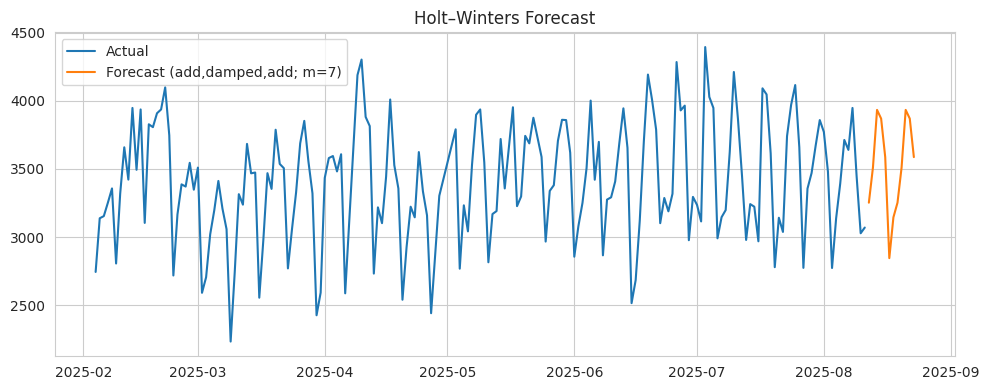

== Best ETS (Holt–Winters) by AICc ==
trend=add, damped=True, seasonal=add, m=7
AIC=2065.888, AICc≈2066.688, BIC=2104.788

== In-sample accuracy (train) ==
RMSE=221.809 | MAE=173.464 | sMAPE=5.07%

== Forecast head ==
2025-08-12    3252.463956
2025-08-13    3511.151372
2025-08-14    3933.752041
2025-08-15    3869.784383
2025-08-16    3587.126714
Freq: D, dtype: float64


In [193]:
# === Holt–Winters (ETS) quick auto for Colab: pick best by AICc, forecast & plot ===
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ---- INPUTS ----
m = 7          # chu kỳ mùa vụ (vd: 7 = tuần theo ngày; sửa cho phù hợp dữ liệu của bạn)
h = 12         # số kỳ dự báo
s = df.copy()

# (tuỳ chọn) Nếu có cột ngày thì dùng làm index thời gian
for cand in ["date","Date","DATE","ds","time","Time","timestamp"]:
    if cand in s.columns:
        s[cand] = pd.to_datetime(s[cand], errors="coerce")
        s = s.sort_values(cand).set_index(cand)
        break

y = pd.to_numeric(s["Value"], errors="coerce").dropna()
y = y.asfreq(y.index.inferred_freq) if isinstance(y.index, pd.DatetimeIndex) and y.index.inferred_freq else y

# ---- helper: AICc + metrics ----
def aicc(model):
    aic = model.aic
    n   = len(y)
    k   = model.params_constrained.shape[0] if hasattr(model, "params_constrained") else 8
    return aic + (2*k*(k+1))/(max(n-k-1, 1))

def rmse(a,b): return float(np.sqrt(np.mean((np.array(a)-np.array(b))**2)))
def mae(a,b):  return float(np.mean(np.abs(np.array(a)-np.array(b))))
def smape(a,b,eps=1e-8):
    a=np.array(a); b=np.array(b)
    return float(np.mean(2*np.abs(a-b)/(np.maximum(eps,np.abs(a)+np.abs(b))))*100)

# ---- candidate models (giống ETS AAA / AAdA / MAM trong R) ----
candidates = [
    dict(trend="add", damped_trend=False, seasonal="add"),   # AAA
    dict(trend="add", damped_trend=True,  seasonal="add"),   # AAdA (add + damped + add)
]
if (y > 0).all():
    candidates.append(dict(trend="mul", damped_trend=True, seasonal="mul"))  # MAM (chỉ dùng khi dữ liệu > 0)

best = None
res_list = []
for cfg in candidates:
    try:
        fit = ExponentialSmoothing(
            y,
            trend=cfg["trend"],
            damped_trend=cfg["damped_trend"],
            seasonal=cfg["seasonal"],
            seasonal_periods=m,
            initialization_method="estimated"
        ).fit(optimized=True, use_brute=True)
        res_list.append((cfg, fit, aicc(fit)))
        if best is None or res_list[-1][2] < best[2]:
            best = res_list[-1]
    except Exception as e:
        print(f"Skip {cfg}: {e}")

assert best is not None, "Không fit được mô hình nào. Hãy kiểm tra m, dữ liệu, và tính dương nếu dùng multiplicative."

cfg, fit, best_aicc = best
yhat = fit.fittedvalues
fc = fit.forecast(h)

# ---- plot ----
plt.figure(figsize=(10,4))
if isinstance(y.index, pd.DatetimeIndex):
    plt.plot(y.index, y, label="Actual")
    future_idx = pd.date_range(y.index[-1], periods=h+1, freq=(y.index.freq or y.index.inferred_freq))[1:]
    plt.plot(future_idx, fc, label=f"Forecast ({cfg['trend']},{'damped' if cfg['damped_trend'] else 'no-damp'},{cfg['seasonal']}; m={m})")
else:
    plt.plot(range(len(y)), y, label="Actual")
    plt.plot(range(len(y), len(y)+h), fc, label=f"Forecast ({cfg['trend']},{'damped' if cfg['damped_trend'] else 'no-damp'},{cfg['seasonal']}; m={m})")
plt.title("Holt–Winters Forecast")
plt.legend(); plt.grid(True); plt.tight_layout()
plt.show()

# ---- in kết quả ----
print("== Best ETS (Holt–Winters) by AICc ==")
print(f"trend={cfg['trend']}, damped={cfg['damped_trend']}, seasonal={cfg['seasonal']}, m={m}")
print(f"AIC={fit.aic:.3f}, AICc≈{best_aicc:.3f}, BIC={fit.bic:.3f}")

print("\n== In-sample accuracy (train) ==")
print(f"RMSE={rmse(y, yhat):.3f} | MAE={mae(y, yhat):.3f} | sMAPE={smape(y, yhat):.2f}%")

print("\n== Forecast head ==")
print(pd.Series(fc).head())

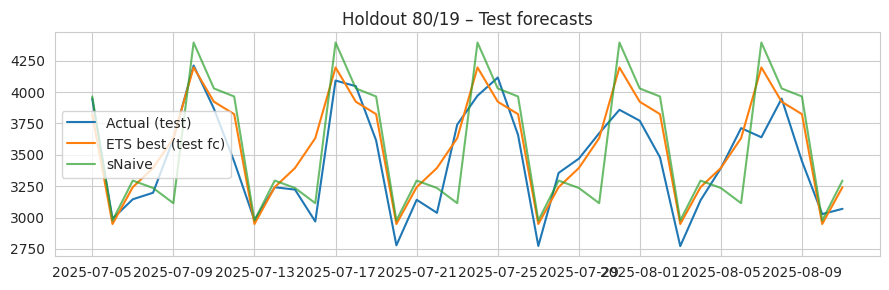

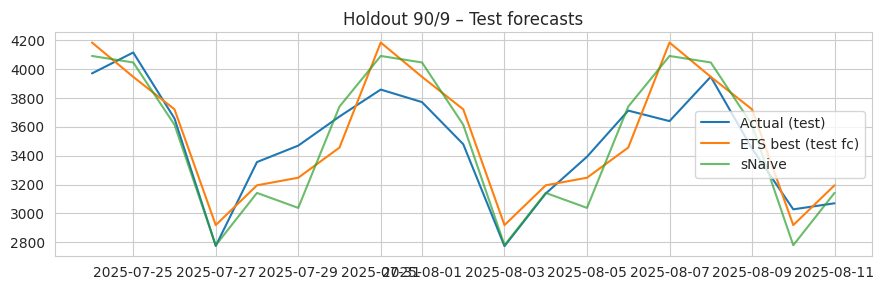

== Cross-validation (80/20 & 90/10) – Naive / sNaive / ETS(best) ==


,split,model,RMSE,MAE,sMAPE
2,80/19,ETS(best-config),222.790839,166.922146,4.759377
1,80/19,sNaive,323.168931,251.157895,7.026247
0,80/19,Naive,697.788367,584.710526,16.207701
4,90/9,sNaive,210.520533,159.315789,4.546037
5,90/9,ETS(best-config),220.926648,188.961713,5.308015
3,90/9,Naive,456.740915,353.631579,10.186476


In [194]:
# ====== CV nhanh (80/20 & 90/10) cho ETS tốt nhất + baseline (Naive/sNaive) ======
def _rmse(a,b): float(np.sqrt(np.mean((np.array(a)-np.array(b))**2)))
def _mae(a,b):  float(np.mean(np.abs(np.array(a)-np.array(b))))
def _smape(a,b,eps=1e-8):
    a=np.array(a); b=np.array(b)
    return float(np.mean(2*np.abs(a-b)/(np.maximum(eps, np.abs(a)+np.abs(b))))*100)

def _cv_once(y, split_ratio, m):
    n  = len(y)
    ntr = max(10, int(np.floor(n*split_ratio)))
    ntr = min(ntr, n-2)
    ytr = y.iloc[:ntr] if isinstance(y, pd.Series) else y[:ntr]
    yte = y.iloc[ntr:] if isinstance(y, pd.Series) else y[ntr:]
    h   = len(yte)

    # baseline naive / sNaive
    naive_last = ytr.iloc[-1] if isinstance(ytr, pd.Series) else ytr[-1]
    pred_naive = np.repeat(naive_last, h)
    if isinstance(ytr.index, pd.DatetimeIndex) and m>=2:
        # sNaive: lấy giá trị cùng pha mùa vụ gần nhất
        pred_snaive = ytr.tail(m).values[:h] if h<=m else np.resize(ytr.tail(m).values, h)
    else:
        pred_snaive = pred_naive.copy()

    # retrain ETS best-config trên train
    fit_tr = ExponentialSmoothing(
        ytr, trend=cfg["trend"], damped_trend=cfg["damped_trend"],
        seasonal=cfg["seasonal"], seasonal_periods=m,
        initialization_method="estimated"
    ).fit(optimized=True, use_brute=True)
    pred_ets = fit_tr.forecast(h)

    rows = []
    def row(name, yhat):
        rows.append(dict(
            split=f"{int(split_ratio*100)}/{int((1-split_ratio)*100)}",
            model=name,
            RMSE=rmse(yte, yhat),
            MAE=mae(yte, yhat),
            sMAPE=smape(yte, yhat)
        ))
    row("Naive",   pred_naive)
    row("sNaive",  pred_snaive)
    row("ETS(best-config)", pred_ets)

    # plot actual vs forecast (test)
    plt.figure(figsize=(9,3))
    if isinstance(y.index, pd.DatetimeIndex):
        plt.plot(yte.index, yte.values, label="Actual (test)")
        plt.plot(yte.index, pred_ets, label="ETS best (test fc)")
        plt.plot(yte.index, pred_snaive, label="sNaive", alpha=0.7)
    else:
        idx = np.arange(ntr, ntr+h)
        plt.plot(idx, np.asarray(yte), label="Actual (test)")
        plt.plot(idx, np.asarray(pred_ets), label="ETS best (test fc)")
        plt.plot(idx, np.asarray(pred_snaive), label="sNaive", alpha=0.7)
    plt.title(f"Holdout {int(split_ratio*100)}/{int((1-split_ratio)*100)} – Test forecasts")
    plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()

    return pd.DataFrame(rows)

cv_8020 = _cv_once(y, 0.80, m)
cv_9010 = _cv_once(y, 0.90, m)
cv_tbl  = pd.concat([cv_8020, cv_9010], ignore_index=True)
print("== Cross-validation (80/20 & 90/10) – Naive / sNaive / ETS(best) ==")
display(cv_tbl.sort_values(["split","sMAPE"]))

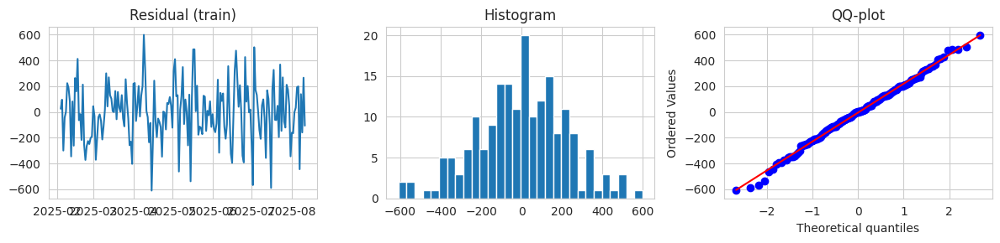

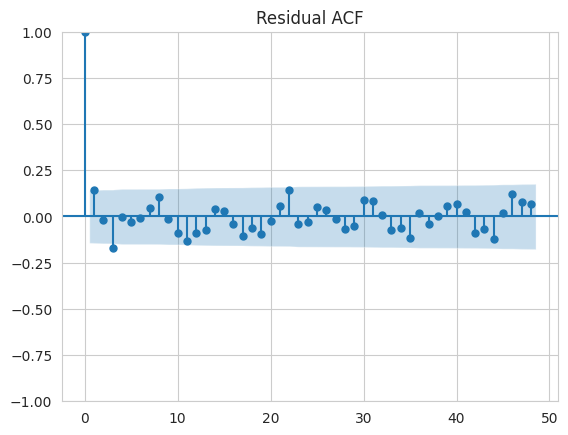

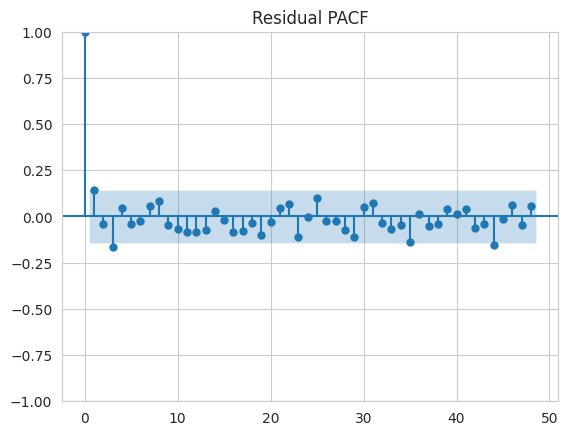

In [195]:
# ====== Residual diagnostics cho mô hình ETS tốt nhất ======
resid = y - yhat  # in-sample residual
fig, axes = plt.subplots(1,3, figsize=(12,3))
axes[0].plot(resid); axes[0].set_title("Residual (train)")
axes[1].hist(resid, bins=30); axes[1].set_title("Histogram")
import scipy.stats as st
st.probplot(resid, dist="norm", plot=axes[2]); axes[2].set_title("QQ-plot")
plt.tight_layout(); plt.show()

# ACF/PACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(resid, lags=min(48, len(y)//2)); plt.title("Residual ACF"); plt.show()
plot_pacf(resid, lags=min(48, len(y)//2), method="ywm"); plt.title("Residual PACF"); plt.show()

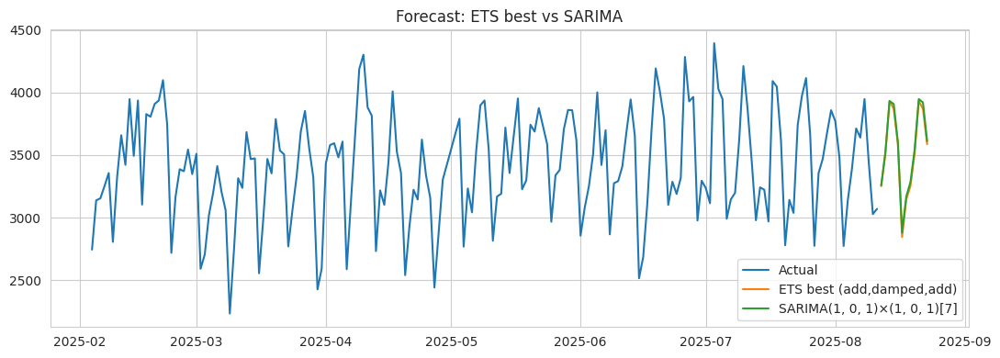

== CV (80/20 & 90/10): Naive / sNaive / ETS(best) / SARIMA-known ==


,split,model,RMSE,MAE,sMAPE
2,80/19,ETS(best),222.790839,166.922146,4.759377
3,80/19,"SARIMA(1, 0, 1)x(1, 0, 1)[7]",208.785731,168.601872,4.817639
1,80/19,sNaive,323.168931,251.157895,7.026247
0,80/19,Naive,697.788367,584.710526,16.207701
5,90/9,sNaive,210.520533,159.315789,4.546037
6,90/9,ETS(best),220.926648,188.961713,5.308015
7,90/9,"SARIMA(1, 0, 1)x(1, 0, 1)[7]",226.561905,196.660985,5.521382
4,90/9,Naive,456.740915,353.631579,10.186476



== ETS best by AICc ==
{'trend': 'add', 'damped_trend': True, 'seasonal': 'add'}  | AIC: 2065.887505782235  | AICc≈ 2066.688  | BIC: 2104.788469962951
== SARIMA from R ==
order= (1, 0, 1)  seasonal_order= (1, 0, 1, 7)


In [196]:
# === Compare ETS (Holt–Winters best) vs SARIMA-known-from-R on df['Value'] ===
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ---------------- CONFIG ----------------
M_SEASON   = 7          # chu kỳ mùa vụ (ví dụ dữ liệu ngày có chu kỳ tuần -> 7)
H_FC       = 12         # số kỳ dự báo
SARIMA_ORD = (1,0,1)    # (p,d,q) từ R
SARIMA_SORD= (1,0,1,7)  # (P,D,Q,m) từ R  (nhớ m trùng M_SEASON)
APPLY_BOXCOX = False    # bật nếu bạn muốn làm giống R khi có Box-Cox
LAMBDA_R     = 1.0      # λ từ R (nếu APPLY_BOXCOX=True)

# ---------------- LOAD & PREP ----------------
s = df.copy()
for cand in ["date","Date","DATE","ds","time","Time","timestamp"]:
    if cand in s.columns:
        s[cand] = pd.to_datetime(s[cand], errors="coerce")
        s = s.sort_values(cand).set_index(cand)
        break

y_raw = pd.to_numeric(s["Value"], errors="coerce").dropna()

# optional: set freq if datetime index
if isinstance(y_raw.index, pd.DatetimeIndex):
    y_raw = y_raw.asfreq(y_raw.index.inferred_freq) if y_raw.index.inferred_freq else y_raw

# --------------- Box-Cox helpers (tùy chọn) ---------------
def boxcox_series(y, lam):
    y = pd.Series(y, index=getattr(y, "index", None))
    if lam == 0:
        return np.log(y)
    return (np.power(y, lam) - 1.0) / lam

def inv_boxcox_series(y_bc, lam):
    if lam == 0:
        return np.exp(y_bc)
    return np.power(lam * y_bc + 1.0, 1.0/lam)

if APPLY_BOXCOX:
    if (y_raw <= 0).any():
        raise ValueError("Box-Cox yêu cầu dữ liệu dương. Hãy dịch chuỗi lên mức >0 hoặc tắt APPLY_BOXCOX.")
    y_model = boxcox_series(y_raw, LAMBDA_R)
else:
    y_model = y_raw.copy()

# ---------------- ETS: chọn best theo AICc ----------------
def aicc_from_fit(fit, n_len):
    aic = fit.aic
    # ước lượng số tham số: dùng độ dài vector params (có thể khác giữa phiên bản)
    k = getattr(fit, "params_constrained", np.array([]))
    k = (k.shape[0] if hasattr(k, "shape") else 8) or 8
    return aic + (2*k*(k+1))/max(n_len-k-1, 1)

cands = [
    dict(trend="add", damped_trend=False, seasonal="add"),  # AAA
    dict(trend="add", damped_trend=True,  seasonal="add"),  # AAdA
]
if (y_model > 0).all():
    cands.append(dict(trend="mul", damped_trend=True, seasonal="mul"))  # MAM nếu dữ liệu dương

best = None
res_ets = []
for cfg in cands:
    try:
        fit = ExponentialSmoothing(
            y_model,
            trend=cfg["trend"], damped_trend=cfg["damped_trend"],
            seasonal=cfg["seasonal"], seasonal_periods=M_SEASON,
            initialization_method="estimated"
        ).fit(optimized=True, use_brute=True)
        aicc = aicc_from_fit(fit, len(y_model))
        res_ets.append((cfg, fit, aicc))
        if best is None or aicc < best[2]:
            best = (cfg, fit, aicc)
    except Exception as e:
        print("Skip ETS cfg", cfg, "->", e)

assert best is not None, "Không fit được ETS. Kiểm tra M_SEASON và dữ liệu."
cfg_ets, fit_ets, aicc_ets = best
yhat_ets = fit_ets.fittedvalues
fc_ets   = fit_ets.forecast(H_FC)

# nếu có Box-Cox, back-transform dự báo ETS để so sánh trên thang gốc
if APPLY_BOXCOX:
    yhat_ets_plot = inv_boxcox_series(yhat_ets, LAMBDA_R).reindex_like(y_raw)
    fc_ets_plot   = inv_boxcox_series(fc_ets,   LAMBDA_R)
else:
    yhat_ets_plot, fc_ets_plot = yhat_ets, fc_ets

# ---------------- SARIMA: bậc từ R ----------------
sar = SARIMAX(y_model, order=SARIMA_ORD, seasonal_order=SARIMA_SORD,
              enforce_stationarity=False, enforce_invertibility=False)
sar_fit = sar.fit(disp=False)
yhat_sar = sar_fit.fittedvalues
fc_sar   = sar_fit.get_forecast(steps=H_FC).predicted_mean

# back-transform nếu dùng Box-Cox
if APPLY_BOXCOX:
    yhat_sar_plot = inv_boxcox_series(yhat_sar, LAMBDA_R).reindex_like(y_raw)
    fc_sar_plot   = inv_boxcox_series(fc_sar,   LAMBDA_R)
else:
    yhat_sar_plot, fc_sar_plot = yhat_sar, fc_sar

# ---------------- Plot chồng forecast ----------------
plt.figure(figsize=(11,4))
if isinstance(y_raw.index, pd.DatetimeIndex):
    plt.plot(y_raw.index, y_raw, label="Actual")
    freq = y_raw.index.freq or y_raw.index.inferred_freq
    future_idx = pd.date_range(y_raw.index[-1], periods=H_FC+1, freq=freq)[1:] if freq else np.arange(len(y_raw), len(y_raw)+H_FC)
    plt.plot(future_idx, fc_ets_plot, label=f"ETS best ({cfg_ets['trend']},{'damped' if cfg_ets['damped_trend'] else 'no-damp'},{cfg_ets['seasonal']})")
    plt.plot(future_idx, fc_sar_plot, label=f"SARIMA{SARIMA_ORD}×{SARIMA_SORD[:-1]}[{SARIMA_SORD[-1]}]")
else:
    plt.plot(range(len(y_raw)), y_raw.values, label="Actual")
    plt.plot(range(len(y_raw), len(y_raw)+H_FC), np.asarray(fc_ets_plot), label=f"ETS best")
    plt.plot(range(len(y_raw), len(y_raw)+H_FC), np.asarray(fc_sar_plot), label=f"SARIMA")
plt.title("Forecast: ETS best vs SARIMA")
plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()

# ----------------- Metrics helpers -----------------
def rmse(a,b): return float(np.sqrt(np.mean((np.array(a)-np.array(b))**2)))
def mae(a,b):  return float(np.mean(np.abs(np.array(a)-np.array(b))))
def smape(a,b,eps=1e-8):
    a=np.array(a); b=np.array(b)
    return float(np.mean(2*np.abs(a-b)/(np.maximum(eps, np.abs(a)+np.abs(b))))*100)

# ----------------- CV holdout (80/20 & 90/10) -----------------
def cv_once(y_g, split_ratio):
    n = len(y_g)
    ntr = max(10, int(np.floor(n*split_ratio)))
    ntr = min(ntr, n-2)
    if isinstance(y_g, pd.Series):
        ytr_g, yte_g = y_g.iloc[:ntr], y_g.iloc[ntr:]
    else:
        ytr_g, yte_g = y_g[:ntr], y_g[ntr:]
    h = len(yte_g)

    # --- chuẩn bị chuỗi cho mô hình (Box-Cox nếu bật) ---
    if APPLY_BOXCOX:
        if (ytr_g <= 0).any(): raise ValueError("Box-Cox yêu cầu train dương.")
        ytr_m = boxcox_series(ytr_g, LAMBDA_R)
    else:
        ytr_m = ytr_g

    # ETS-best (refit với cfg_ets)
    fit_tr_ets = ExponentialSmoothing(
        ytr_m, trend=cfg_ets["trend"], damped_trend=cfg_ets["damped_trend"],
        seasonal=cfg_ets["seasonal"], seasonal_periods=M_SEASON,
        initialization_method="estimated"
    ).fit(optimized=True, use_brute=True)
    fc_ets_m = fit_tr_ets.forecast(h)
    fc_ets_g = inv_boxcox_series(fc_ets_m, LAMBDA_R) if APPLY_BOXCOX else fc_ets_m

    # SARIMA-known
    sar_tr = SARIMAX(ytr_m, order=SARIMA_ORD, seasonal_order=SARIMA_SORD,
                     enforce_stationarity=False, enforce_invertibility=False)
    sar_tr_fit = sar_tr.fit(disp=False)
    fc_sar_m = sar_tr_fit.get_forecast(steps=h).predicted_mean
    fc_sar_g = inv_boxcox_series(fc_sar_m, LAMBDA_R) if APPLY_BOXCOX else fc_sar_m

    # KPI
    rows = []
    def row(name, yhat):
        rows.append(dict(
            split=f"{int(split_ratio*100)}/{int((1-split_ratio)*100)}",
            model=name,
            RMSE=rmse(yte_g, yhat),
            MAE=mae(yte_g, yhat),
            sMAPE=smape(yte_g, yhat)
        ))

    # baselines
    last = ytr_g.iloc[-1] if isinstance(ytr_g, pd.Series) else ytr_g[-1]
    yhat_naive = np.repeat(last, h)
    if isinstance(ytr_g.index, pd.DatetimeIndex) and M_SEASON>=2:
        tail = ytr_g.tail(M_SEASON).values
        yhat_snaive = tail[:h] if h<=M_SEASON else np.resize(tail, h)
    else:
        yhat_snaive = yhat_naive

    row("Naive", yhat_naive)
    row("sNaive", yhat_snaive)
    row("ETS(best)", fc_ets_g)
    row(f"SARIMA{SARIMA_ORD}x{SARIMA_SORD[:-1]}[{SARIMA_SORD[-1]}]", fc_sar_g)

    return pd.DataFrame(rows)

    # KPI
    rows = []
    def row(name, yhat):
        rows.append(dict(
            split=f"{int(split_ratio*100)}/{int((1-split_ratio)*100)}",
            model=name,
            RMSE=rmse(yte_g, yhat),
            MAE=mae(yte_g, yhat),
            sMAPE=smape(yte_g, yhat)
        ))
    # baselines
    last = ytr_g.iloc[-1] if isinstance(ytr_g, pd.Series) else ytr_g[-1]
    yhat_naive = np.repeat(last, h)
    if isinstance(ytr_g.index, pd.DatetimeIndex) and M_SEASON>=2:
        tail = ytr_g.tail(M_SEASON).values
        yhat_snaive = tail[:h] if h<=M_SEASON else np.resize(tail, h)
    else:
        yhat_snaive = yhat_naive

    row("Naive", yhat_naive)
    row("sNaive", yhat_snaive)
    row("ETS(best)", fc_ets_g)
    row(f"SARIMA{SARIMA_ORD}x{SARIMA_SORD[:-1]}[{SARIMA_SORD[-1]}]", fc_sar_g)

    return pd.DataFrame(rows)

cv_8020 = cv_once(y_raw, 0.80)
cv_9010 = cv_once(y_raw, 0.90)
cv_tbl  = pd.concat([cv_8020, cv_9010], ignore_index=True)
print("== CV (80/20 & 90/10): Naive / sNaive / ETS(best) / SARIMA-known ==")
display(cv_tbl.sort_values(["split","sMAPE"]))

# ----------------- In thông tin mô hình -----------------
print("\n== ETS best by AICc ==")
print(cfg_ets, " | AIC:", fit_ets.aic, " | AICc≈", round(aicc_ets,3), " | BIC:", fit_ets.bic)
print("== SARIMA from R ==")
print("order=", SARIMA_ORD, " seasonal_order=", SARIMA_SORD)

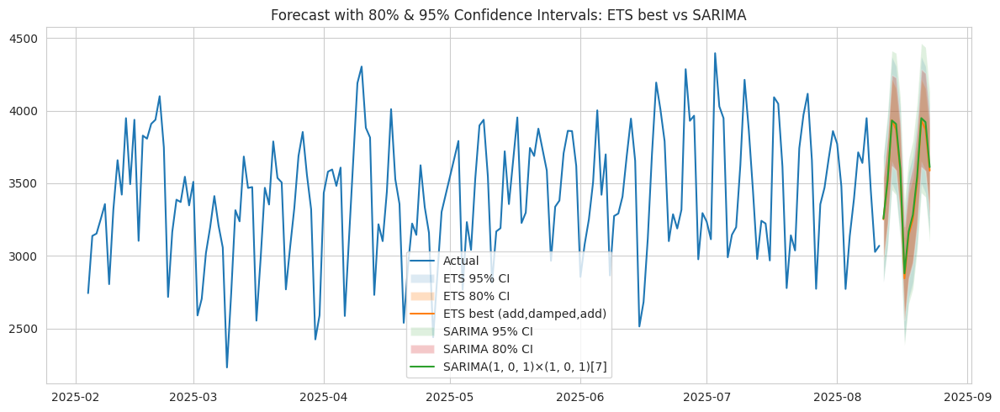

In [197]:
# ---------------- Plot chồng forecast + CI 80/95 ----------------
from scipy.stats import norm

# --- CI cho ETS (xấp xỉ): dùng sigma của residuals và giả định chuẩn
resid_ets = (y_model - yhat_ets).astype(float)  # trên thang dùng để fit (đã Box-Cox nếu APPLY_BOXCOX)
sigma_ets = float(np.nanstd(resid_ets, ddof=1))
z80, z95 = norm.ppf(0.9), norm.ppf(0.975)       # 80% = 10–90; 95% = 2.5–97.5

# với ETS không có var(h) nội tại trong statsmodels => dùng cùng sigma cho mọi h (xấp xỉ)
ets_lo80_m = fc_ets - z80*sigma_ets
ets_hi80_m = fc_ets + z80*sigma_ets
ets_lo95_m = fc_ets - z95*sigma_ets
ets_hi95_m = fc_ets + z95*sigma_ets

# back-transform nếu dùng Box-Cox
if APPLY_BOXCOX:
    ets_lo80 = inv_boxcox_series(ets_lo80_m, LAMBDA_R)
    ets_hi80 = inv_boxcox_series(ets_hi80_m, LAMBDA_R)
    ets_lo95 = inv_boxcox_series(ets_lo95_m, LAMBDA_R)
    ets_hi95 = inv_boxcox_series(ets_hi95_m, LAMBDA_R)
else:
    ets_lo80, ets_hi80 = ets_lo80_m, ets_hi80_m
    ets_lo95, ets_hi95 = ets_lo95_m, ets_hi95_m

# --- CI cho SARIMA: dùng conf_int sẵn có
sar_fc_obj_80 = sar_fit.get_forecast(steps=H_FC)
sar_ci80 = sar_fc_obj_80.conf_int(alpha=0.20)   # 80%
sar_fc_obj_95 = sar_fit.get_forecast(steps=H_FC)
sar_ci95 = sar_fc_obj_95.conf_int(alpha=0.05)   # 95%

# Lấy mean + dải (đã trên cùng thang với y_model; nếu Box-Cox bật, cần back-transform)
sar_mean = sar_fc_obj_95.predicted_mean
sar_lo80_m = sar_ci80.iloc[:, 0]; sar_hi80_m = sar_ci80.iloc[:, 1]
sar_lo95_m = sar_ci95.iloc[:, 0]; sar_hi95_m = sar_ci95.iloc[:, 1]

if APPLY_BOXCOX:
    sar_mean_plot = inv_boxcox_series(sar_mean,  LAMBDA_R)
    sar_lo80 = inv_boxcox_series(sar_lo80_m, LAMBDA_R); sar_hi80 = inv_boxcox_series(sar_hi80_m, LAMBDA_R)
    sar_lo95 = inv_boxcox_series(sar_lo95_m, LAMBDA_R); sar_hi95 = inv_boxcox_series(sar_hi95_m, LAMBDA_R)
else:
    sar_mean_plot = sar_mean
    sar_lo80, sar_hi80 = sar_lo80_m, sar_hi80_m
    sar_lo95, sar_hi95 = sar_lo95_m, sar_hi95_m

# --- Vẽ
plt.figure(figsize=(12,5))
if isinstance(y_raw.index, pd.DatetimeIndex):
    plt.plot(y_raw.index, y_raw, label="Actual")

    freq = y_raw.index.freq or y_raw.index.inferred_freq
    future_idx = pd.date_range(y_raw.index[-1], periods=H_FC+1, freq=freq)[1:] if freq else np.arange(len(y_raw), len(y_raw)+H_FC)

    # ETS: dải CI
    plt.fill_between(future_idx, np.asarray(ets_lo95), np.asarray(ets_hi95), alpha=0.15, label="ETS 95% CI")
    plt.fill_between(future_idx, np.asarray(ets_lo80), np.asarray(ets_hi80), alpha=0.25, label="ETS 80% CI")
    plt.plot(future_idx, np.asarray(fc_ets_plot), label=f"ETS best ({cfg_ets['trend']},{'damped' if cfg_ets['damped_trend'] else 'no-damp'},{cfg_ets['seasonal']})")

    # SARIMA: dải CI
    plt.fill_between(future_idx, np.asarray(sar_lo95), np.asarray(sar_hi95), alpha=0.15, label="SARIMA 95% CI")
    plt.fill_between(future_idx, np.asarray(sar_lo80), np.asarray(sar_hi80), alpha=0.25, label="SARIMA 80% CI")
    plt.plot(future_idx, np.asarray(sar_mean_plot), label=f"SARIMA{SARIMA_ORD}×{SARIMA_SORD[:-1]}[{SARIMA_SORD[-1]}]")

else:
    x_hist = np.arange(len(y_raw))
    x_fut  = np.arange(len(y_raw), len(y_raw)+H_FC)
    plt.plot(x_hist, y_raw.values, label="Actual")

    # ETS CI
    plt.fill_between(x_fut, np.asarray(ets_lo95), np.asarray(ets_hi95), alpha=0.15, label="ETS 95% CI")
    plt.fill_between(x_fut, np.asarray(ets_lo80), np.asarray(ets_hi80), alpha=0.25, label="ETS 80% CI")
    plt.plot(x_fut, np.asarray(fc_ets_plot), label="ETS best")

    # SARIMA CI
    plt.fill_between(x_fut, np.asarray(sar_lo95), np.asarray(sar_hi95), alpha=0.15, label="SARIMA 95% CI")
    plt.fill_between(x_fut, np.asarray(sar_lo80), np.asarray(sar_hi80), alpha=0.25, label="SARIMA 80% CI")
    plt.plot(x_fut, np.asarray(sar_mean_plot), label="SARIMA")

plt.title("Forecast with 80% & 95% Confidence Intervals: ETS best vs SARIMA")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [198]:
# === Trả về bảng dự báo số & CI (80% / 95%) cho n kỳ tới ===
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm

# --- Kiểm tra biến cần thiết ---
_required = ["y_raw","y_model","fit_ets","cfg_ets","sar_fit","H_FC","APPLY_BOXC0X","LAMBDA_R"]
# chấp nhận cả tên đúng APPLY_BOXCOX (cell trước), vá nếu cần
if "APPLY_BOXCOX" in globals() and "APPLY_BOXC0X" not in globals():
    APPLY_BOXC0X = APPLY_BOXCOX
if "LAMBDA_R" not in globals(): LAMBDA_R = 1.0
for v in ["y_raw","y_model","fit_ets","cfg_ets","sar_fit","H_FC","APPLY_BOXC0X","LAMBDA_R"]:
    if v not in globals():
        raise RuntimeError(f"Thiếu biến '{v}'. Hãy chạy cell so sánh ETS vs SARIMA trước.")

# --- Helper Box-Cox ---
def inv_boxcox_series(y_bc, lam):
    y_bc = pd.Series(y_bc)
    if lam == 0:
        return np.exp(y_bc)
    return np.power(lam * y_bc + 1.0, 1.0/lam)

# --- Tạo index cho tương lai ---
if isinstance(y_raw.index, pd.DatetimeIndex):
    freq = y_raw.index.freq or y_raw.index.inferred_freq
    future_idx = pd.date_range(y_raw.index[-1], periods=H_FC+1, freq=freq)[1:] if freq else pd.RangeIndex(len(y_raw), len(y_raw)+H_FC)
else:
    future_idx = pd.RangeIndex(len(y_raw), len(y_raw)+H_FC)

# --- 1) ETS (Holt–Winters) best: điểm & CI 80/95 (xấp xỉ chuẩn) ---
fc_ets_m = fit_ets.forecast(H_FC)                           # trên thang fit (đã Box-Cox nếu bật)
# ước lượng sigma từ phần dư in-sample
resid_ets = (pd.Series(y_model).iloc[-len(fit_ets.fittedvalues):].values - np.asarray(fit_ets.fittedvalues)).astype(float)
sigma_ets = float(np.nanstd(resid_ets, ddof=1))
z80, z95 = norm.ppf(0.90), norm.ppf(0.975)

ets_lo80_m = fc_ets_m - z80*sigma_ets
ets_hi80_m = fc_ets_m + z80*sigma_ets
ets_lo95_m = fc_ets_m - z95*sigma_ets
ets_hi95_m = fc_ets_m + z95*sigma_ets

if APPLY_BOXC0X:
    point_ets = inv_boxcox_series(fc_ets_m, LAMBDA_R).values
    lo80_ets  = inv_boxcox_series(ets_lo80_m, LAMBDA_R).values
    hi80_ets  = inv_boxcox_series(ets_hi80_m, LAMBDA_R).values
    lo95_ets  = inv_boxcox_series(ets_lo95_m, LAMBDA_R).values
    hi95_ets  = inv_boxcox_series(ets_hi95_m, LAMBDA_R).values
else:
    point_ets = np.asarray(fc_ets_m)
    lo80_ets, hi80_ets = np.asarray(ets_lo80_m), np.asarray(ets_hi80_m)
    lo95_ets, hi95_ets = np.asarray(ets_lo95_m), np.asarray(ets_hi95_m)

df_ets = pd.DataFrame({
    "model": [f"ETS best ({cfg_ets['trend']},{'damped' if cfg_ets['damped_trend'] else 'no-damp'},{cfg_ets['seasonal']})"]*H_FC,
    "time":  future_idx,
    "point": point_ets,
    "lo80":  lo80_ets, "hi80": hi80_ets,
    "lo95":  lo95_ets, "hi95": hi95_ets
})

# --- 2) SARIMA (đã biết từ R): điểm & CI 80/95 (chuẩn từ statsmodels) ---
sar_fc80 = sar_fit.get_forecast(steps=H_FC)
sar_ci80 = sar_fc80.conf_int(alpha=0.20)
sar_fc95 = sar_fit.get_forecast(steps=H_FC)
sar_ci95 = sar_fc95.conf_int(alpha=0.05)
sar_mean = sar_fc95.predicted_mean

# cột tên CI có thể khác nhau giữa versions; lấy min/max theo cột
sar_lo80_m = sar_ci80.min(axis=1); sar_hi80_m = sar_ci80.max(axis=1)
sar_lo95_m = sar_ci95.min(axis=1); sar_hi95_m = sar_ci95.max(axis=1)

if APPLY_BOXC0X:
    point_sar = inv_boxcox_series(sar_mean,  LAMBDA_R).values
    lo80_sar  = inv_boxcox_series(sar_lo80_m, LAMBDA_R).values
    hi80_sar  = inv_boxcox_series(sar_hi80_m, LAMBDA_R).values
    lo95_sar  = inv_boxcox_series(sar_lo95_m, LAMBDA_R).values
    hi95_sar  = inv_boxcox_series(sar_hi95_m, LAMBDA_R).values
else:
    point_sar = np.asarray(sar_mean)
    lo80_sar, hi80_sar = np.asarray(sar_lo80_m), np.asarray(sar_hi80_m)
    lo95_sar, hi95_sar = np.asarray(sar_lo95_m), np.asarray(sar_hi95_m)

df_sar = pd.DataFrame({
    "model": ["SARIMA"]*H_FC,
    "time":  future_idx,
    "point": point_sar,
    "lo80":  lo80_sar, "hi80": hi80_sar,
    "lo95":  lo95_sar, "hi95": hi95_sar
})

# --- Gộp & hiển thị ---
df_fc = pd.concat([df_ets, df_sar], ignore_index=True)
# sắp xếp và làm đẹp
df_fc = df_fc.sort_values(["model","time"]).reset_index(drop=True)
print("== BẢNG DỰ BÁO & CI (80%/95%) cho", H_FC, "kỳ tiếp theo ==")
display(df_fc)

== BẢNG DỰ BÁO & CI (80%/95%) cho 12 kỳ tiếp theo ==


,model,time,point,lo80,hi80,lo95,hi95
0,"ETS best (add,damped,add)",2025-08-12,3252.463956,2967.490450,3537.437463,2816.634588,3688.293325
1,"ETS best (add,damped,add)",2025-08-13,3511.151372,3226.177865,3796.124879,3075.322003,3946.980740
2,"ETS best (add,damped,add)",2025-08-14,3933.752041,3648.778534,4218.725547,3497.922672,4369.581409
3,"ETS best (add,damped,add)",2025-08-15,3869.784383,3584.810877,4154.757890,3433.955015,4305.613752
4,"ETS best (add,damped,add)",2025-08-16,3587.126714,3302.153208,3872.100221,3151.297346,4022.956083
5,"ETS best (add,damped,add)",2025-08-17,2845.502616,2560.529109,3130.476122,2409.673247,3281.331984
6,"ETS best (add,damped,add)",2025-08-18,3144.815736,2859.842229,3429.789242,2708.986367,3580.645104
7,"ETS best (add,damped,add)",2025-08-19,3252.463956,2967.490450,3537.437463,2816.634588,3688.293325
8,"ETS best (add,damped,add)",2025-08-20,3511.151372,3226.177865,3796.124879,3075.322003,3946.980740
9,"ETS best (add,damped,add)",2025-08-21,3933.752041,3648.778534,4218.725547,3497.922672,4369.581409


Đã lưu: forecast_with_ci_nextN.csv
